# IMPORTS

In [1]:
#Import everything we need
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras import datasets, layers, models
from datetime import datetime
from scipy.io import arff
import pandas as pd

# IMPORT DATASET

In [2]:
data = arff.loadarff('letter-recognition.arff')
df = pd.DataFrame(data[0])

df['class'] = df['class'].apply(lambda x : ord(x)-65)

Ntraining=19000 #Total is 20k

training_images=df.drop(columns='class')[:Ntraining]
testing_images=df.drop(columns='class')[Ntraining:]

training_labels=df['class'][:Ntraining]
testing_labels=df['class'][Ntraining:]

training_images

,x-box,y-box,width-box,heigth-box,npix,x-var-pix,y-var-pix,x2bar,y2bar,xybar,x2ybr,xy2br,x-ege,xegvy,y-ege,yegvx
0,2.0,8.0,3.0,5.0,1.0,8.0,13.0,0.0,6.0,6.0,10.0,8.0,0.0,8.0,0.0,8.0
1,5.0,12.0,3.0,7.0,2.0,10.0,5.0,5.0,4.0,13.0,3.0,9.0,2.0,8.0,4.0,10.0
2,4.0,11.0,6.0,8.0,6.0,10.0,6.0,2.0,6.0,10.0,3.0,7.0,3.0,7.0,3.0,9.0
3,7.0,11.0,6.0,6.0,3.0,5.0,9.0,4.0,6.0,4.0,4.0,10.0,6.0,10.0,2.0,8.0
4,2.0,1.0,3.0,1.0,1.0,8.0,6.0,6.0,6.0,6.0,5.0,9.0,1.0,7.0,5.0,10.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18995,4.0,11.0,6.0,8.0,4.0,6.0,11.0,2.0,3.0,6.0,11.0,9.0,2.0,10.0,1.0,8.0
18996,7.0,13.0,6.0,7.0,4.0,7.0,8.0,2.0,7.0,11.0,6.0,7.0,3.0,8.0,5.0,5.0
18997,6.0,8.0,9.0,7.0,10.0,9.0,8.0,5.0,4.0,7.0,6.0,7.0,13.0,10.0,7.0,5.0
18998,3.0,8.0,4.0,6.0,3.0,6.0,6.0,5.0,4.0,5.0,6.0,9.0,2.0,8.0,4.0,8.0


# TRAINING

In [6]:
#Create the NN (Convolutionals between MaxPoolings, Flatten, Dense layer and then get probabilities)
model=models.Sequential()
model.add(layers.Dense(16,activation='relu',input_shape = (16,)))
model.add(layers.Dense(32,activation= 'relu'))
model.add(layers.Dense(100,activation= 'relu'))
model.add(layers.Dense(8, activation='relu'))
model.add(layers.Dense(64,activation= 'relu'))
model.add(layers.Dense(32, activation='relu'))
#Finally let's get probabilities
model.add(layers.Dense(26,activation='softmax'))

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

#We say how many times the NN will see the training data (the generations I supose)
model.fit(training_images, training_labels, epochs=100, validation_data=(testing_images, testing_labels))

loss, accuracy = model.evaluate(testing_images, testing_labels)
print(f"Loss: {loss}")
print(f"Accuracy: {accuracy}")

model.save('letter_classifier11.model')

Epoch 1/100
594/594 [==============================] - 1s 2ms/step - loss: 2.1934 - accuracy: 0.3164 - val_loss: 1.6886 - val_accuracy: 0.4700
Epoch 2/100
594/594 [==============================] - 1s 1ms/step - loss: 1.4515 - accuracy: 0.5565 - val_loss: 1.4188 - val_accuracy: 0.5770
Epoch 3/100
594/594 [==============================] - 1s 2ms/step - loss: 1.2268 - accuracy: 0.6257 - val_loss: 1.2335 - val_accuracy: 0.6190
Epoch 4/100
594/594 [==============================] - 1s 2ms/step - loss: 1.0738 - accuracy: 0.6690 - val_loss: 1.1186 - val_accuracy: 0.6470
Epoch 5/100
594/594 [==============================] - 1s 2ms/step - loss: 0.9597 - accuracy: 0.6999 - val_loss: 1.0228 - val_accuracy: 0.6790
Epoch 6/100
594/594 [==============================] - 1s 2ms/step - loss: 0.8694 - accuracy: 0.7254 - val_loss: 1.0417 - val_accuracy: 0.6690
Epoch 7/100
594/594 [==============================] - 1s 2ms/step - loss: 0.8081 - accuracy: 0.7465 - val_loss: 0.8856 - val_accuracy: 0.7250

Epoch 58/100
594/594 [==============================] - 1s 2ms/step - loss: 0.2435 - accuracy: 0.9181 - val_loss: 0.4566 - val_accuracy: 0.8720
Epoch 59/100
594/594 [==============================] - 1s 2ms/step - loss: 0.2363 - accuracy: 0.9196 - val_loss: 0.4105 - val_accuracy: 0.8760
Epoch 60/100
594/594 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.9149 - val_loss: 0.4457 - val_accuracy: 0.8750
Epoch 61/100
594/594 [==============================] - 1s 2ms/step - loss: 0.2468 - accuracy: 0.9183 - val_loss: 0.4236 - val_accuracy: 0.8790
Epoch 62/100
594/594 [==============================] - 1s 2ms/step - loss: 0.2360 - accuracy: 0.9175 - val_loss: 0.4831 - val_accuracy: 0.8690
Epoch 63/100
594/594 [==============================] - 1s 2ms/step - loss: 0.2353 - accuracy: 0.9215 - val_loss: 0.4196 - val_accuracy: 0.8800
Epoch 64/100
594/594 [==============================] - 1s 2ms/step - loss: 0.2367 - accuracy: 0.9202 - val_loss: 0.4277 - val_accuracy:

In [37]:
#Create the NN (Convolutionals between MaxPoolings, Flatten, Dense layer and then get probabilities)
model=models.Sequential()
model.add(layers.Dense(16,activation='relu',input_shape = (16,)))
model.add(layers.Dense(100,activation= 'relu'))
model.add(layers.Dense(32,activation= 'relu'))
model.add(layers.Dense(400, activation='relu'))
model.add(layers.Dense(200,activation= 'relu'))
model.add(layers.Dense(100, activation='relu'))
model.add(layers.Dense(52, activation='relu'))
#Finally let's get probabilities
model.add(layers.Dense(26,activation='softmax'))

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

#We say how many times the NN will see the training data (the generations I supose)
model.fit(training_images, training_labels, epochs=100, validation_data=(testing_images, testing_labels))

loss, accuracy = model.evaluate(testing_images, testing_labels)
print(f"Loss: {loss}")
print(f"Accuracy: {accuracy}")

model.save('letter_classifier31.model')

Epoch 1/100
594/594 [==============================] - 2s 3ms/step - loss: 1.6078 - accuracy: 0.5044 - val_loss: 1.2119 - val_accuracy: 0.6140
Epoch 2/100
594/594 [==============================] - 2s 3ms/step - loss: 0.8718 - accuracy: 0.7253 - val_loss: 0.8172 - val_accuracy: 0.7510
Epoch 3/100
594/594 [==============================] - 2s 3ms/step - loss: 0.6474 - accuracy: 0.7919 - val_loss: 0.6713 - val_accuracy: 0.7880
Epoch 4/100
594/594 [==============================] - 2s 3ms/step - loss: 0.5283 - accuracy: 0.8277 - val_loss: 0.7537 - val_accuracy: 0.7720
Epoch 5/100
594/594 [==============================] - 2s 3ms/step - loss: 0.4473 - accuracy: 0.8532 - val_loss: 0.5634 - val_accuracy: 0.8030
Epoch 6/100
594/594 [==============================] - 2s 3ms/step - loss: 0.3861 - accuracy: 0.8733 - val_loss: 0.4520 - val_accuracy: 0.8540
Epoch 7/100
594/594 [==============================] - 2s 3ms/step - loss: 0.3474 - accuracy: 0.8837 - val_loss: 0.4879 - val_accuracy: 0.8520

Epoch 58/100
594/594 [==============================] - 1s 2ms/step - loss: 0.0927 - accuracy: 0.9685 - val_loss: 0.2875 - val_accuracy: 0.9250
Epoch 59/100
594/594 [==============================] - 1s 2ms/step - loss: 0.0720 - accuracy: 0.9749 - val_loss: 0.2918 - val_accuracy: 0.9360
Epoch 60/100
594/594 [==============================] - 1s 2ms/step - loss: 0.0901 - accuracy: 0.9714 - val_loss: 0.3148 - val_accuracy: 0.9350
Epoch 61/100
594/594 [==============================] - 1s 2ms/step - loss: 0.0813 - accuracy: 0.9738 - val_loss: 0.2172 - val_accuracy: 0.9540
Epoch 62/100
594/594 [==============================] - 1s 2ms/step - loss: 0.0800 - accuracy: 0.9729 - val_loss: 0.3034 - val_accuracy: 0.9280
Epoch 63/100
594/594 [==============================] - 1s 2ms/step - loss: 0.0702 - accuracy: 0.9762 - val_loss: 0.3490 - val_accuracy: 0.9370
Epoch 64/100
594/594 [==============================] - 1s 2ms/step - loss: 0.0719 - accuracy: 0.9763 - val_loss: 0.3357 - val_accuracy:

In [45]:
#Create the NN (Convolutionals between MaxPoolings, Flatten, Dense layer and then get probabilities)
model=models.Sequential()
model.add(layers.Dense(16,activation='relu',input_shape = (16,)))
model.add(layers.Dense(20,activation= 'relu'))
model.add(layers.Dense(30, activation='relu'))
#Finally let's get probabilities
model.add(layers.Dense(26,activation='softmax'))

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

#We say how many times the NN will see the training data (the generations I supose)
model.fit(training_images, training_labels, epochs=200, validation_data=(testing_images, testing_labels))

loss, accuracy = model.evaluate(testing_images, testing_labels)
print(f"Loss: {loss}")
print(f"Accuracy: {accuracy}")

model.save('letter_classifier21.model')

Epoch 1/200
594/594 [==============================] - 0s 839us/step - loss: 2.3421 - accuracy: 0.3337 - val_loss: 1.5676 - val_accuracy: 0.5360
Epoch 2/200
594/594 [==============================] - 0s 642us/step - loss: 1.3326 - accuracy: 0.6096 - val_loss: 1.2834 - val_accuracy: 0.6120
Epoch 3/200
594/594 [==============================] - 0s 642us/step - loss: 1.1568 - accuracy: 0.6620 - val_loss: 1.1767 - val_accuracy: 0.6370
Epoch 4/200
594/594 [==============================] - 0s 642us/step - loss: 1.0671 - accuracy: 0.6864 - val_loss: 1.0688 - val_accuracy: 0.6950
Epoch 5/200
594/594 [==============================] - 0s 635us/step - loss: 0.9959 - accuracy: 0.7057 - val_loss: 1.0452 - val_accuracy: 0.6810
Epoch 6/200
594/594 [==============================] - 0s 645us/step - loss: 0.9378 - accuracy: 0.7214 - val_loss: 0.9871 - val_accuracy: 0.6990
Epoch 7/200
594/594 [==============================] - 0s 626us/step - loss: 0.8903 - accuracy: 0.7347 - val_loss: 0.9442 - val_ac

594/594 [==============================] - 0s 601us/step - loss: 0.3205 - accuracy: 0.8968 - val_loss: 0.4311 - val_accuracy: 0.8720
Epoch 58/200
594/594 [==============================] - 0s 599us/step - loss: 0.3250 - accuracy: 0.8947 - val_loss: 0.4136 - val_accuracy: 0.8850
Epoch 59/200
594/594 [==============================] - 0s 601us/step - loss: 0.3181 - accuracy: 0.8942 - val_loss: 0.4179 - val_accuracy: 0.8890
Epoch 60/200
594/594 [==============================] - 0s 599us/step - loss: 0.3167 - accuracy: 0.8962 - val_loss: 0.4205 - val_accuracy: 0.8770
Epoch 61/200
594/594 [==============================] - 0s 599us/step - loss: 0.3170 - accuracy: 0.8981 - val_loss: 0.4250 - val_accuracy: 0.8770
Epoch 62/200
594/594 [==============================] - 0s 596us/step - loss: 0.3145 - accuracy: 0.8974 - val_loss: 0.4246 - val_accuracy: 0.8810
Epoch 63/200
594/594 [==============================] - 0s 603us/step - loss: 0.3129 - accuracy: 0.8976 - val_loss: 0.4303 - val_accuracy

594/594 [==============================] - 0s 599us/step - loss: 0.2556 - accuracy: 0.9151 - val_loss: 0.3934 - val_accuracy: 0.8910
Epoch 114/200
594/594 [==============================] - 0s 601us/step - loss: 0.2528 - accuracy: 0.9160 - val_loss: 0.4082 - val_accuracy: 0.8810
Epoch 115/200
594/594 [==============================] - 0s 593us/step - loss: 0.2600 - accuracy: 0.9144 - val_loss: 0.3977 - val_accuracy: 0.8900
Epoch 116/200
594/594 [==============================] - 0s 599us/step - loss: 0.2498 - accuracy: 0.9176 - val_loss: 0.4091 - val_accuracy: 0.8900
Epoch 117/200
594/594 [==============================] - 0s 599us/step - loss: 0.2528 - accuracy: 0.9164 - val_loss: 0.4082 - val_accuracy: 0.8870
Epoch 118/200
594/594 [==============================] - 0s 593us/step - loss: 0.2494 - accuracy: 0.9159 - val_loss: 0.4058 - val_accuracy: 0.8890
Epoch 119/200
594/594 [==============================] - 0s 599us/step - loss: 0.2518 - accuracy: 0.9181 - val_loss: 0.3740 - val_ac

Epoch 169/200
594/594 [==============================] - 0s 601us/step - loss: 0.2238 - accuracy: 0.9254 - val_loss: 0.3589 - val_accuracy: 0.9010
Epoch 170/200
594/594 [==============================] - 0s 601us/step - loss: 0.2192 - accuracy: 0.9266 - val_loss: 0.3697 - val_accuracy: 0.9000
Epoch 171/200
594/594 [==============================] - 0s 603us/step - loss: 0.2182 - accuracy: 0.9254 - val_loss: 0.3518 - val_accuracy: 0.9060
Epoch 172/200
594/594 [==============================] - 0s 603us/step - loss: 0.2190 - accuracy: 0.9271 - val_loss: 0.3956 - val_accuracy: 0.8940
Epoch 173/200
594/594 [==============================] - 0s 603us/step - loss: 0.2189 - accuracy: 0.9261 - val_loss: 0.3824 - val_accuracy: 0.9080
Epoch 174/200
594/594 [==============================] - 0s 601us/step - loss: 0.2194 - accuracy: 0.9273 - val_loss: 0.3456 - val_accuracy: 0.9000
Epoch 175/200
594/594 [==============================] - 0s 599us/step - loss: 0.2132 - accuracy: 0.9293 - val_loss: 0

In [38]:
#Create the NN (Convolutionals between MaxPoolings, Flatten, Dense layer and then get probabilities)
model=models.Sequential()
model.add(layers.Dense(16,activation='relu',input_shape = (16,)))
model.add(layers.Dense(1024,activation= 'relu'))
model.add(layers.Dense(512,activation= 'relu'))
model.add(layers.Dense(256,activation= 'relu'))
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dense(64,activation= 'relu'))
model.add(layers.Dense(52,activation= 'relu'))
#Finally let's get probabilities
model.add(layers.Dense(26,activation='softmax'))

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

#We say how many times the NN will see the training data (the generations I supose)
model.fit(training_images, training_labels, epochs=100, validation_data=(testing_images, testing_labels))

loss, accuracy = model.evaluate(testing_images, testing_labels)
print(f"Loss: {loss}")
print(f"Accuracy: {accuracy}")

model.save('letter_classifier41.model')

Epoch 1/100
594/594 [==============================] - 5s 8ms/step - loss: 1.5318 - accuracy: 0.5241 - val_loss: 1.0620 - val_accuracy: 0.6630
Epoch 2/100
594/594 [==============================] - 4s 7ms/step - loss: 0.7915 - accuracy: 0.7493 - val_loss: 0.7448 - val_accuracy: 0.7600
Epoch 3/100
594/594 [==============================] - 4s 7ms/step - loss: 0.5782 - accuracy: 0.8138 - val_loss: 0.5428 - val_accuracy: 0.8240
Epoch 4/100
594/594 [==============================] - 4s 7ms/step - loss: 0.4622 - accuracy: 0.8467 - val_loss: 0.5908 - val_accuracy: 0.8270
Epoch 5/100
594/594 [==============================] - 4s 7ms/step - loss: 0.3863 - accuracy: 0.8716 - val_loss: 0.3989 - val_accuracy: 0.8800
Epoch 6/100
594/594 [==============================] - 4s 7ms/step - loss: 0.3411 - accuracy: 0.8852 - val_loss: 0.4258 - val_accuracy: 0.8770
Epoch 7/100
594/594 [==============================] - 4s 7ms/step - loss: 0.3006 - accuracy: 0.9025 - val_loss: 0.4030 - val_accuracy: 0.8730

Epoch 58/100
594/594 [==============================] - 4s 7ms/step - loss: 0.0682 - accuracy: 0.9779 - val_loss: 0.2356 - val_accuracy: 0.9540
Epoch 59/100
594/594 [==============================] - 4s 7ms/step - loss: 0.0662 - accuracy: 0.9801 - val_loss: 0.2990 - val_accuracy: 0.9380
Epoch 60/100
594/594 [==============================] - 4s 7ms/step - loss: 0.0696 - accuracy: 0.9784 - val_loss: 0.2625 - val_accuracy: 0.9310
Epoch 61/100
594/594 [==============================] - 4s 7ms/step - loss: 0.0637 - accuracy: 0.9803 - val_loss: 0.2785 - val_accuracy: 0.9340
Epoch 62/100
594/594 [==============================] - 4s 7ms/step - loss: 0.0680 - accuracy: 0.9805 - val_loss: 0.1961 - val_accuracy: 0.9620
Epoch 63/100
594/594 [==============================] - 4s 7ms/step - loss: 0.0641 - accuracy: 0.9804 - val_loss: 0.2586 - val_accuracy: 0.9500
Epoch 64/100
594/594 [==============================] - 4s 7ms/step - loss: 0.0608 - accuracy: 0.9806 - val_loss: 0.2594 - val_accuracy:

# USE AN ALREADY TRAINED NN

1


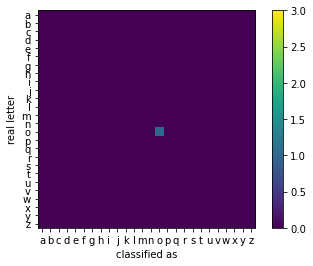

2


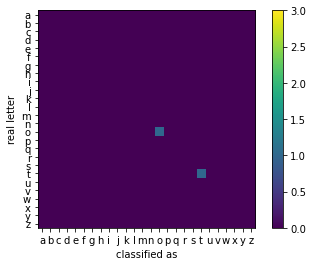

3


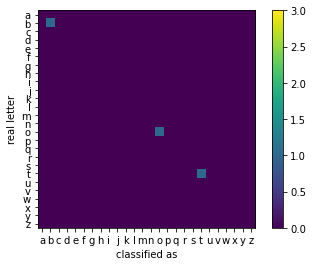

4


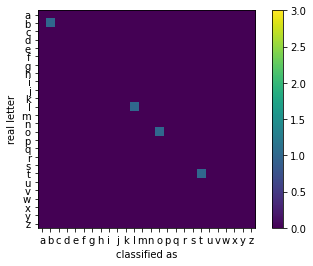

5


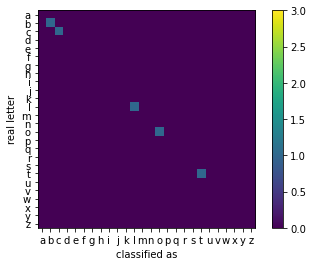

6


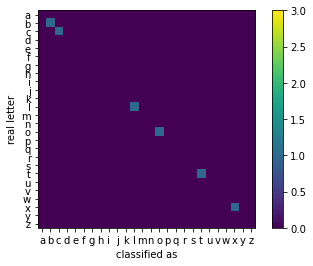

7


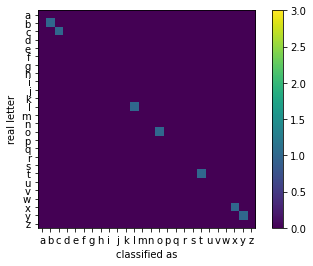

8


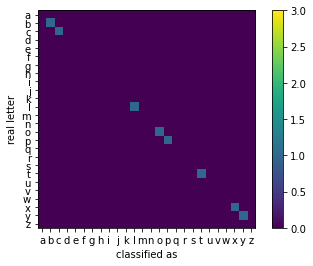

9


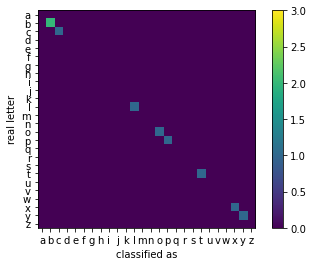

10


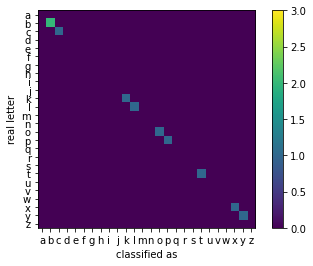

11


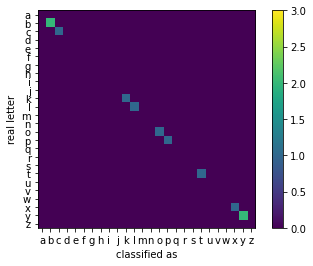

12


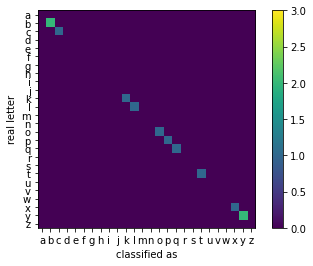

13


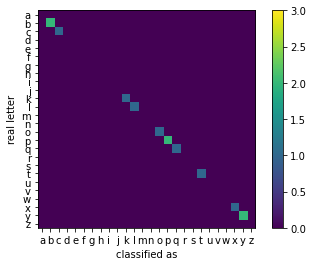

14


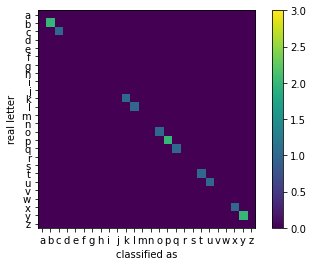

14


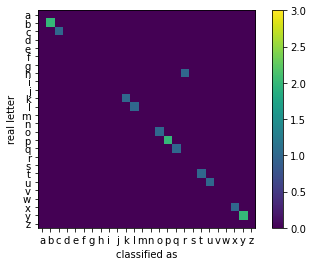

15


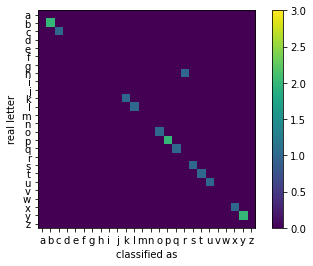

16


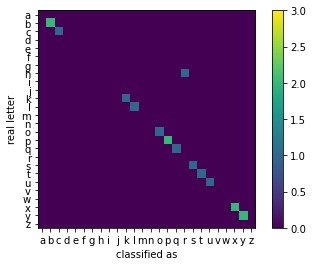

17


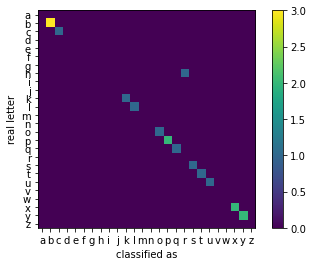

18


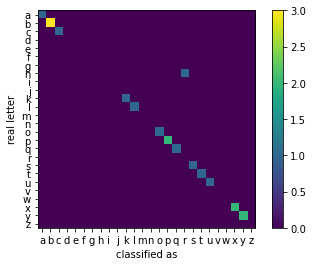

19


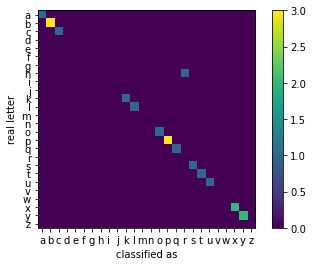

20


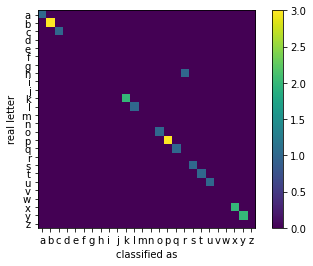

21


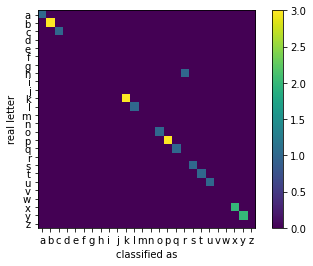

22


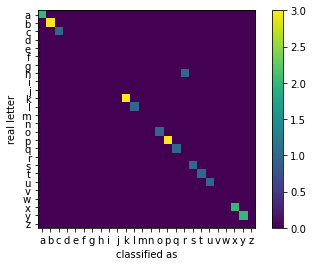

23


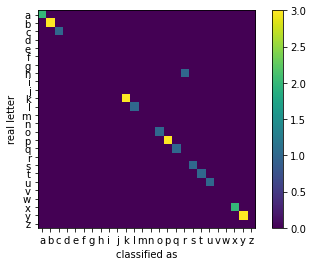

23


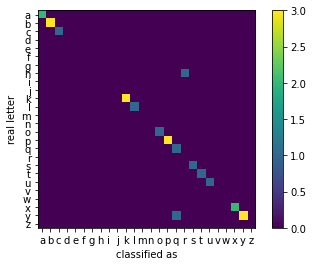

24


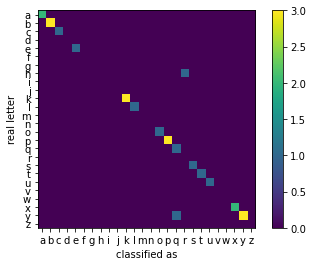

25


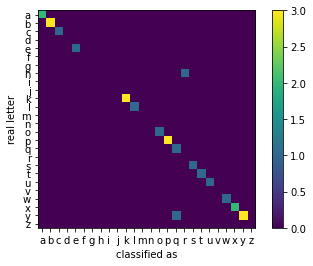

26


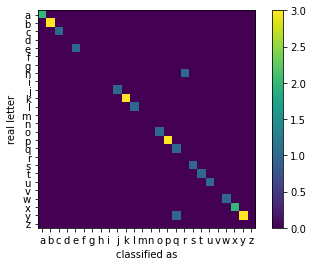

27


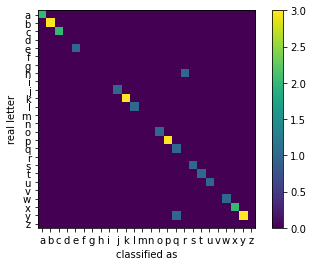

28


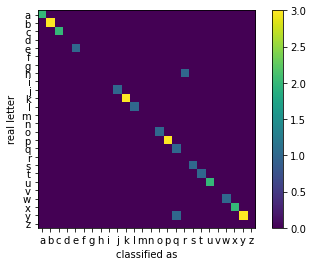

29


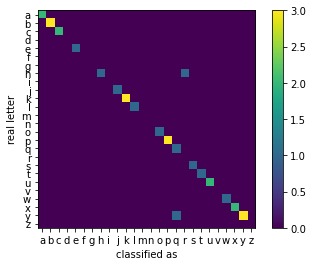

30


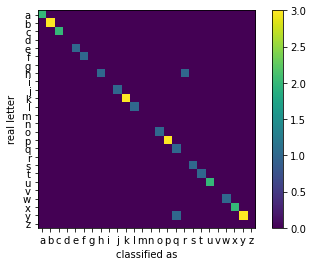

31


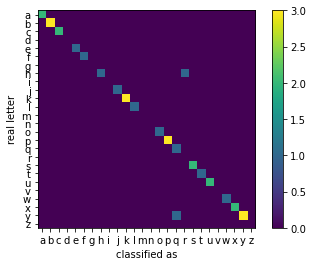

32


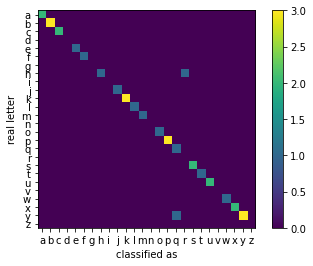

33


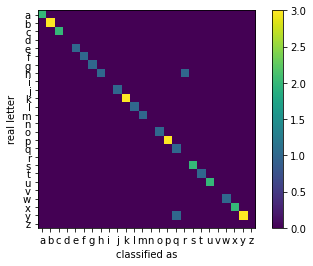

34


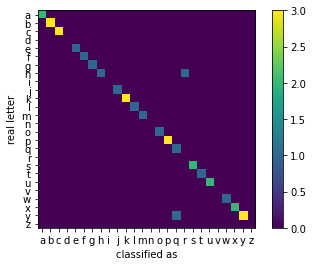

35


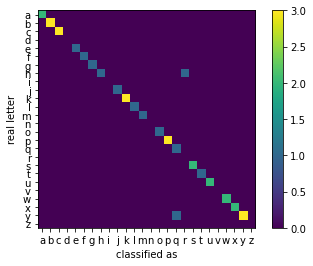

36


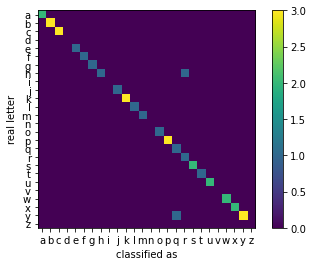

37


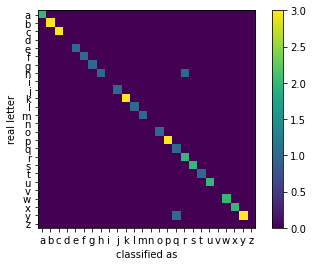

38


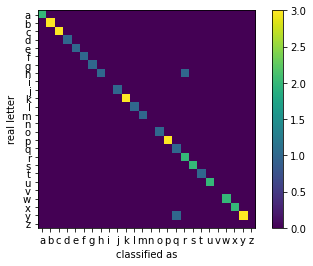

39


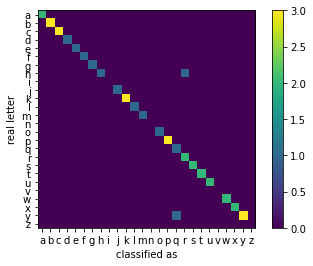

40


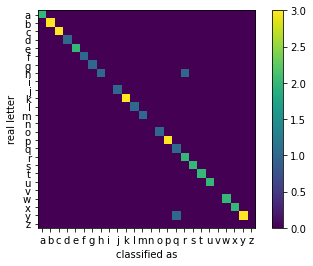

41


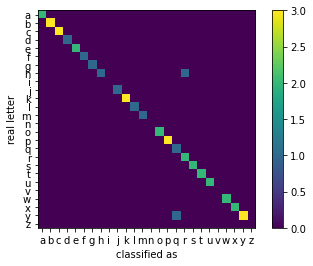

42


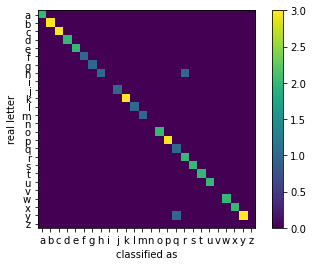

43


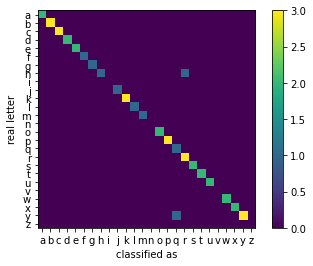

44


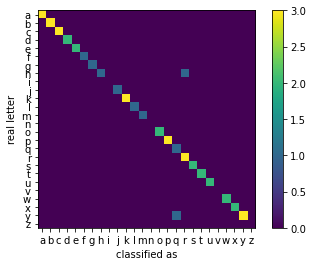

45


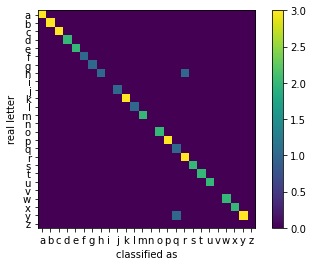

46


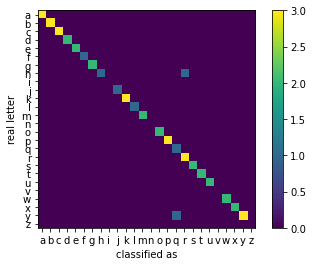

47


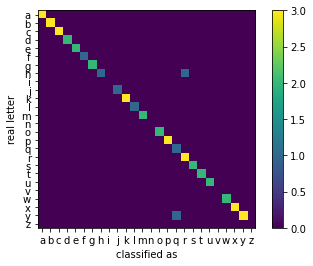

48


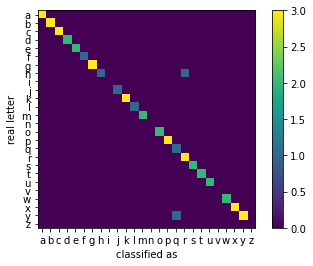

49


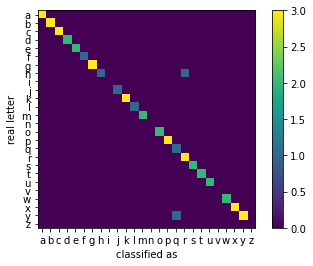

50


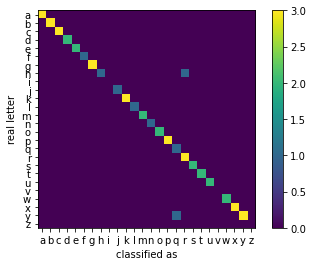

51


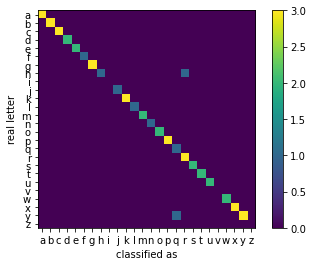

52


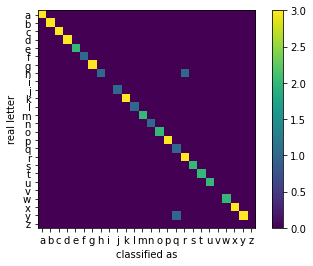

53


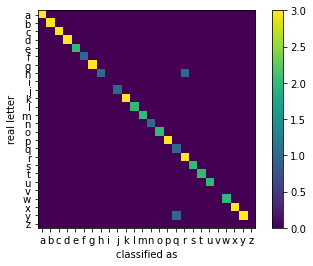

54


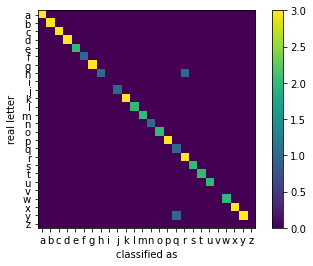

55


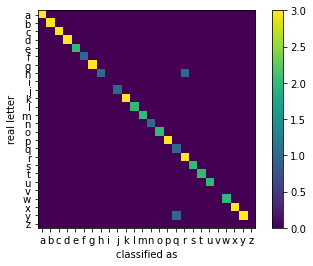

56


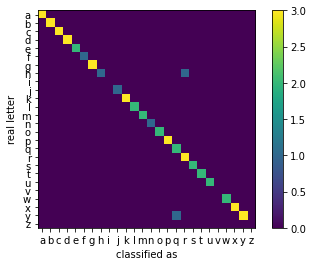

57


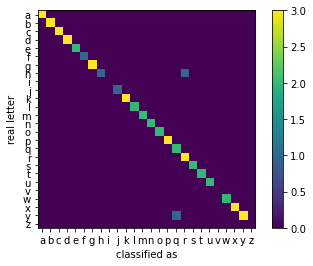

58


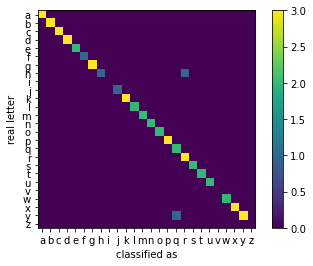

59


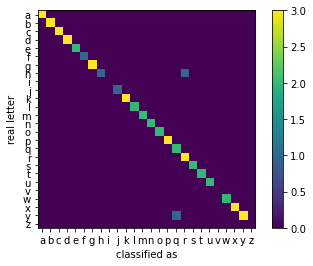

60


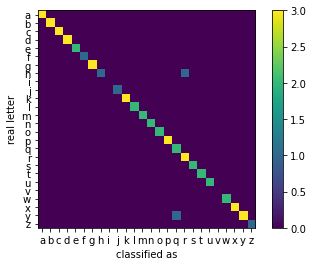

61


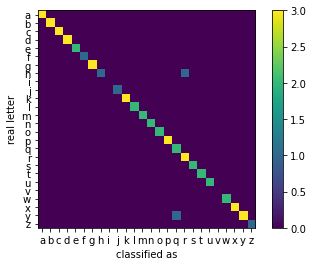

62


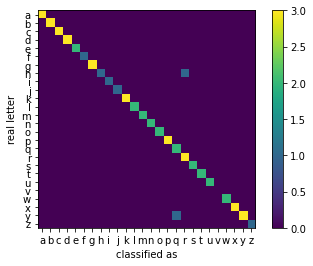

63


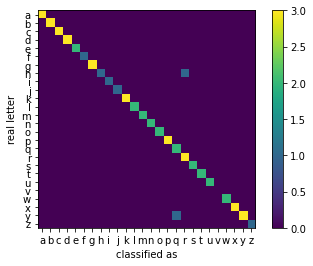

64


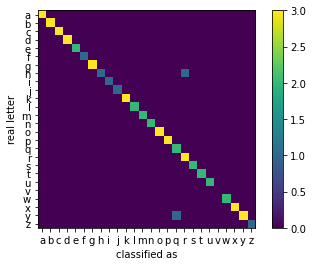

64


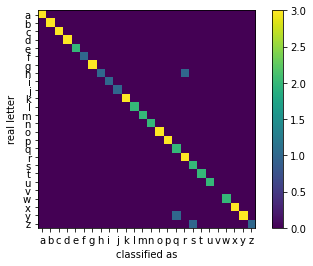

65


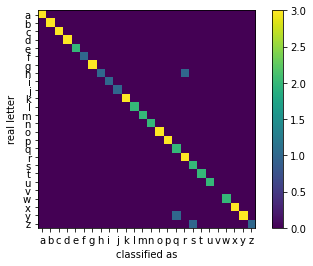

66


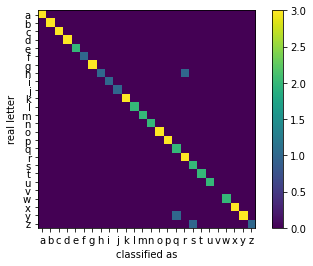

67


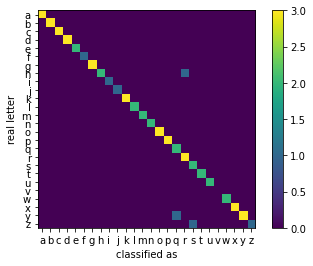

68


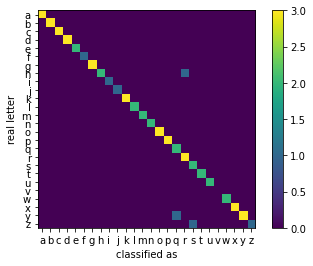

69


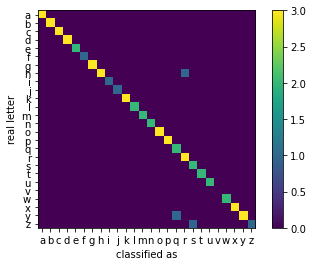

70


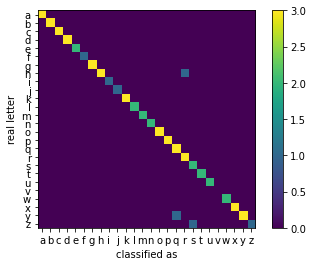

71


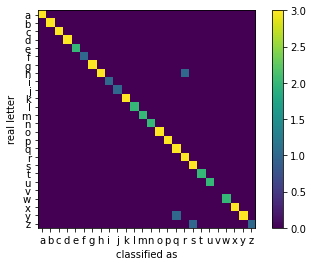

72


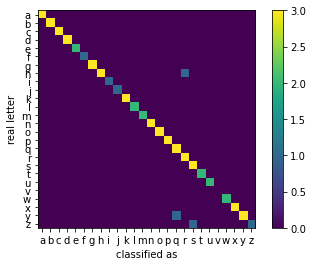

73


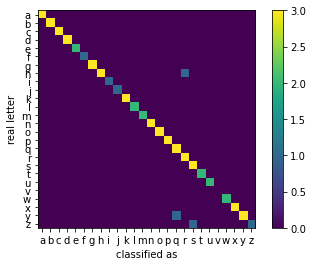

74


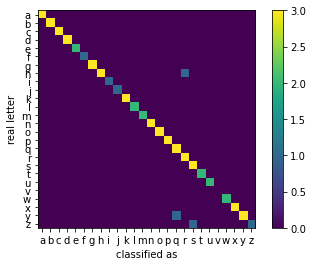

75


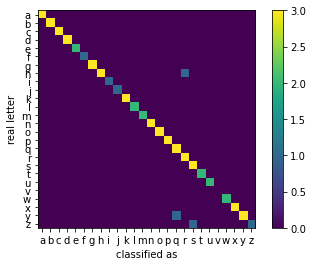

76


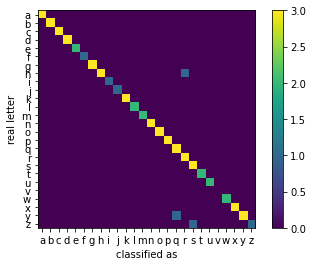

77


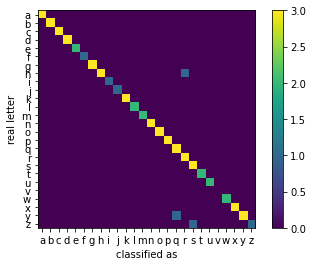

78


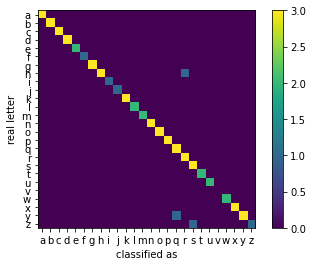

79


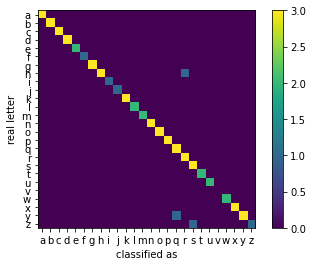

80


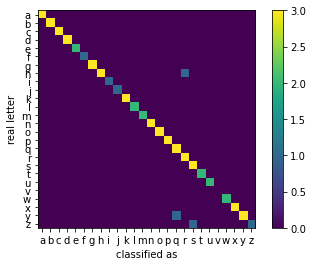

81


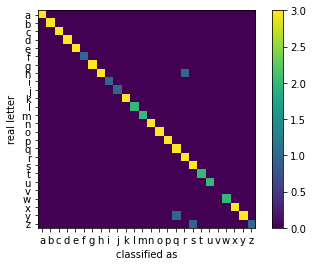

82


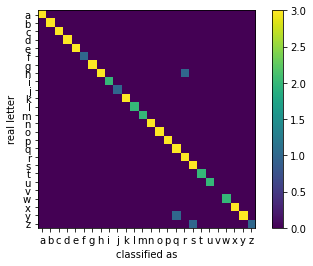

82


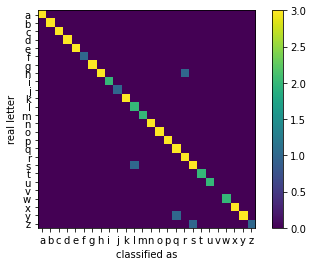

83


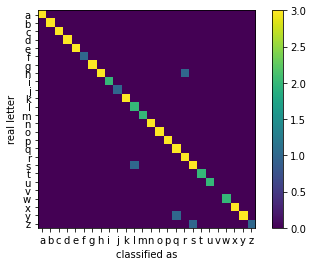

84


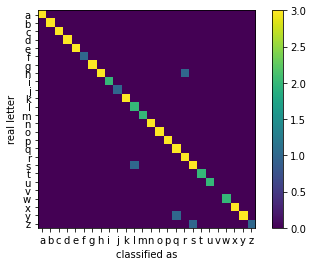

85


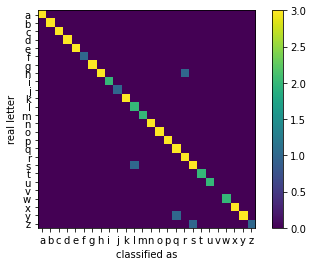

86


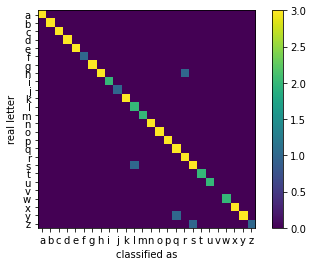

87


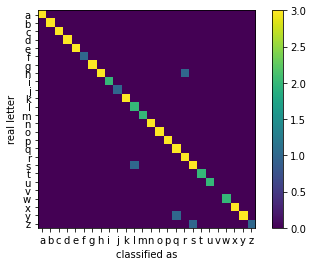

88


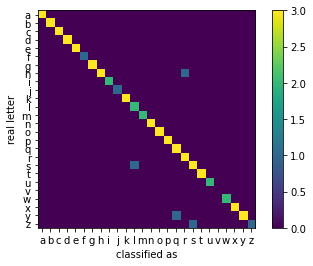

89


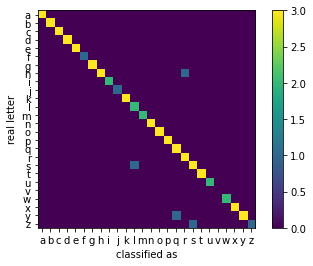

90


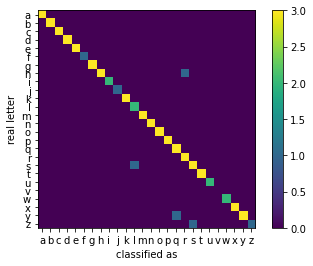

91


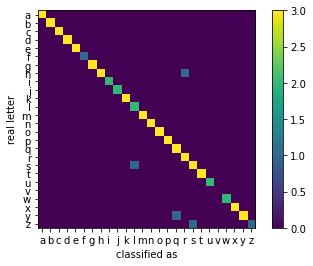

92


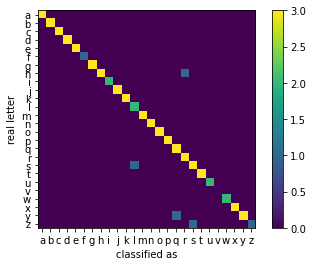

93


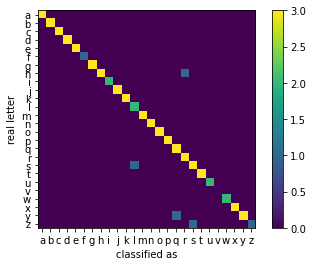

94


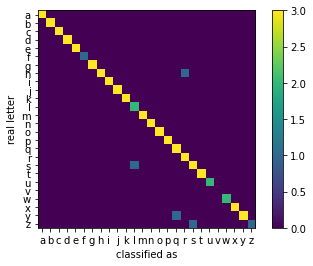

95


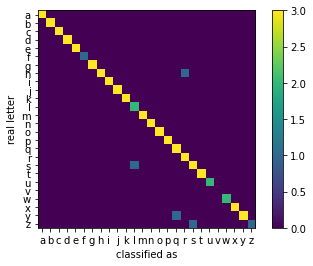

96


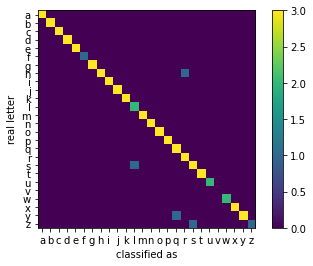

97


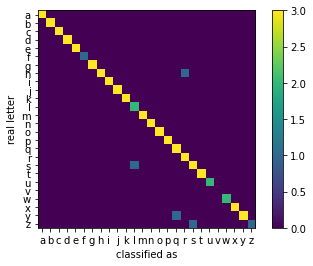

98


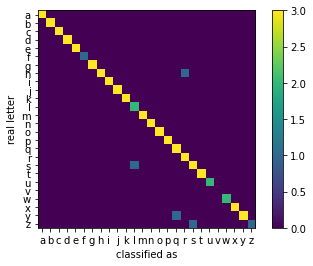

99


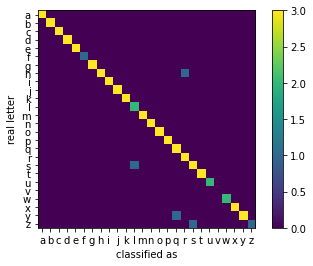

100


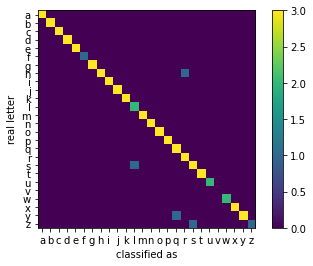

101


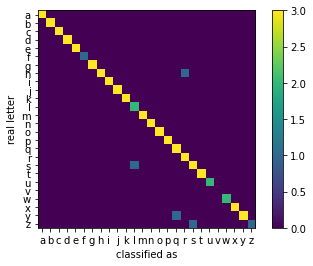

102


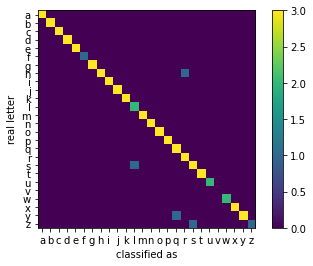

102


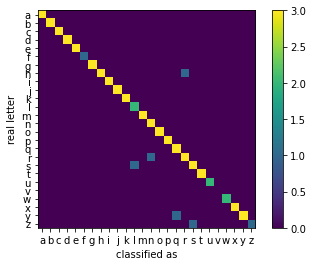

103


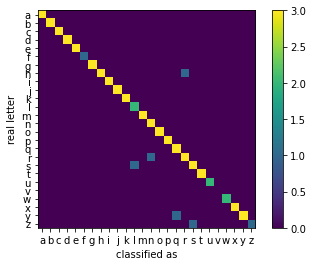

104


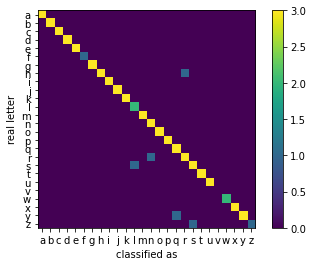

105


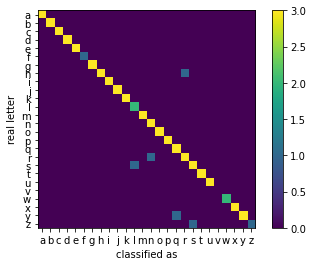

106


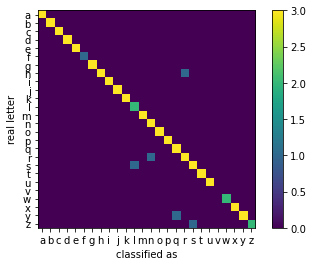

107


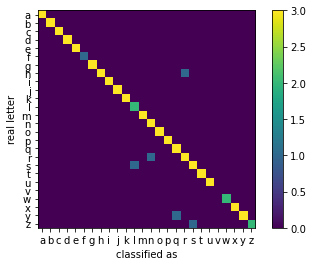

108


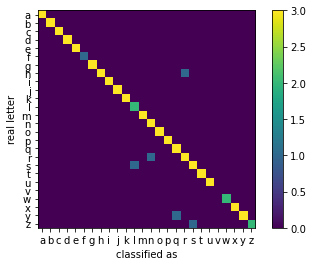

109


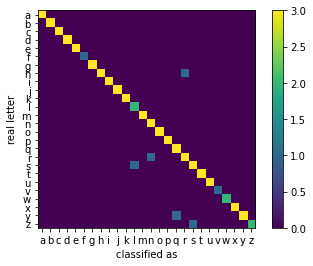

110


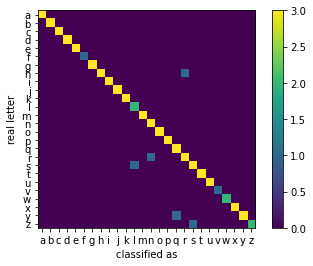

111


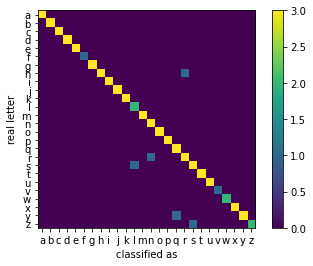

112


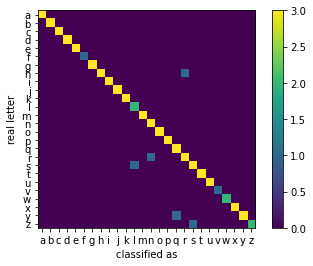

112


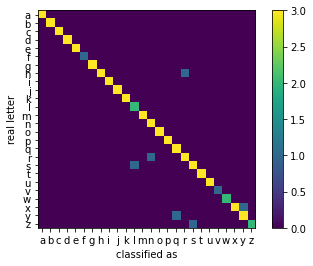

113


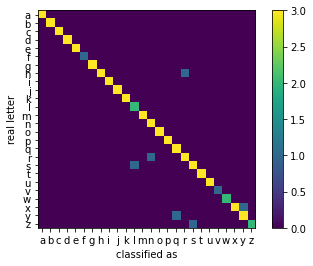

114


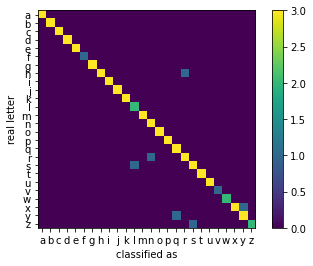

115


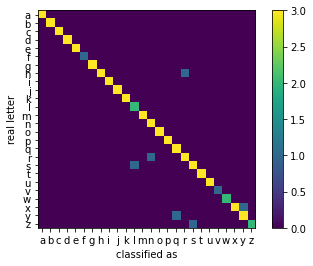

116


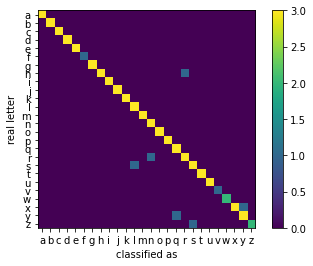

117


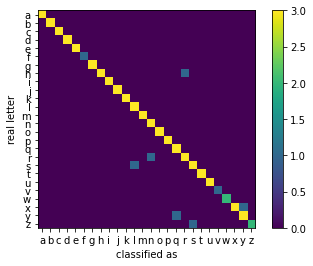

118


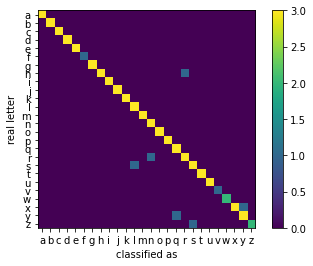

119


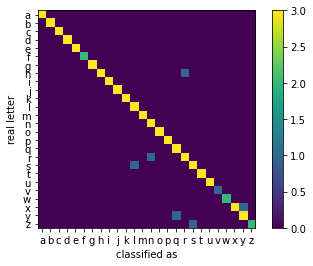

120


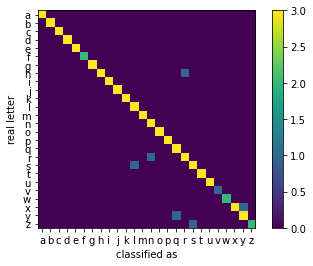

120


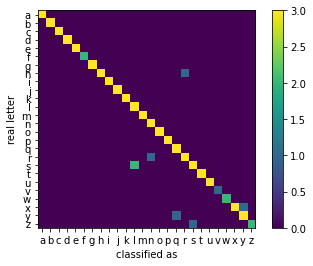

121


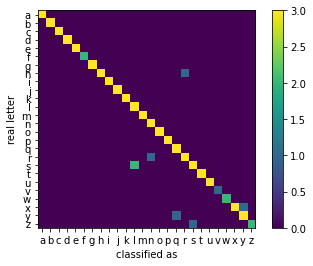

121


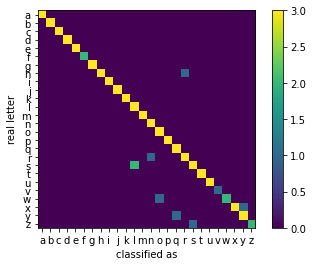

122


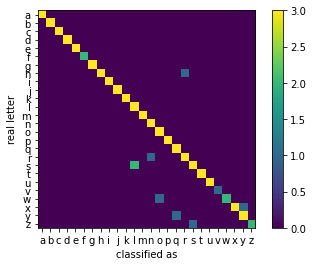

123


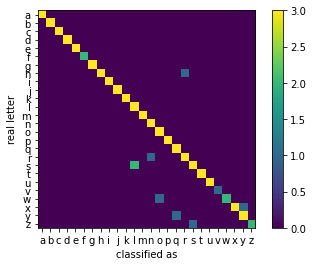

124


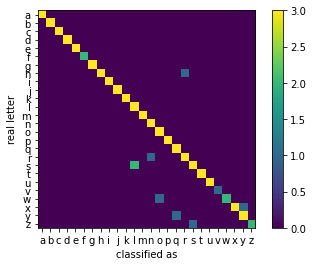

125


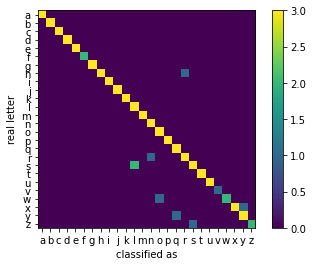

126


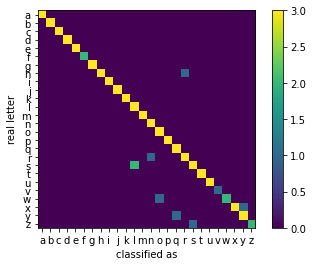

127


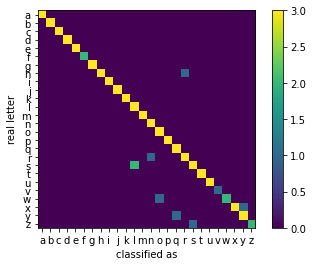

128


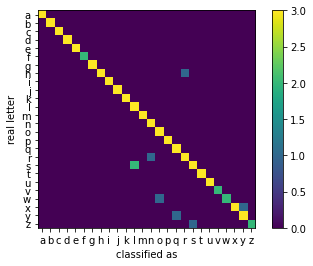

129


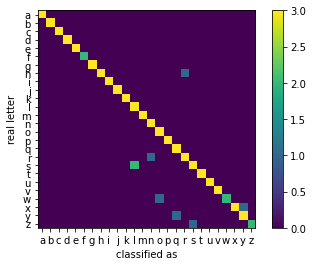

130


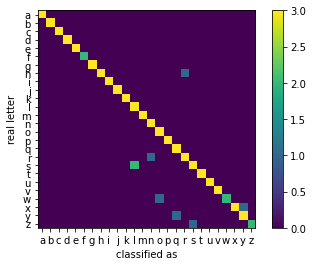

131


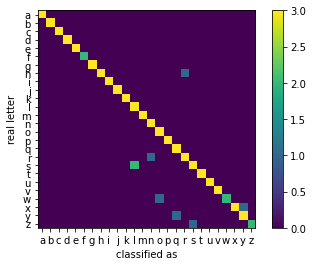

132


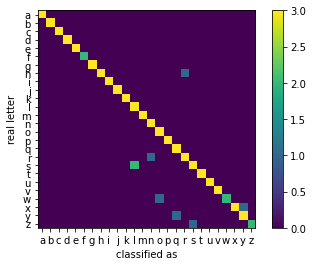

133


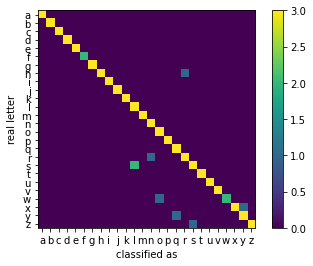

134


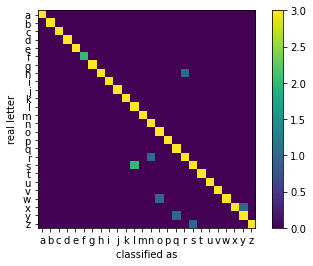

135


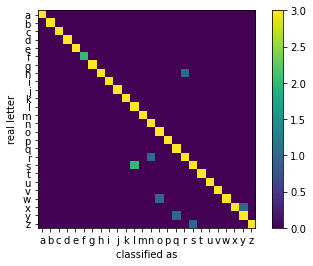

136


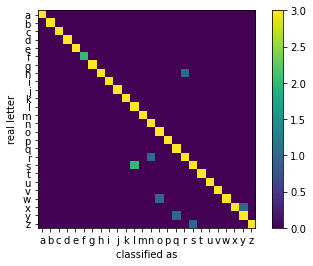

137


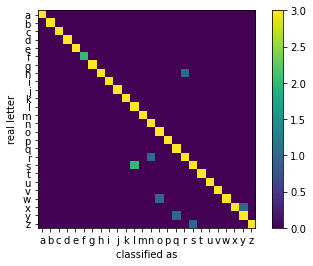

138


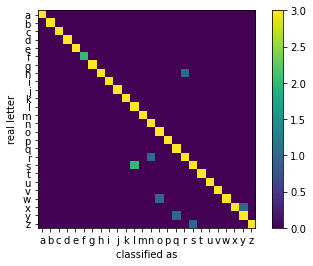

139


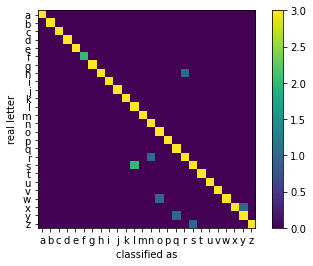

140


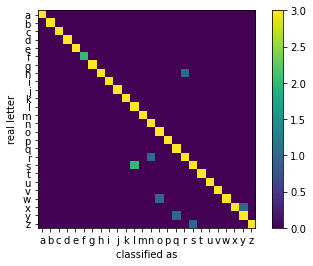

141


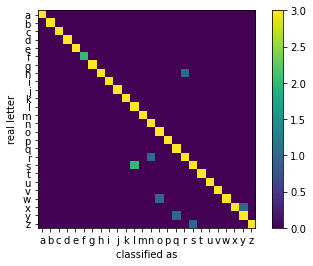

142


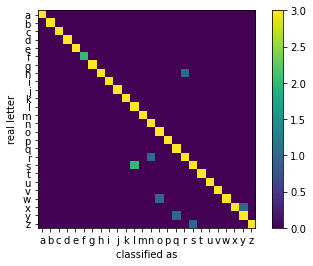

143


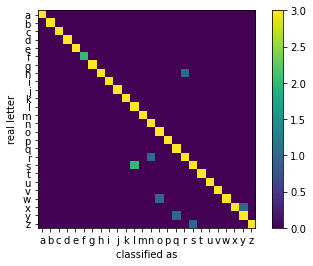

144


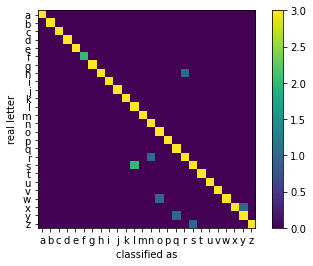

145


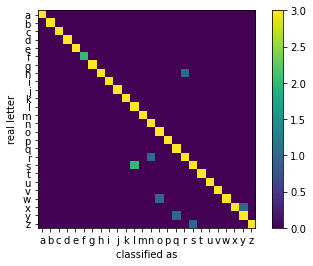

146


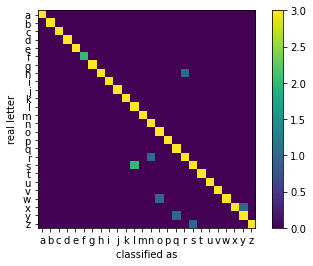

147


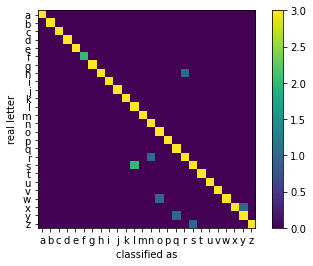

148


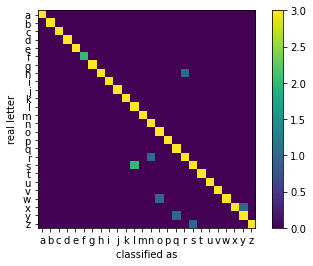

149


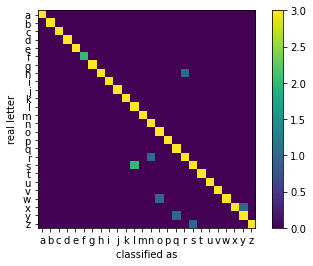

150


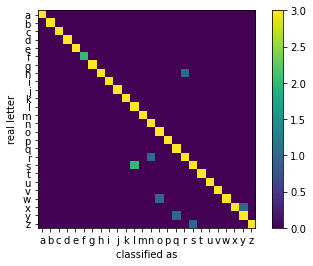

151


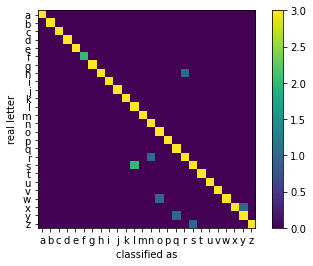

152


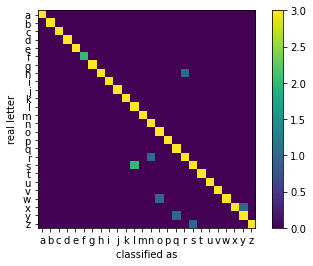

153


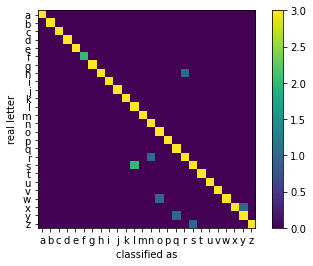

154


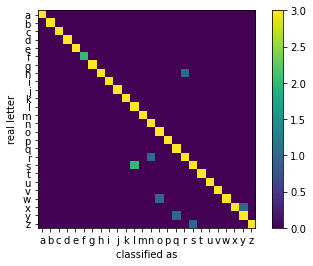

155


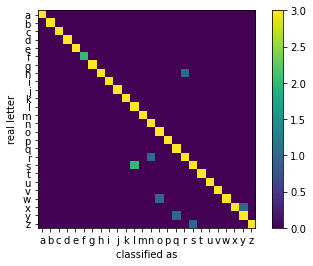

156


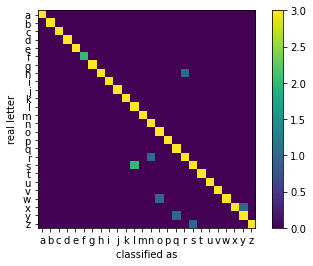

157


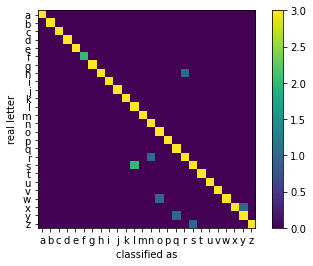

158


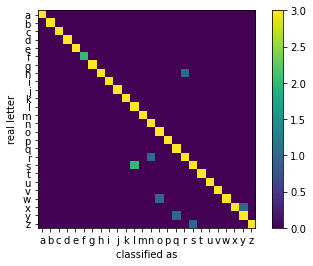

159


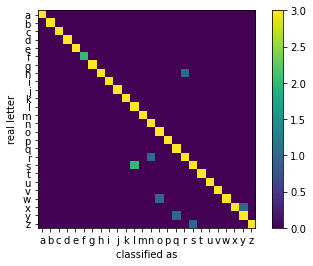

160


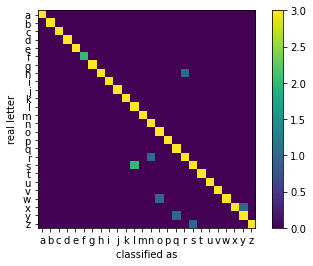

160


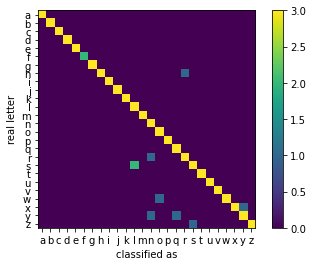

161


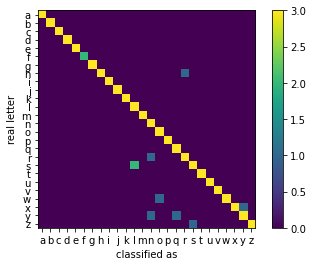

162


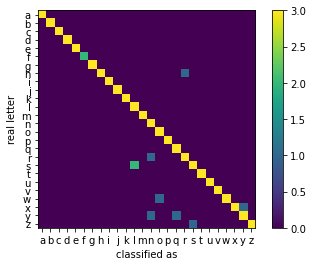

163


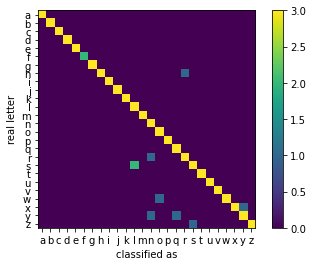

164


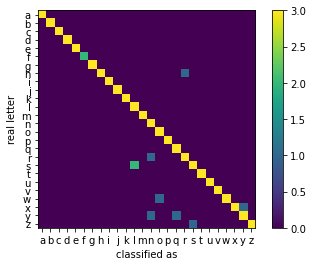

165


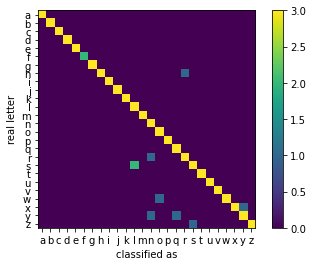

166


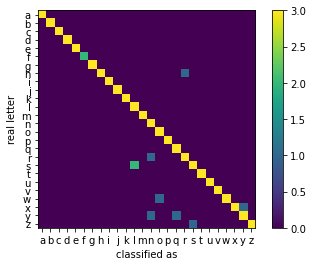

167


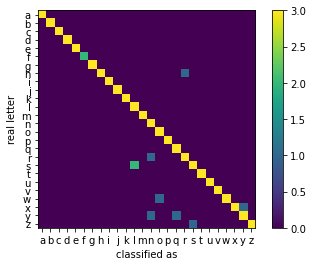

168


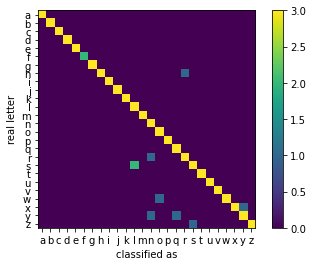

169


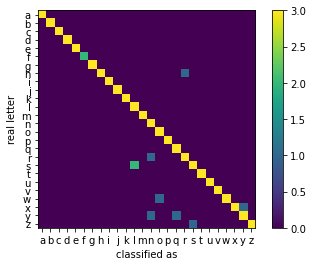

170


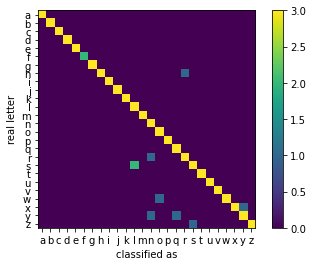

171


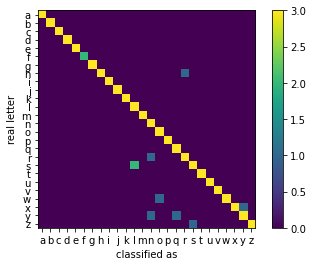

172


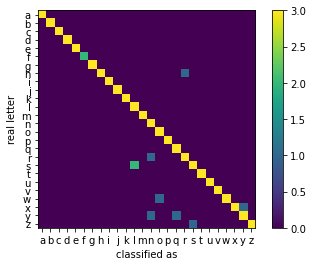

173


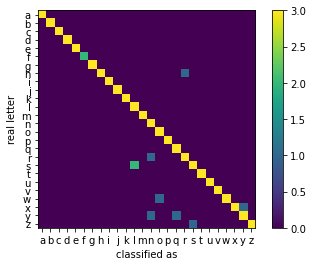

174


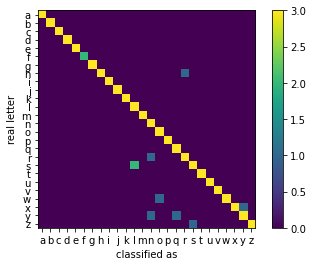

175


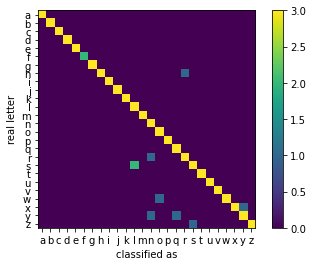

176


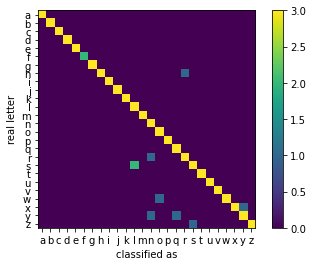

177


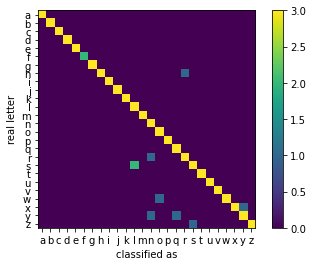

178


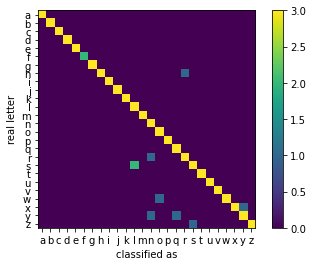

179


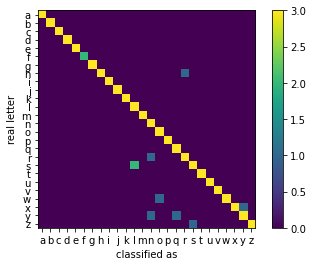

180


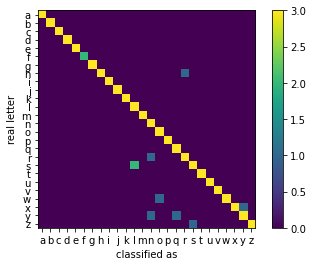

181


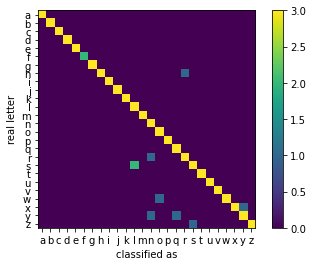

182


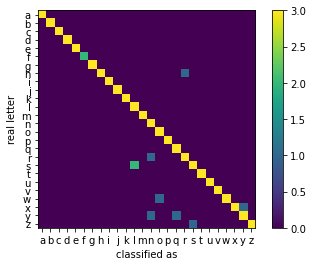

183


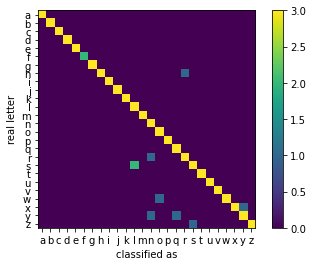

184


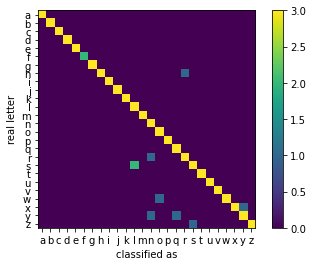

185


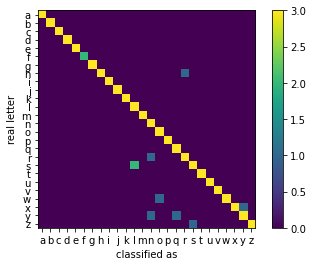

186


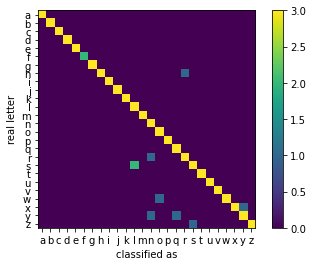

187


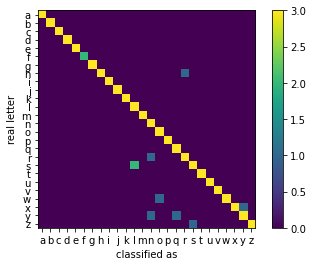

188


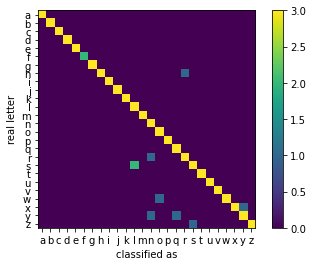

189


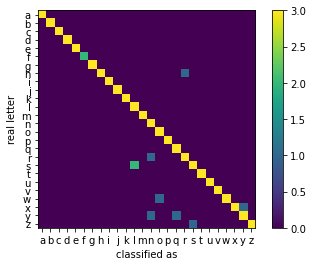

190


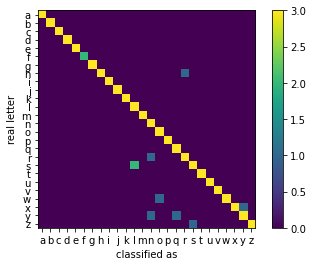

191


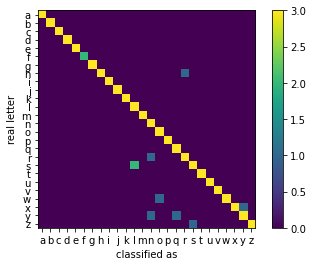

192


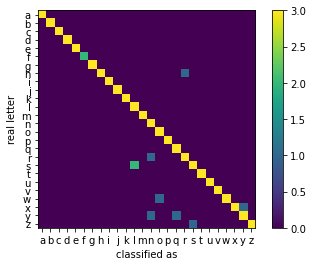

193


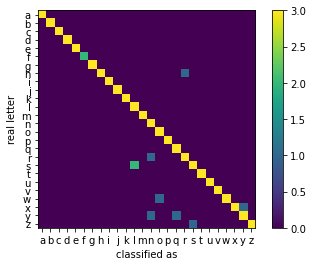

194


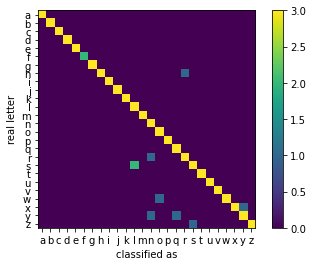

195


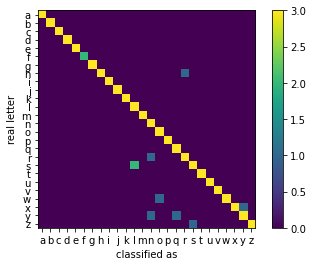

196


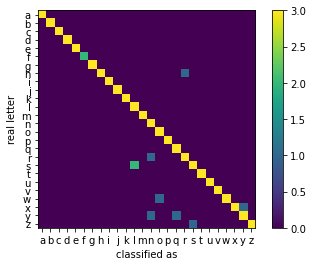

197


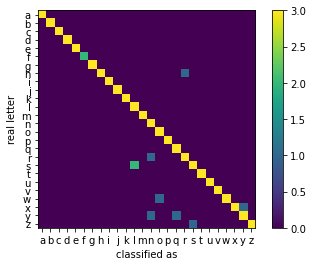

198


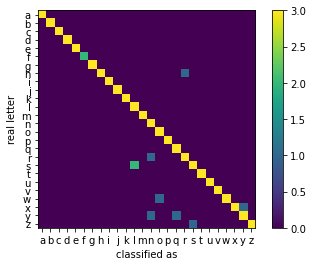

199


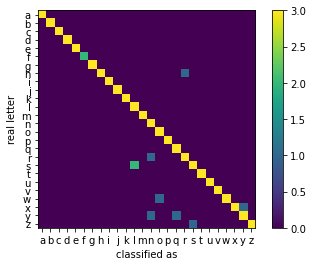

200


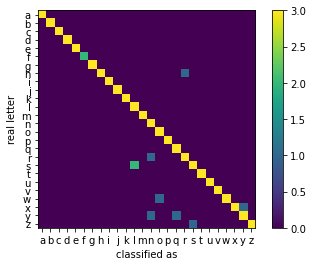

201


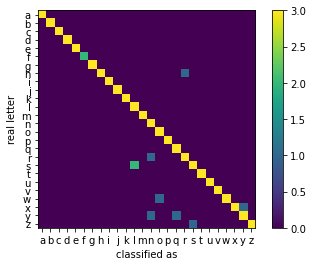

202


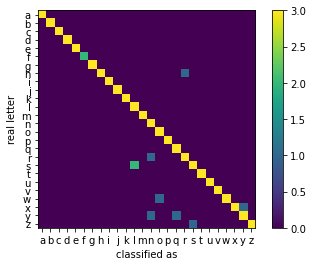

203


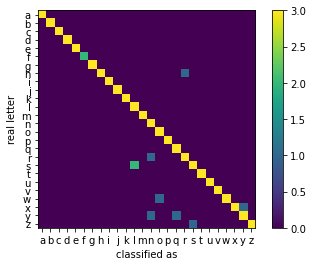

204


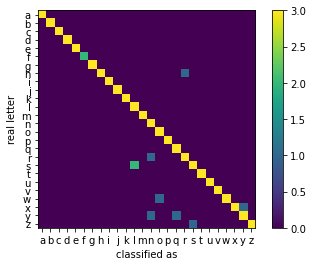

205


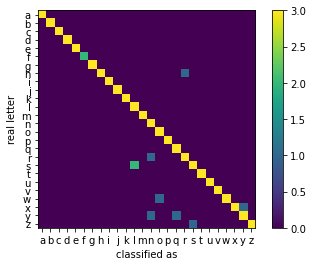

206


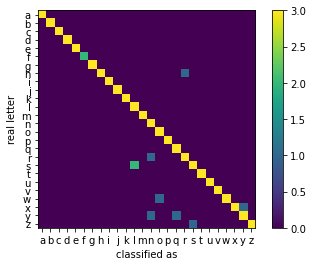

207


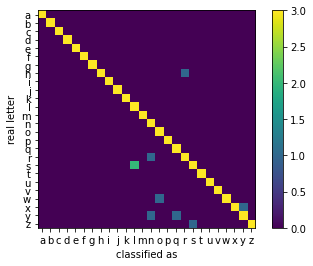

208


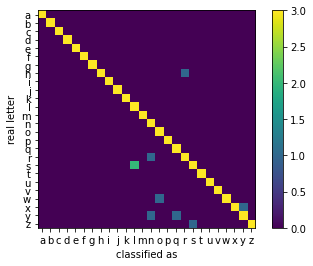

209


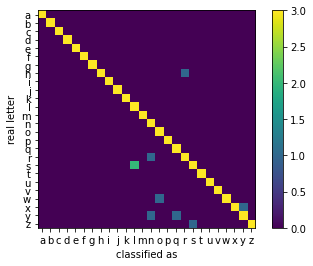

210


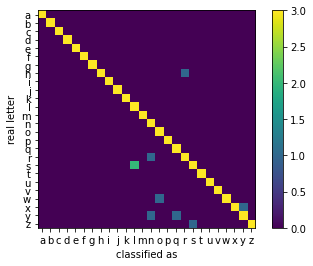

211


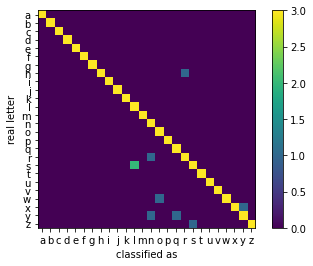

212


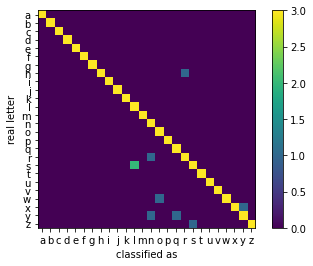

213


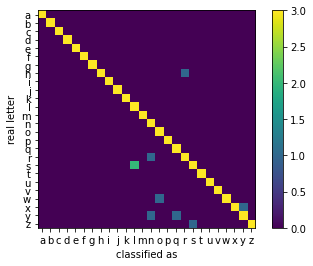

214


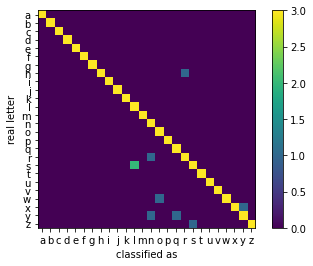

215


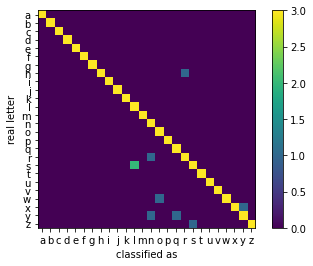

216


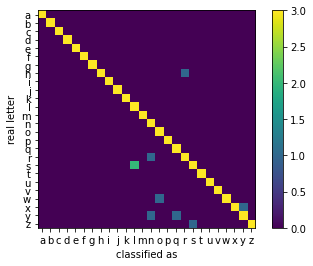

217


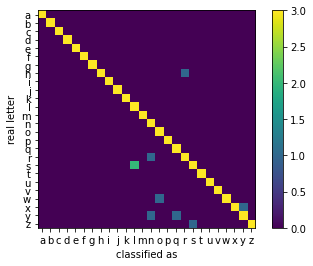

218


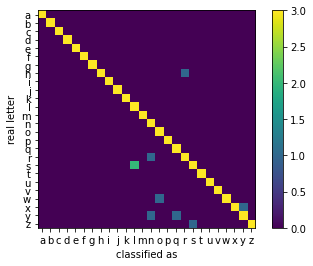

219


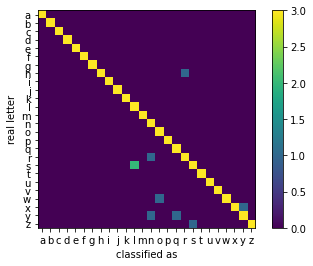

220


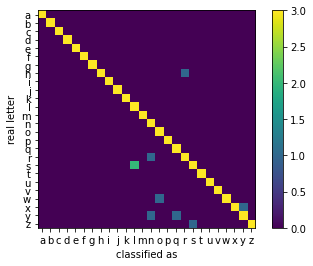

221


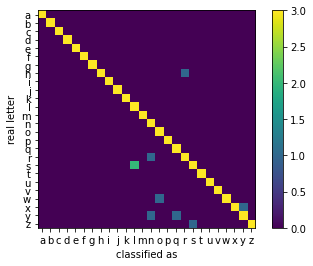

222


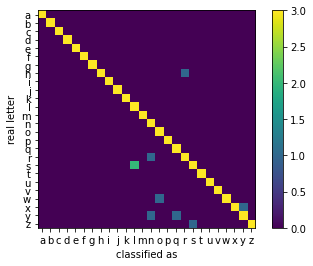

223


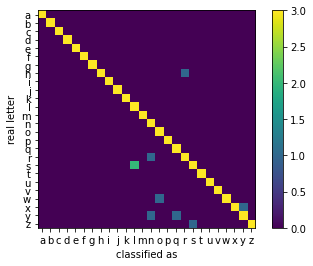

224


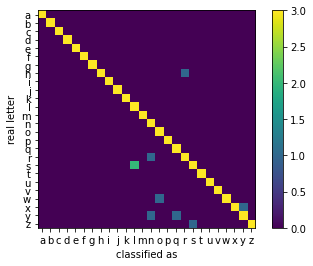

225


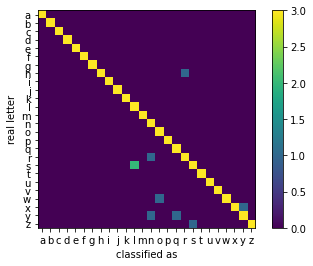

226


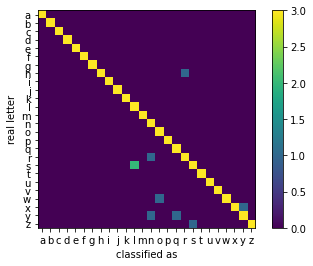

227


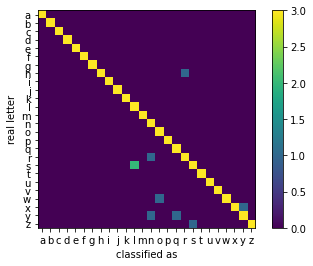

228


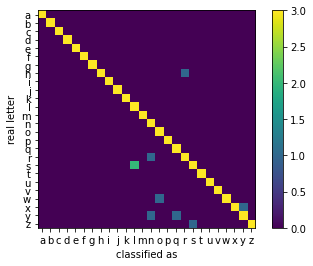

229


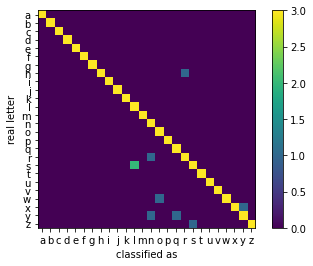

230


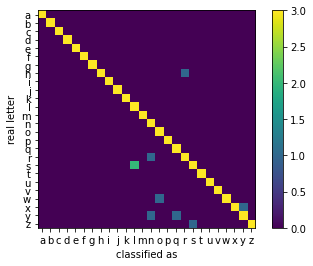

231


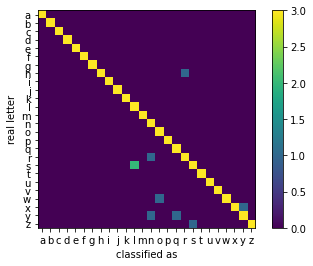

232


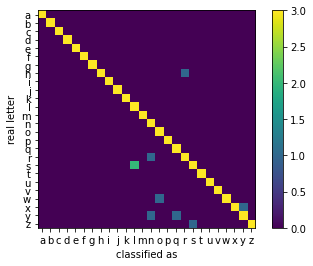

233


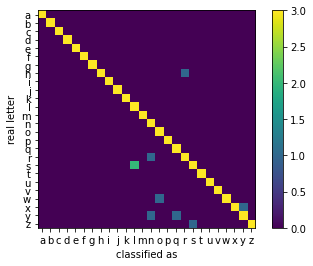

234


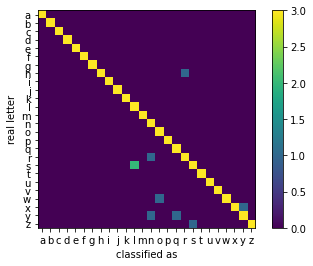

235


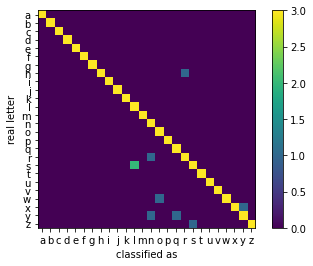

236


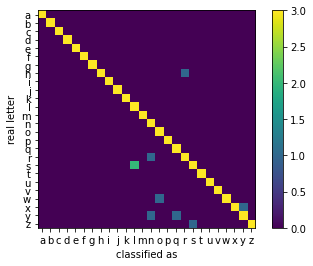

237


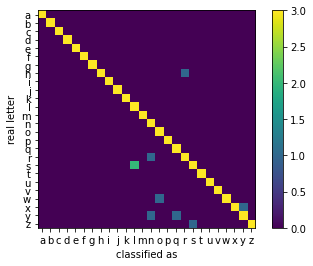

238


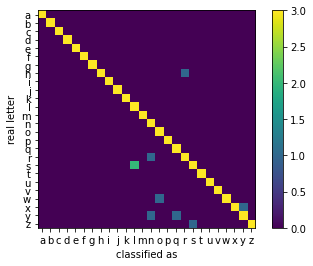

239


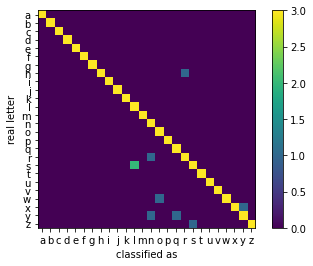

240


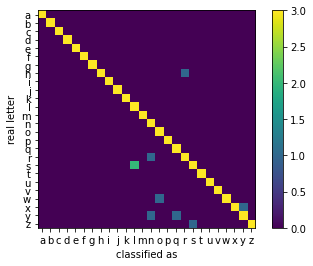

241


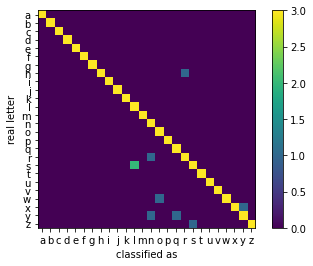

242


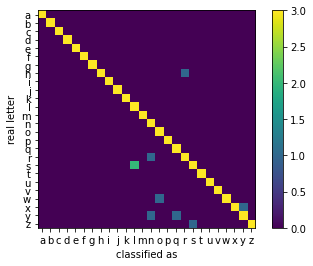

243


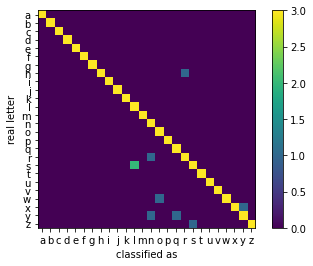

244


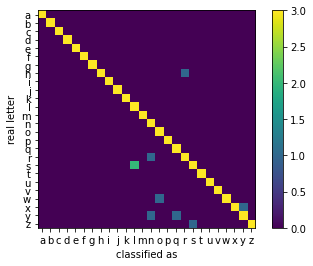

245


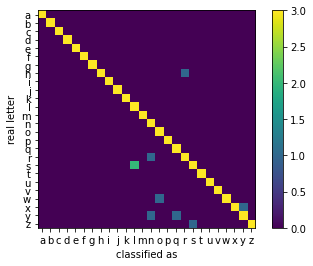

246


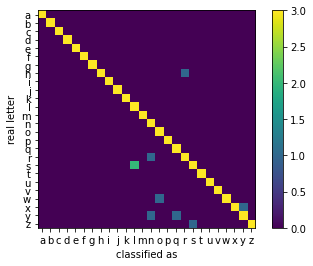

247


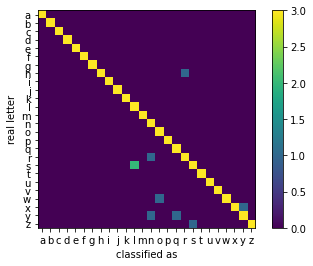

248


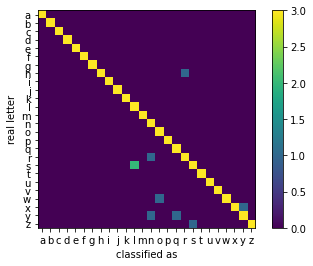

249


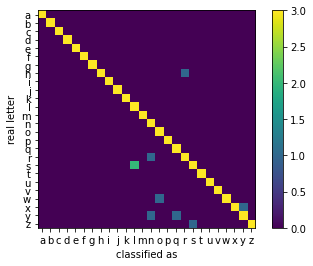

250


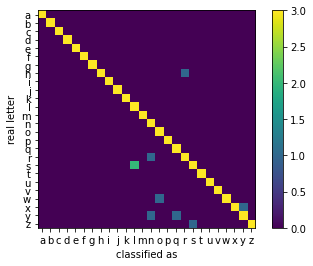

251


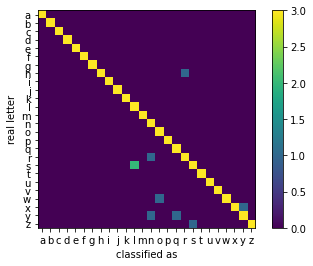

252


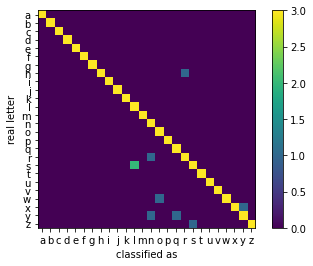

253


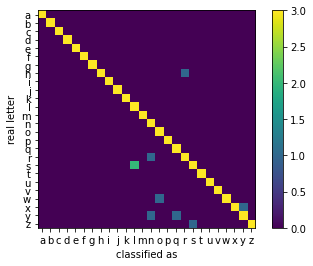

254


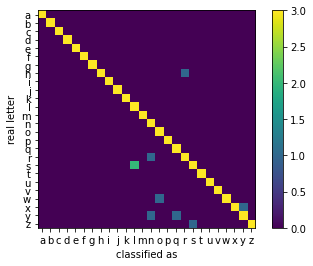

255


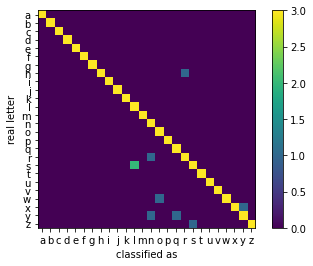

256


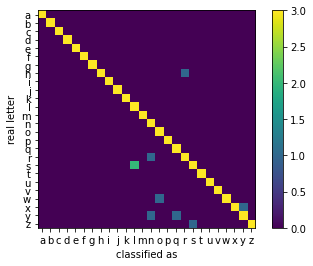

257


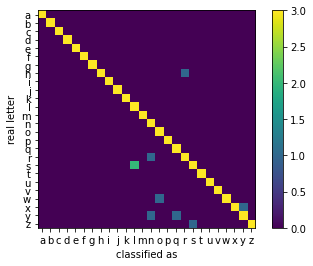

258


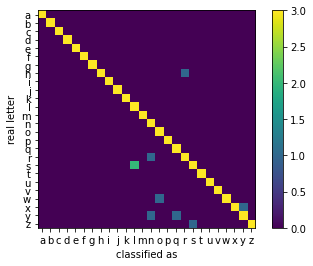

259


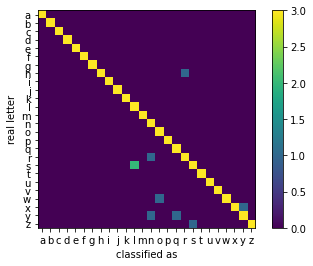

260


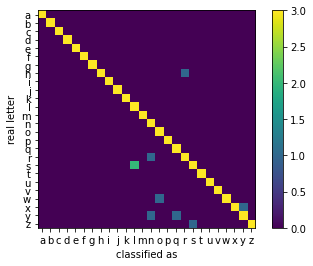

261


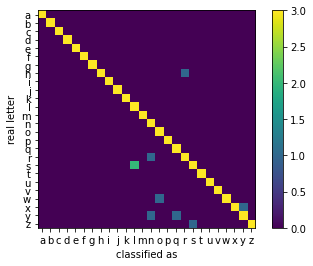

262


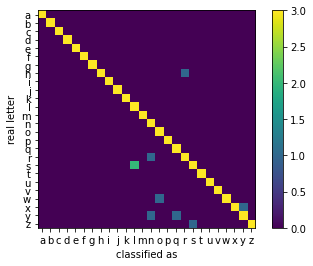

263


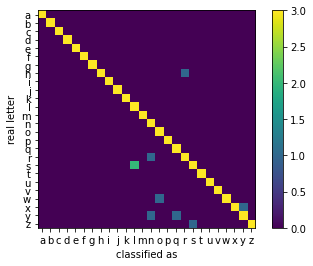

263


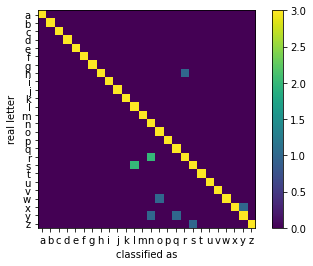

264


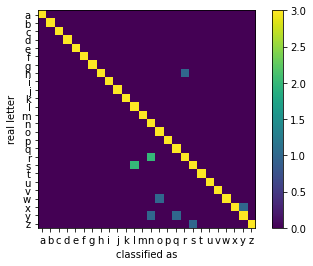

265


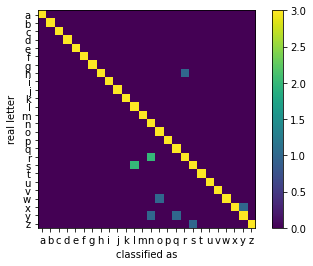

266


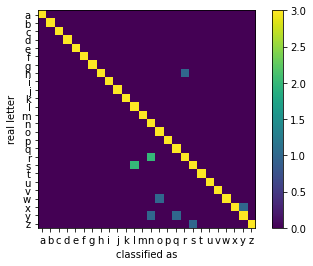

267


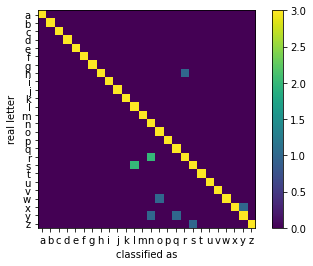

267


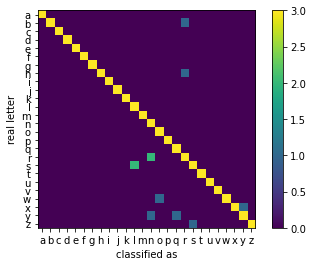

268


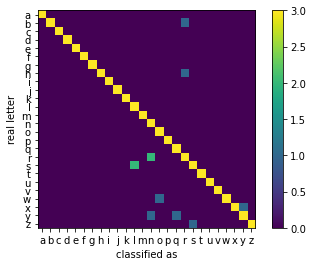

269


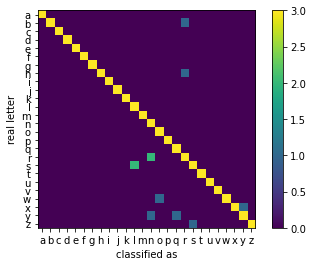

270


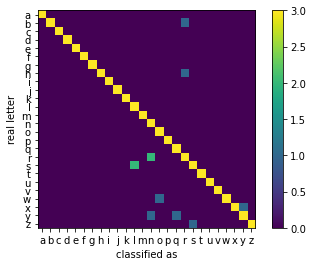

271


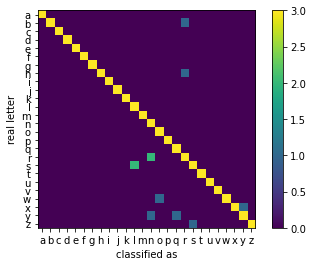

272


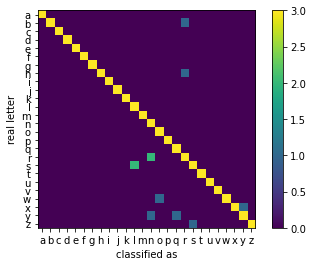

273


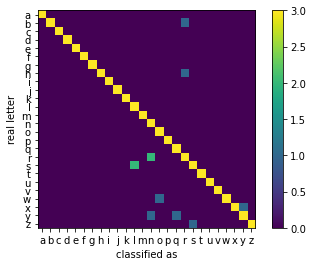

274


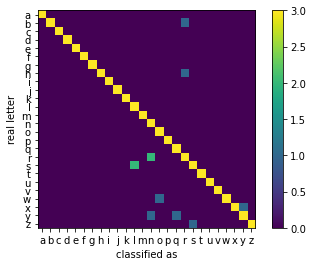

275


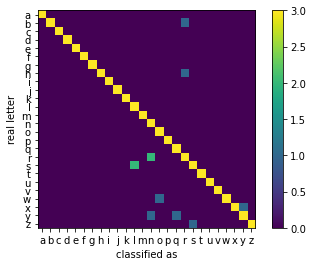

276


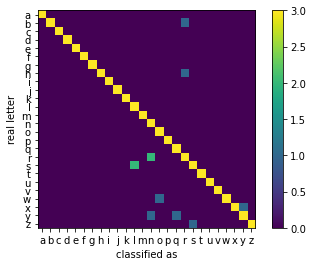

277


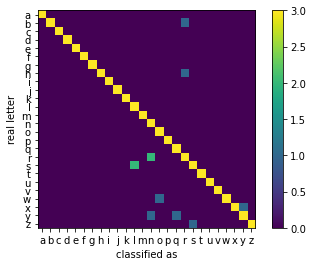

278


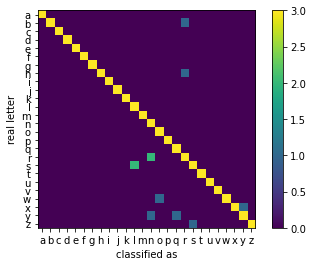

279


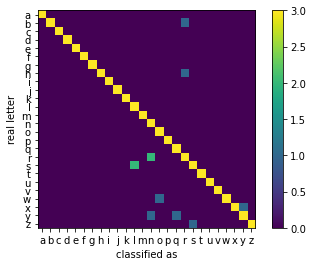

280


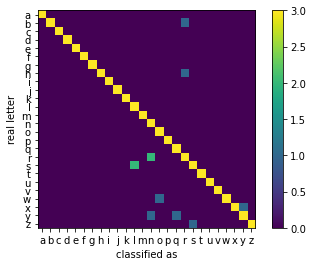

281


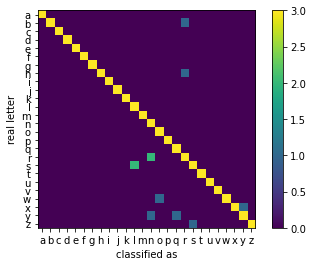

282


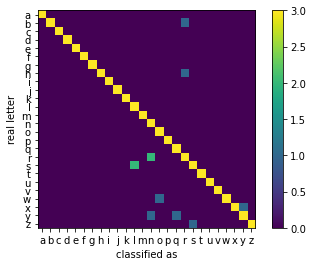

283


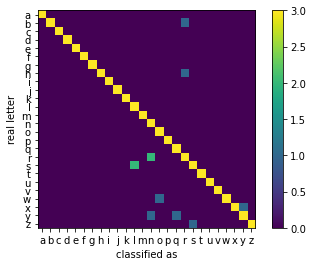

284


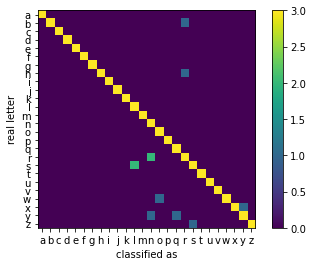

285


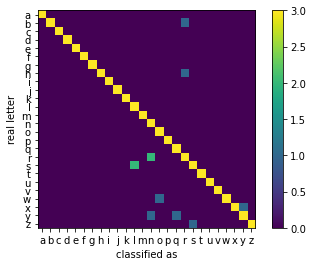

286


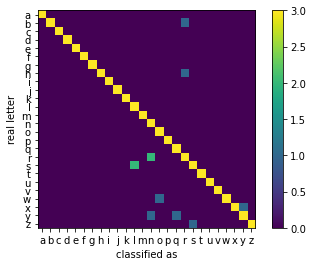

287


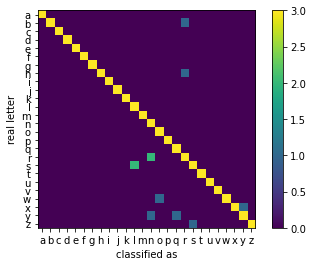

288


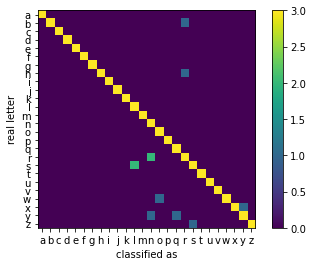

289


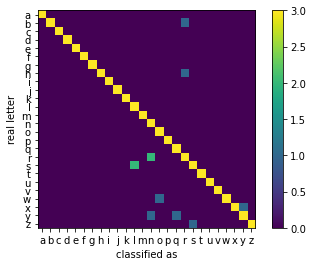

290


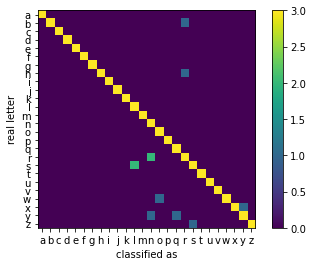

291


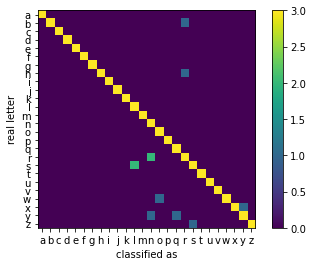

292


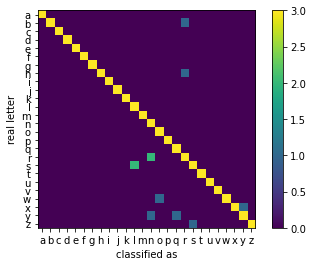

293


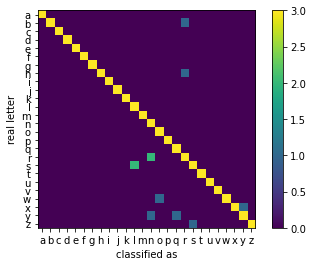

294


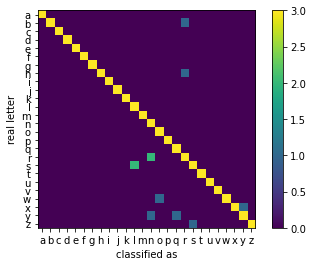

295


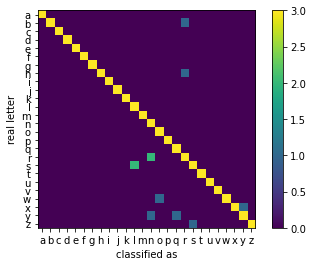

296


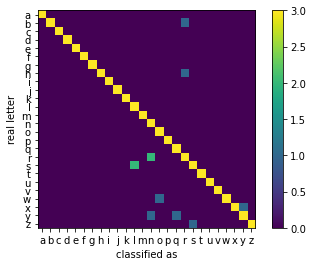

297


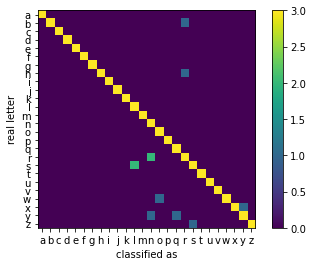

298


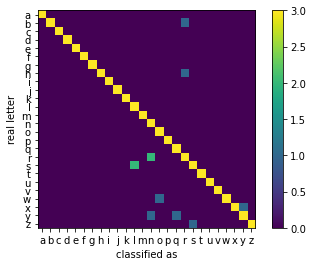

299


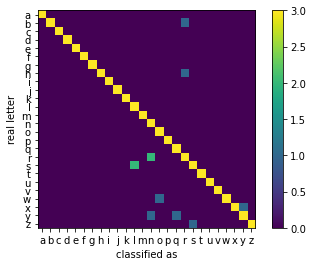

300


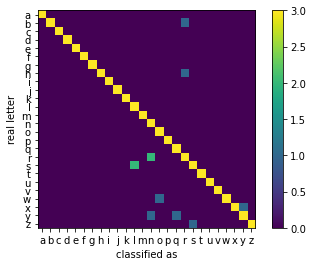

301


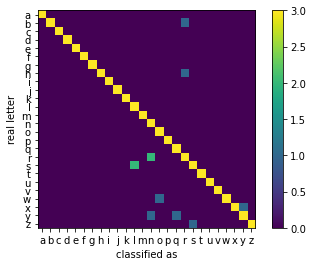

302


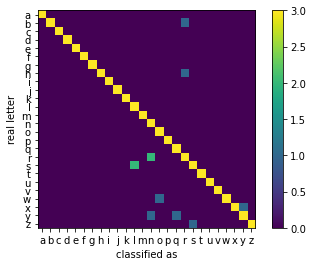

303


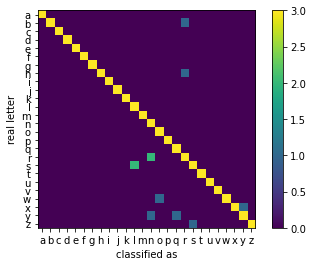

304


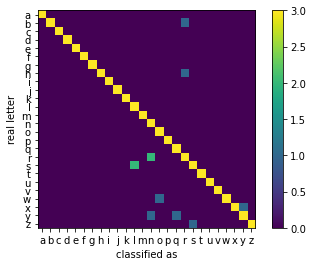

305


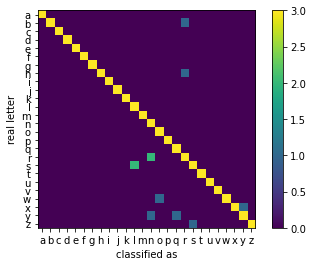

306


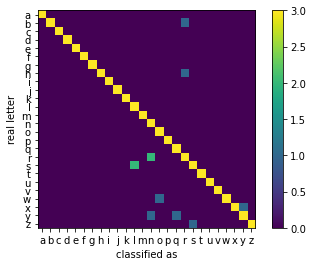

307


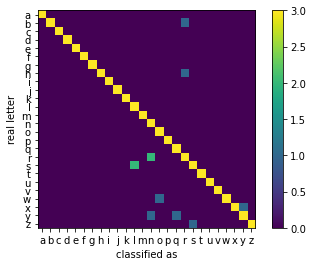

308


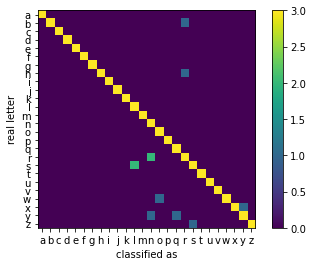

308


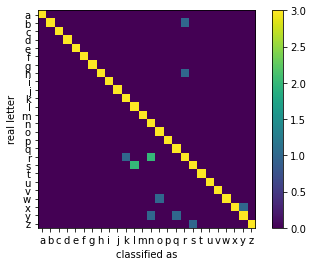

309


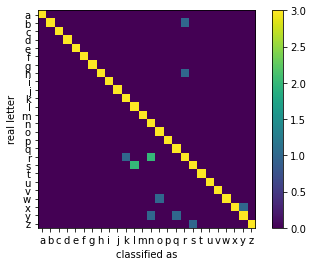

310


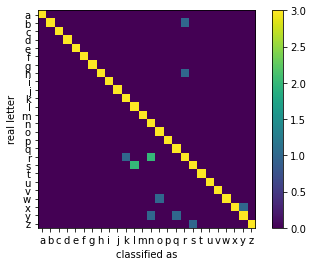

310


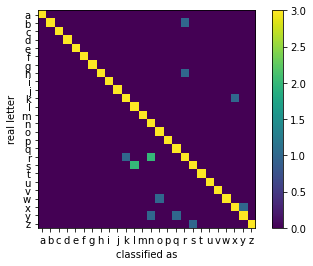

311


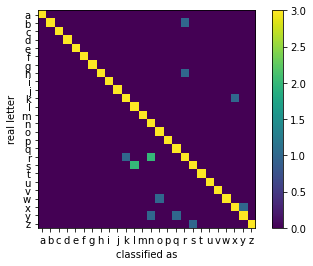

312


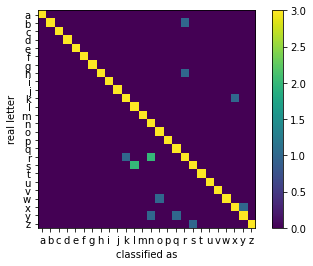

313


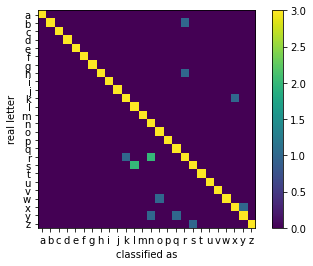

314


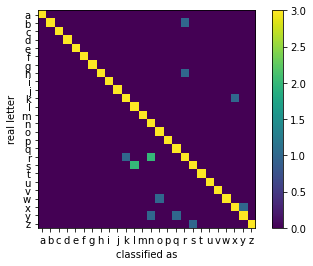

315


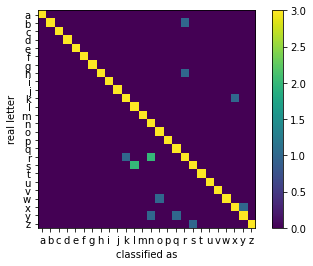

316


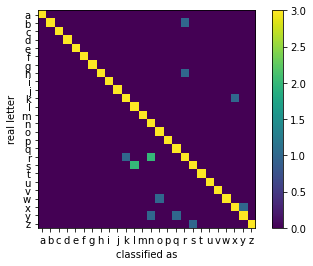

317


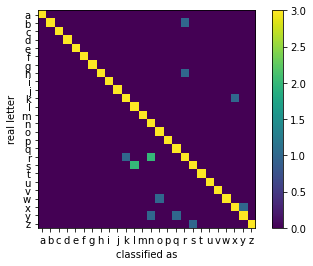

318


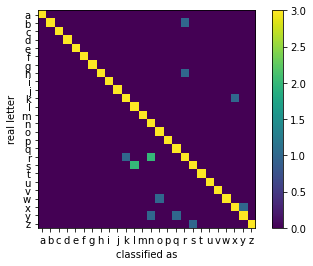

319


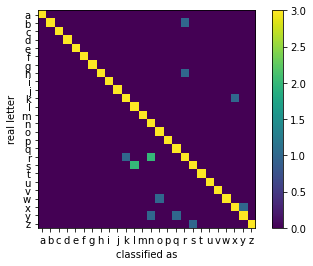

320


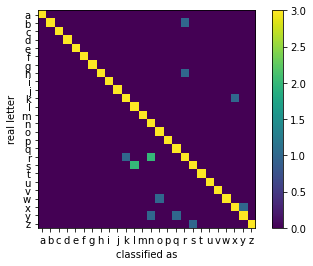

321


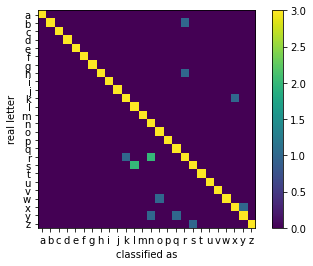

321


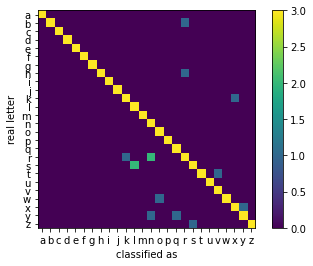

322


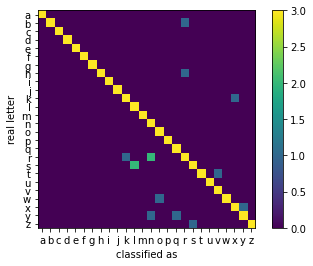

323


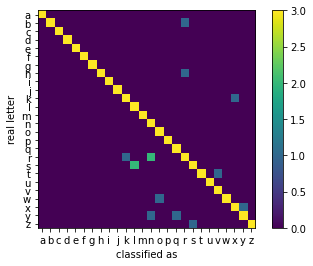

324


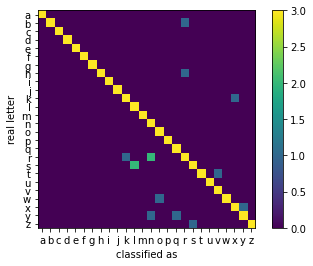

325


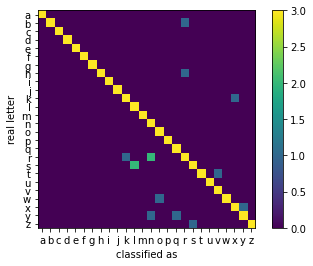

326


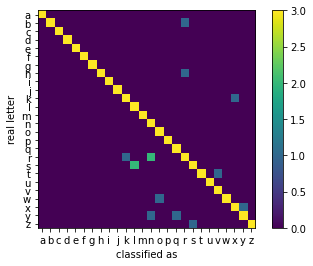

327


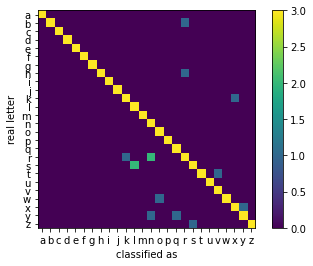

328


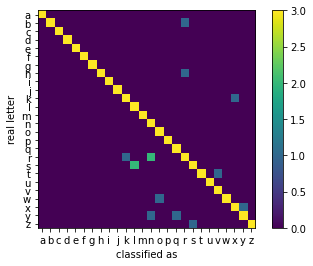

329


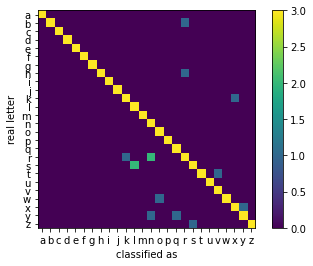

330


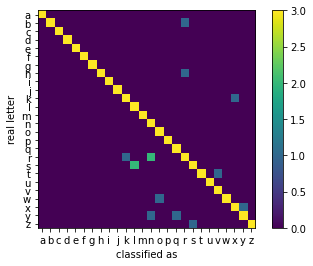

331


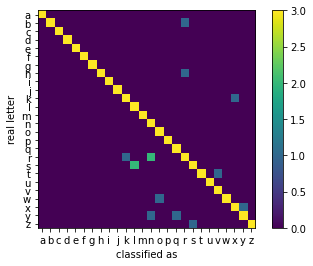

332


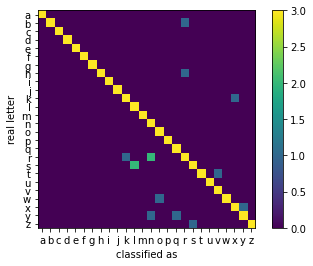

333


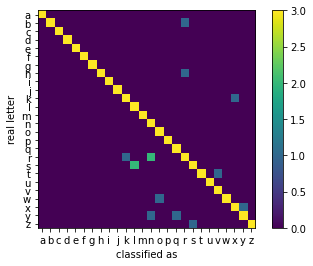

334


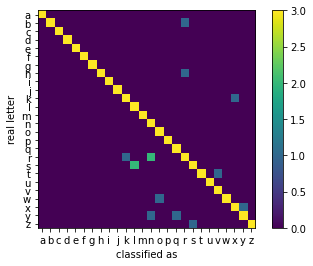

335


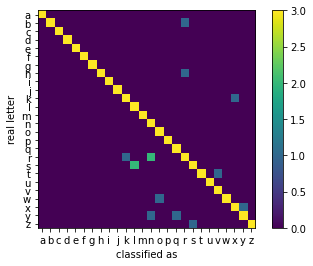

336


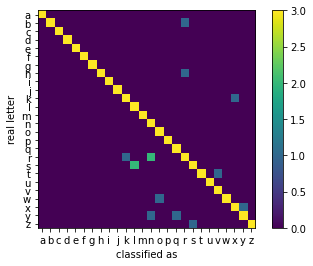

337


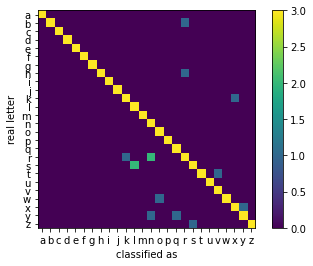

338


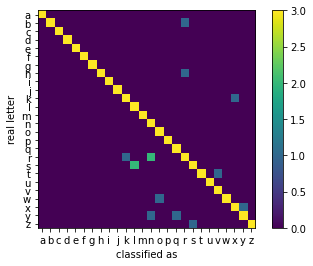

339


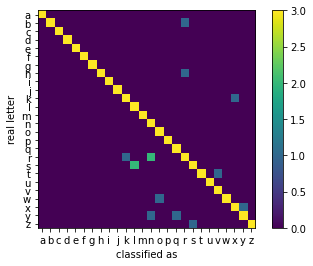

340


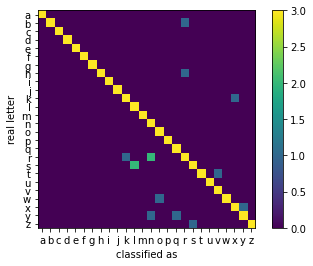

341


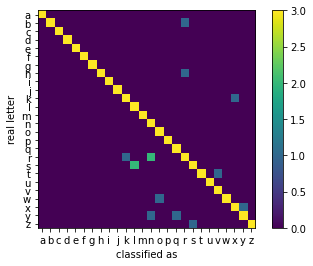

342


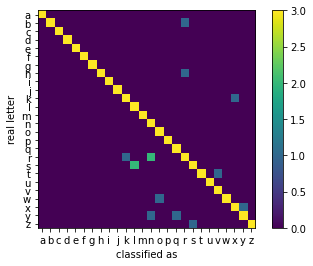

343


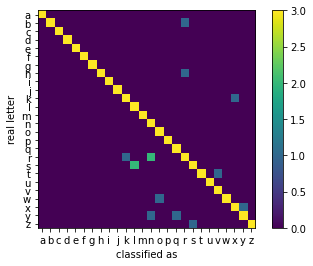

344


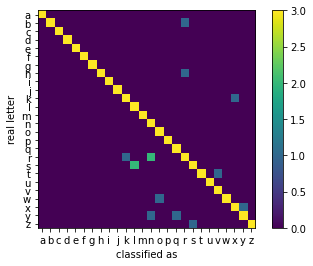

345


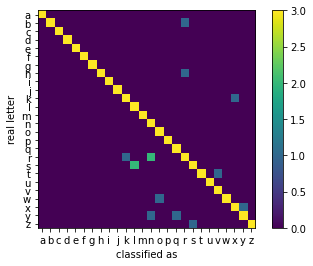

346


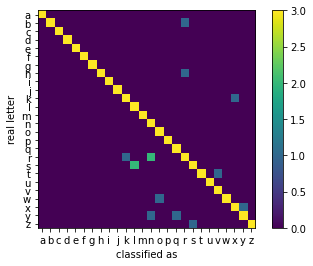

347


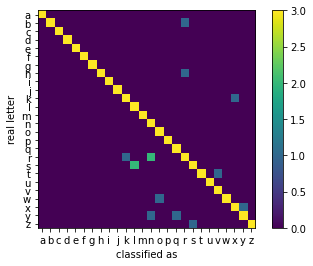

348


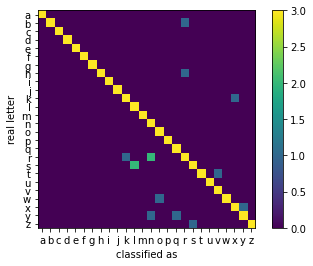

349


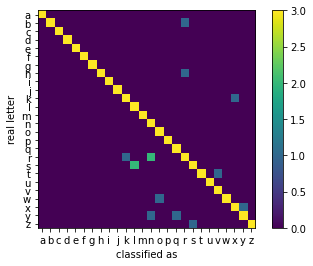

350


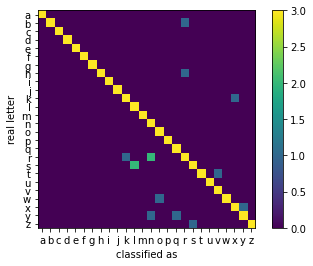

351


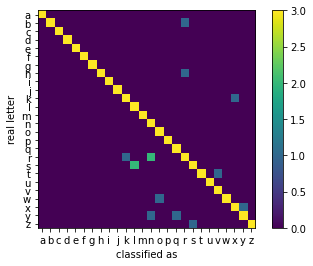

352


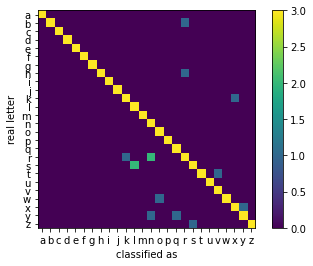

353


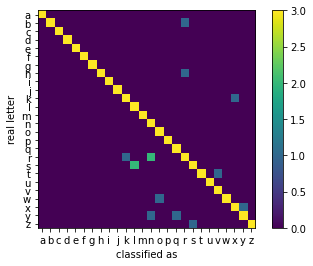

354


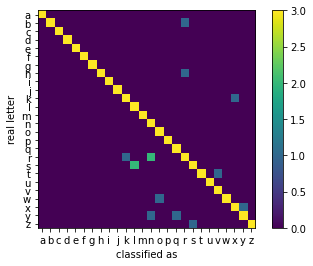

355


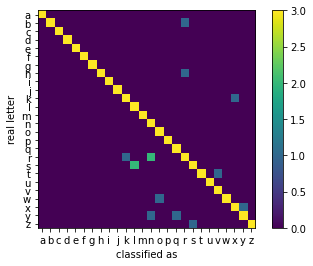

356


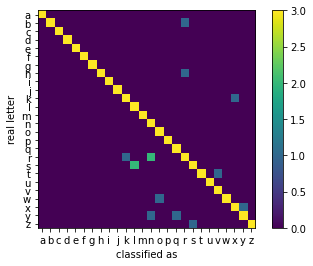

357


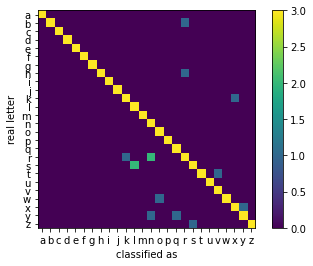

358


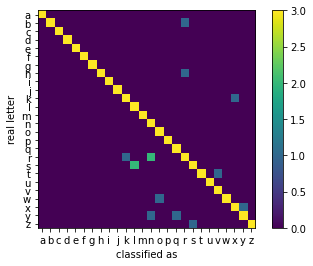

359


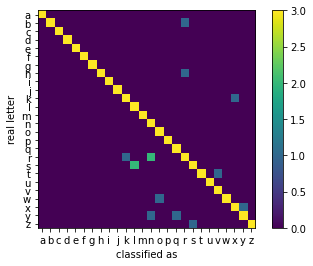

359


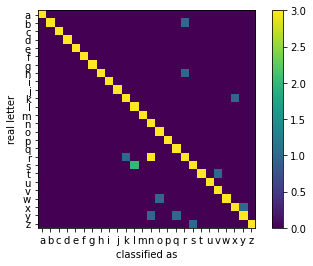

360


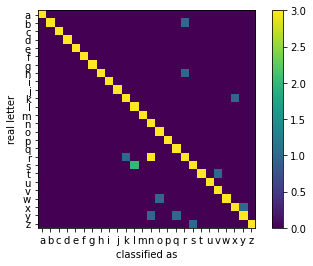

361


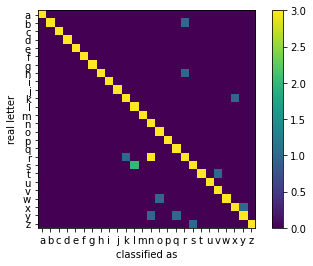

362


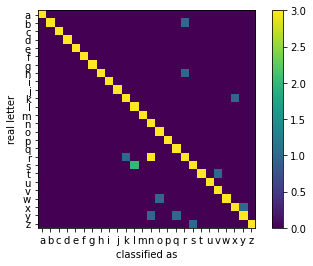

363


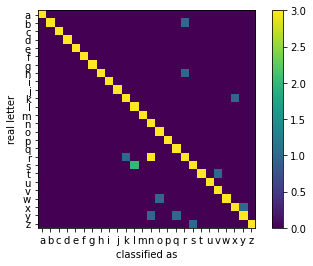

364


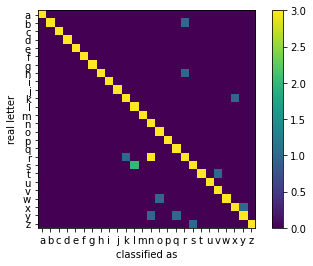

365


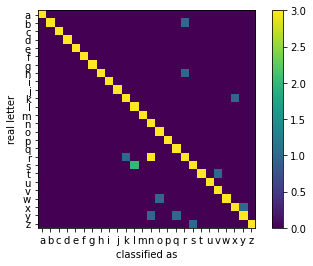

366


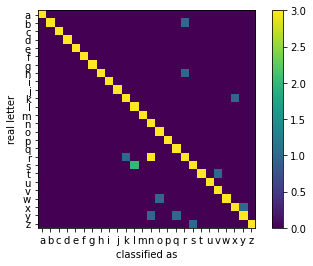

367


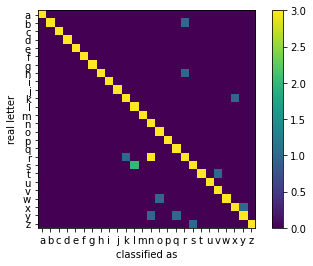

367


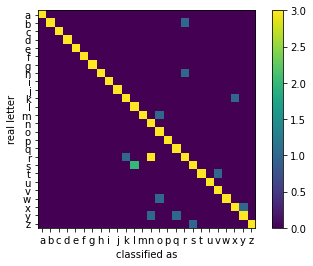

368


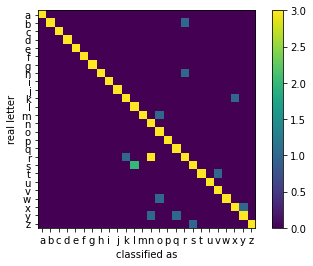

369


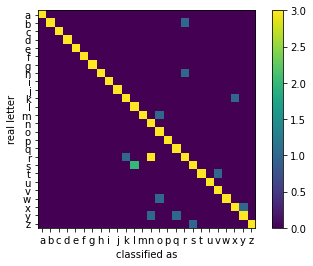

370


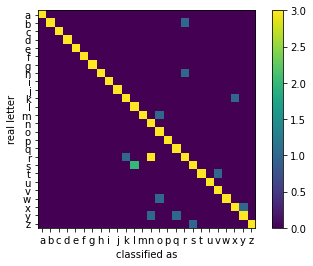

371


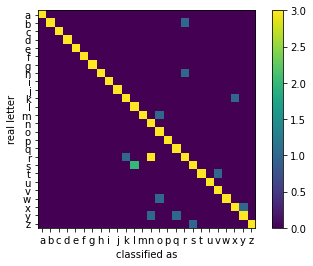

372


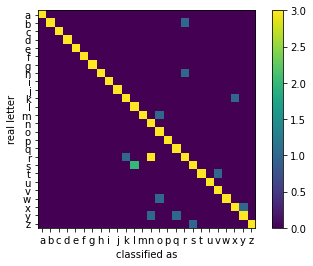

373


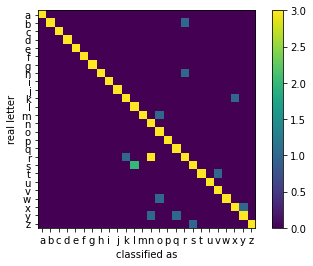

374


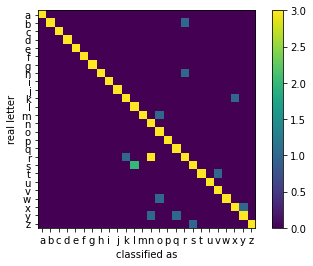

374


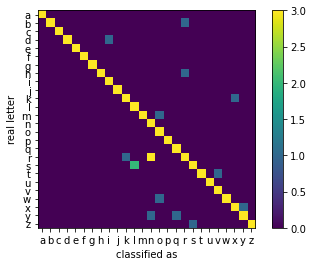

375


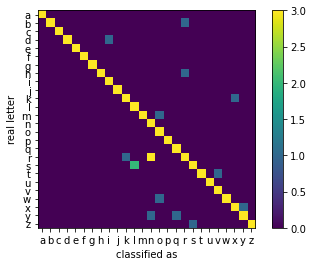

376


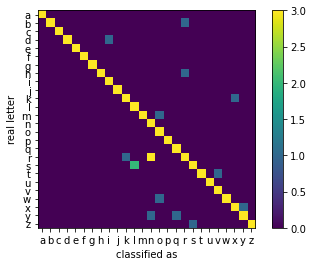

377


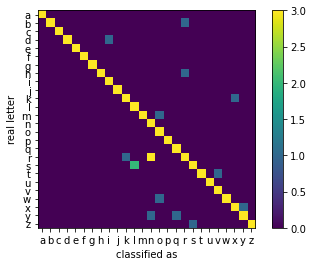

378


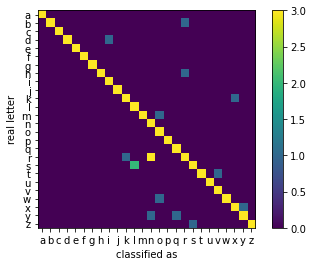

379


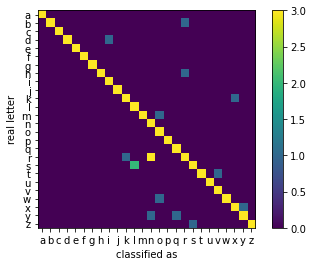

380


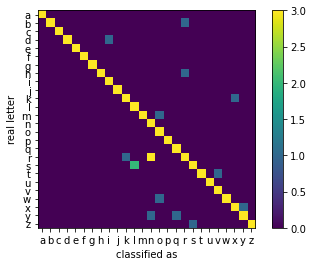

381


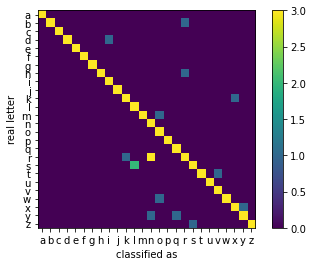

382


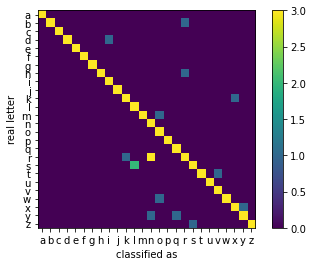

383


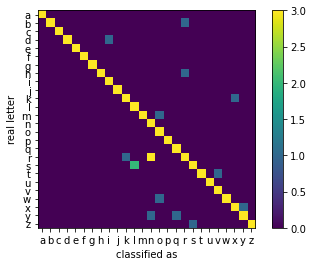

384


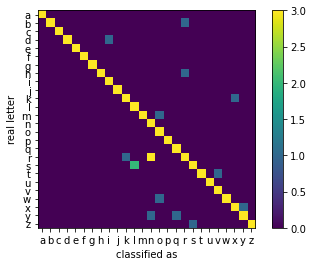

385


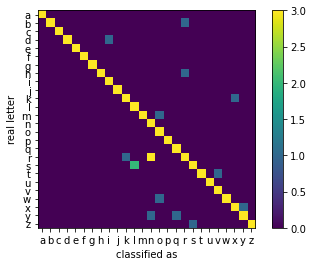

386


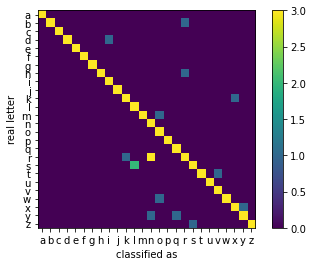

387


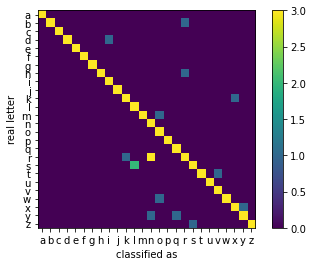

388


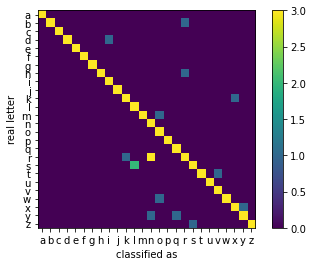

389


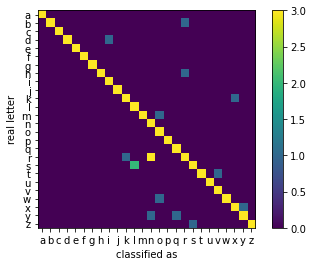

390


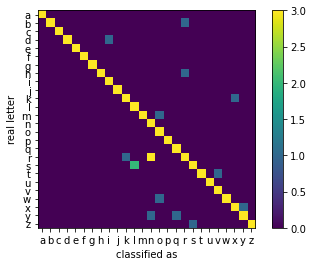

391


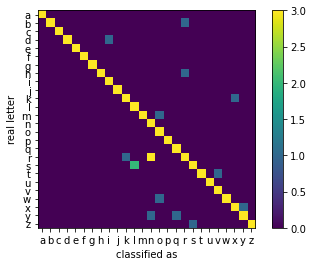

392


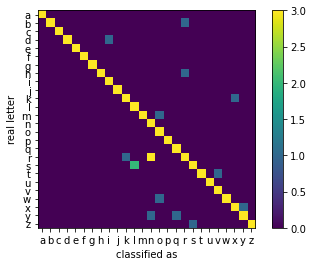

393


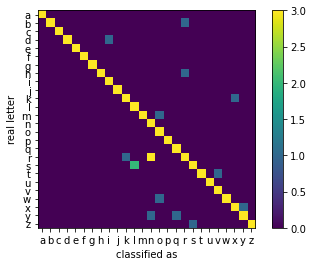

394


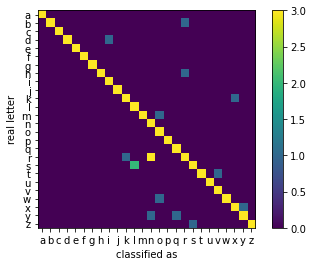

395


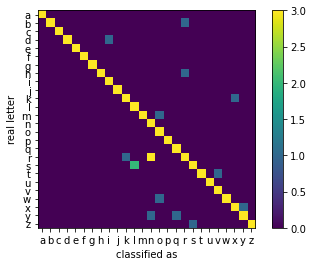

396


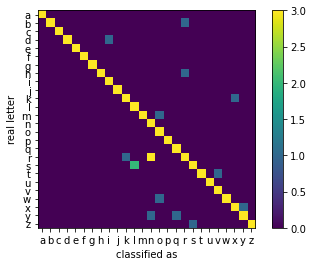

397


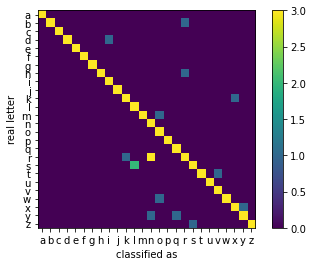

398


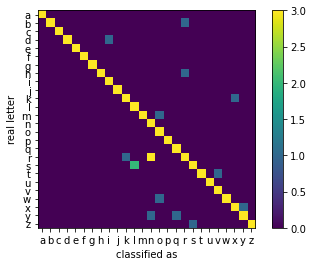

399


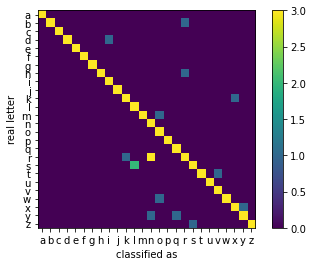

400


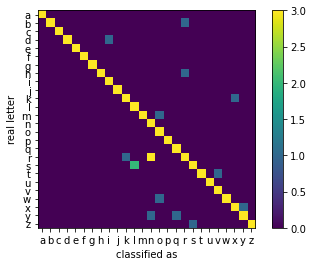

400


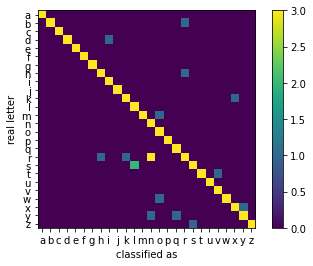

401


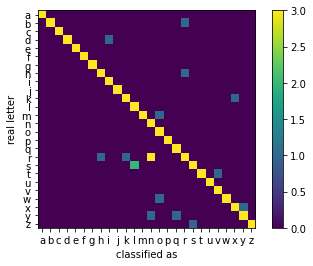

402


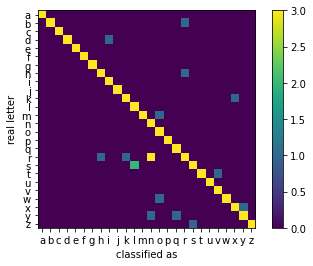

403


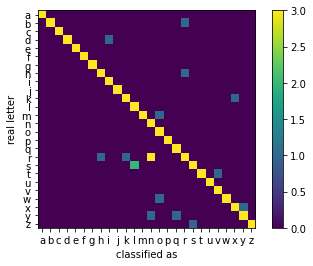

404


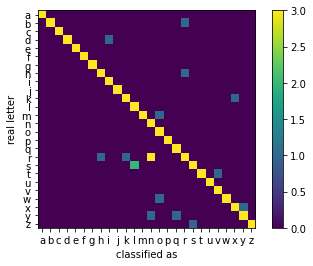

405


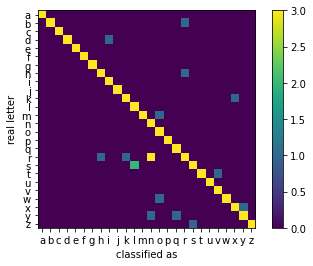

406


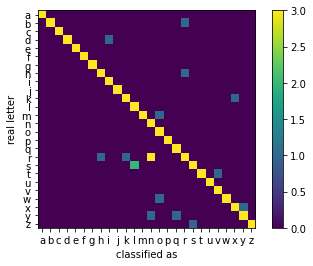

407


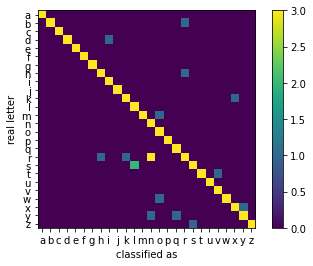

408


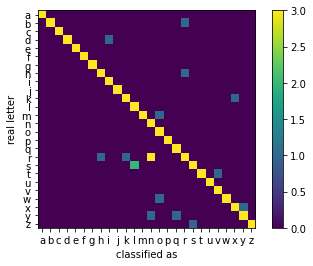

409


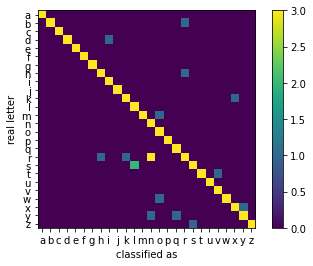

410


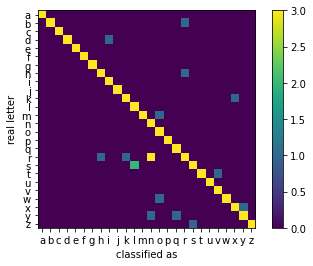

411


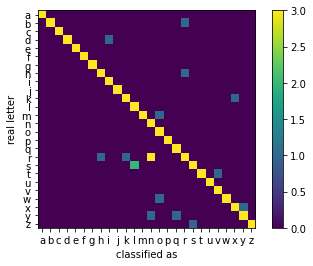

412


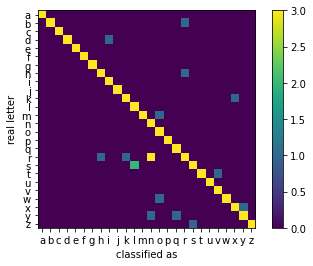

413


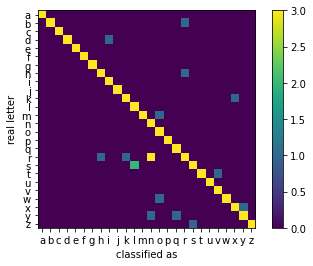

414


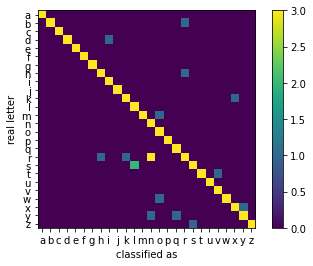

415


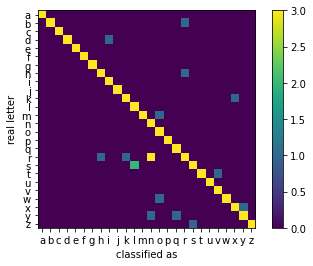

416


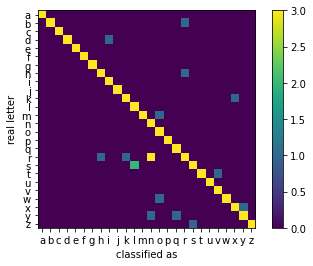

417


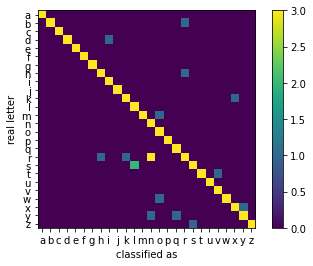

418


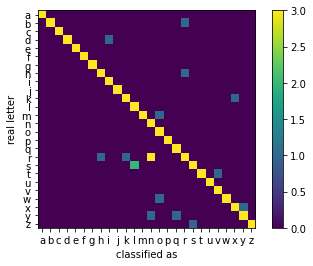

419


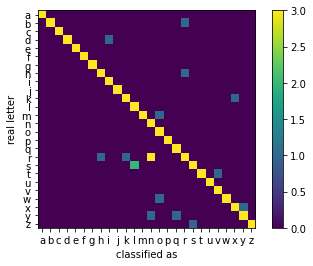

420


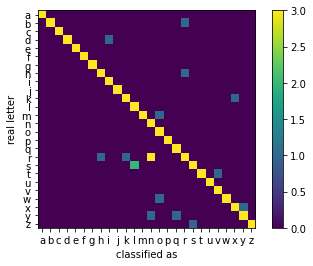

421


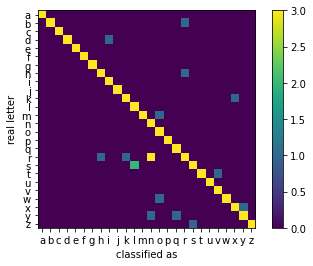

422


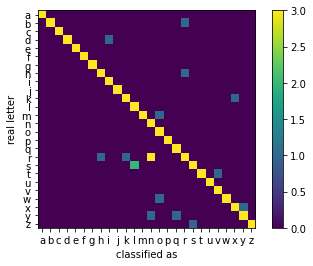

423


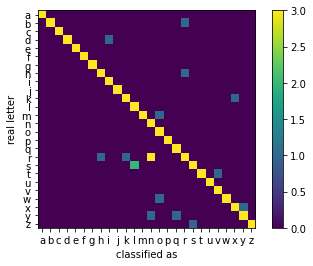

424


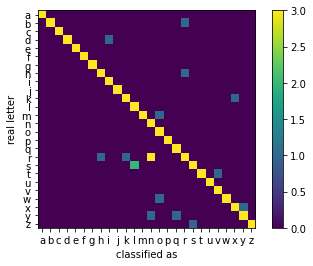

425


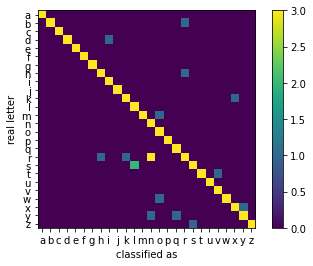

426


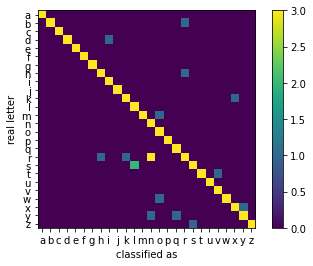

427


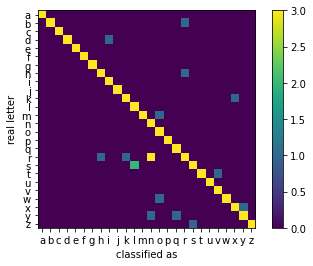

428


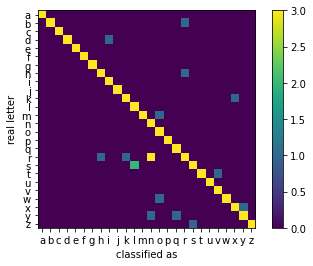

429


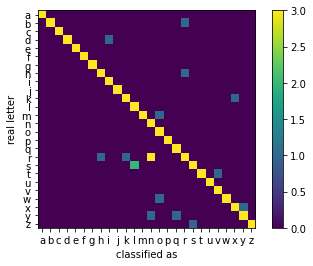

430


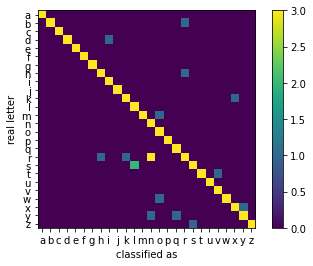

431


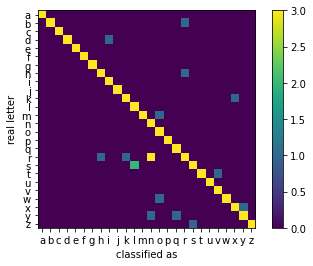

432


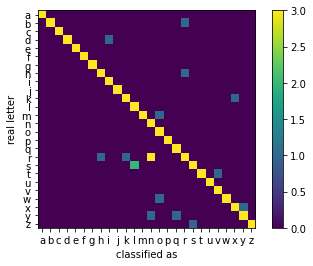

433


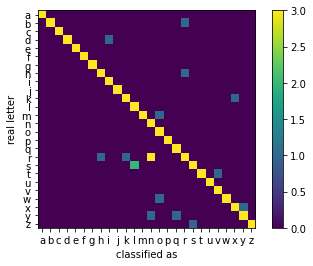

434


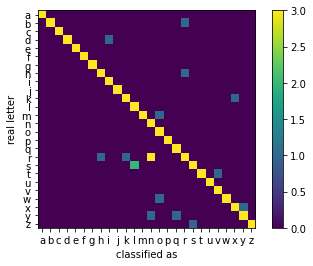

435


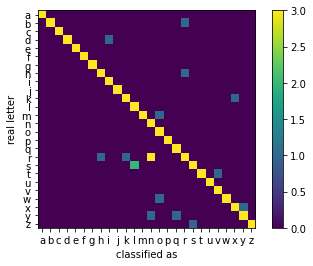

436


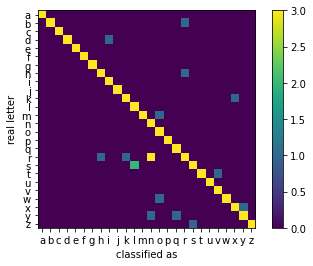

437


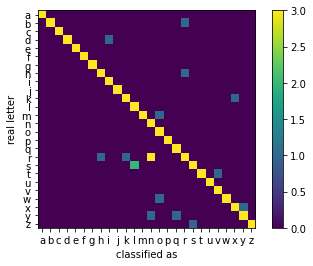

437


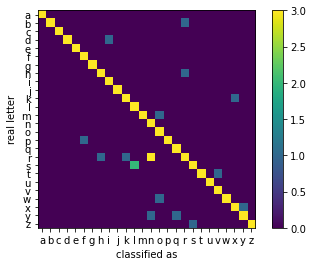

438


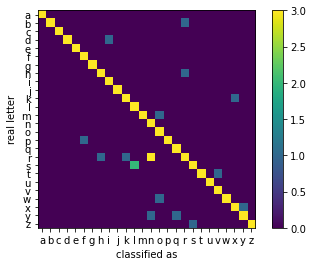

439


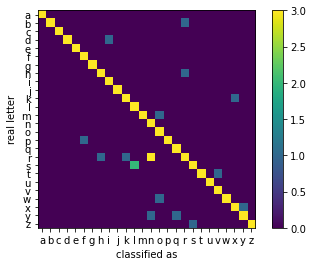

440


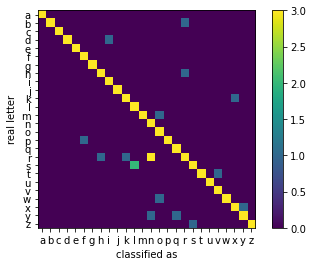

440


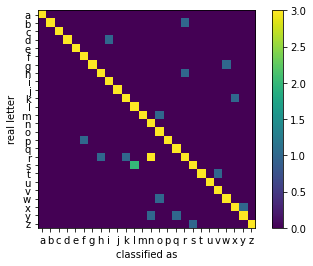

441


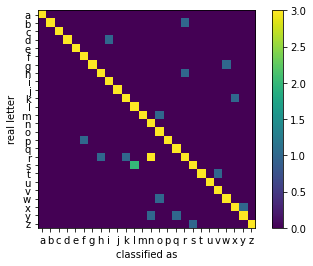

442


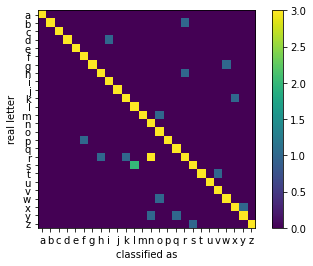

443


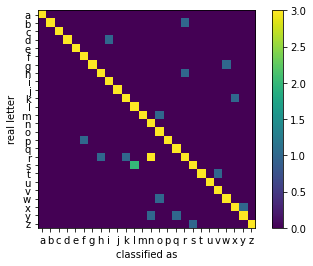

444


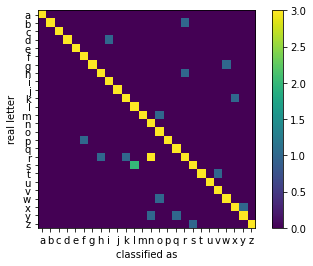

445


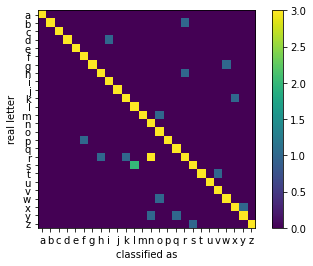

446


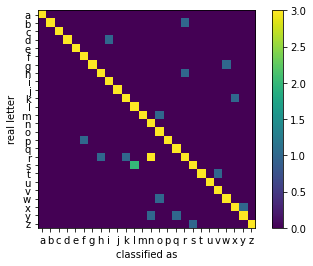

447


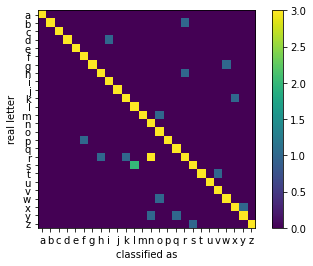

448


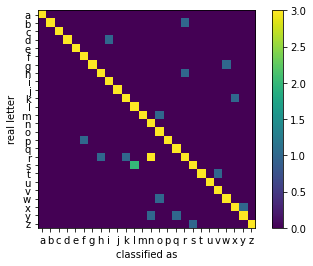

449


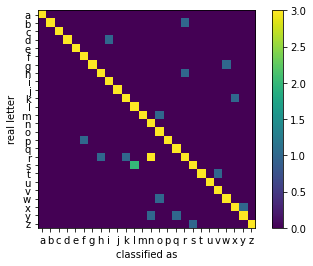

450


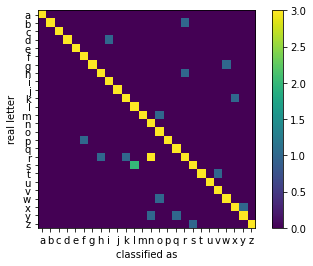

451


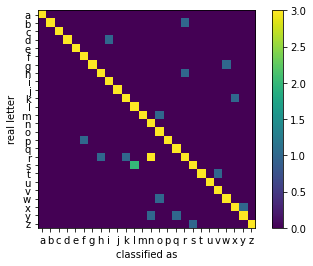

452


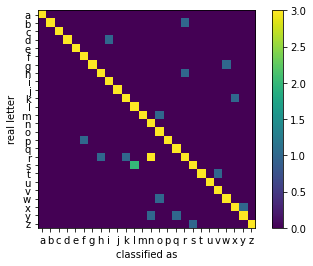

453


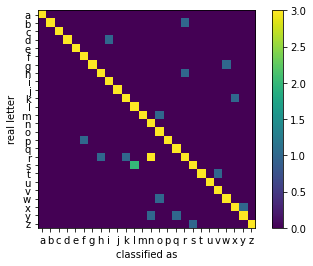

454


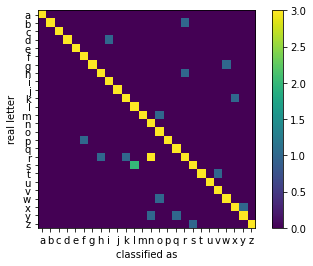

455


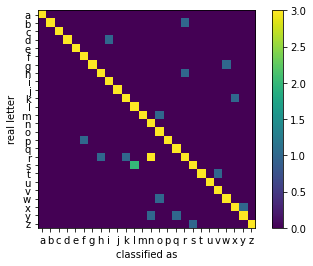

456


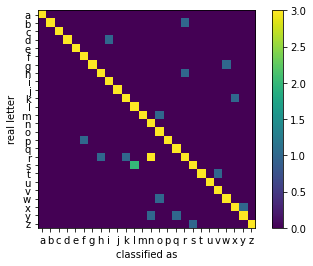

457


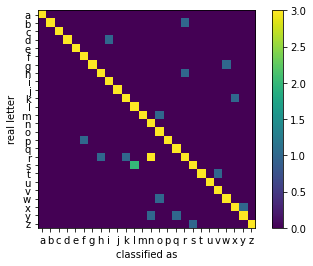

458


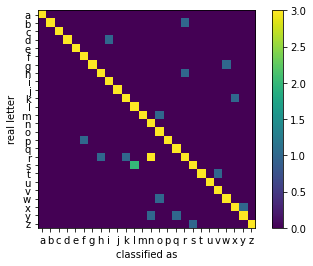

459


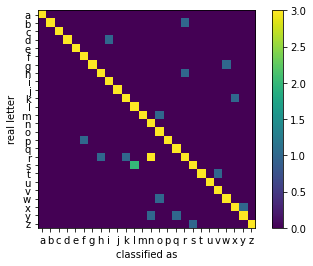

460


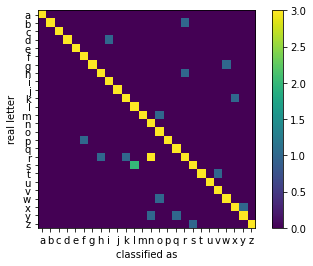

461


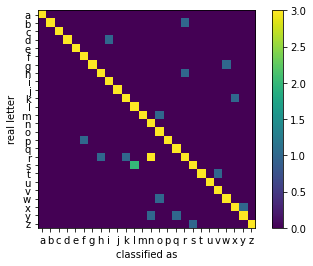

462


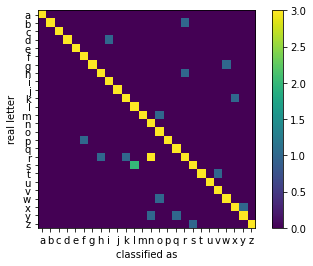

463


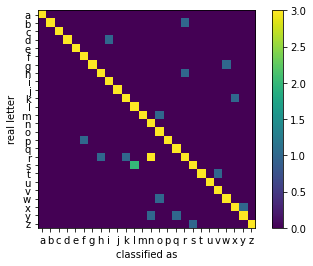

464


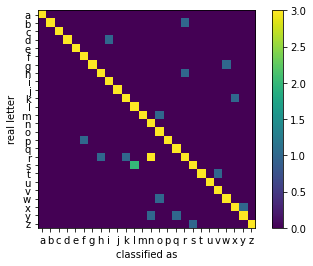

465


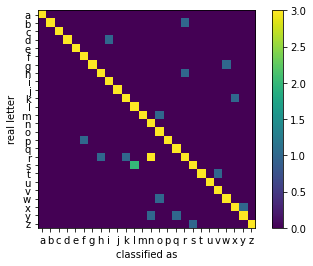

466


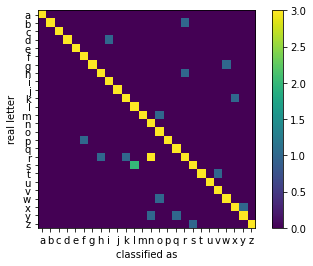

467


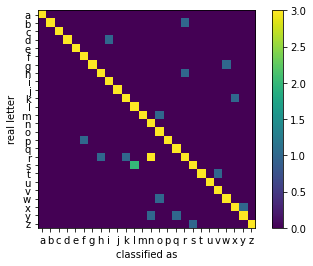

468


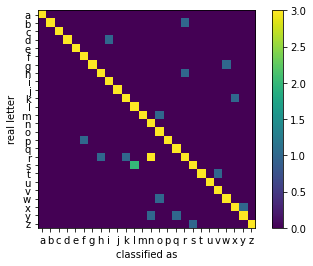

469


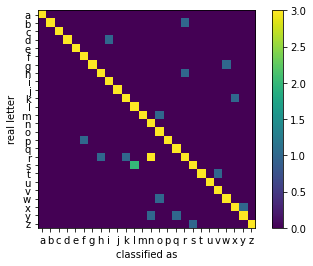

470


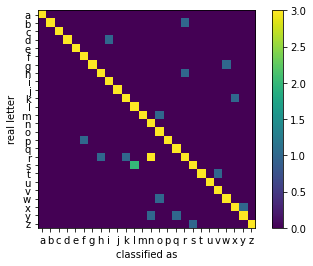

471


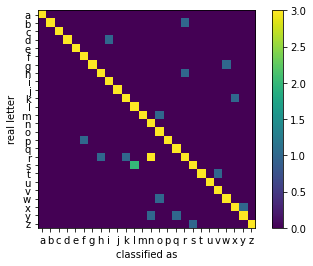

472


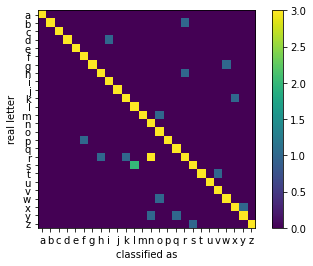

473


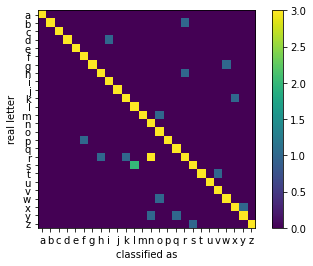

474


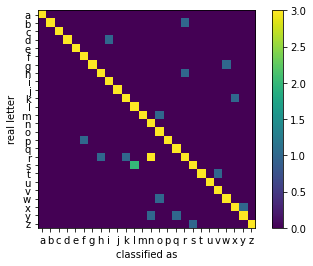

475


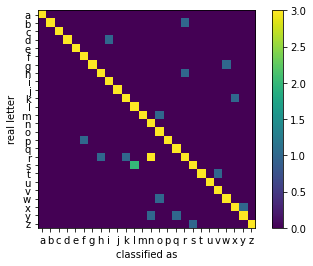

476


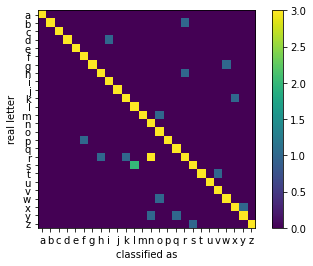

477


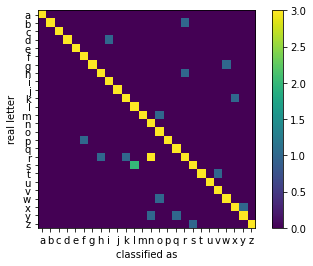

478


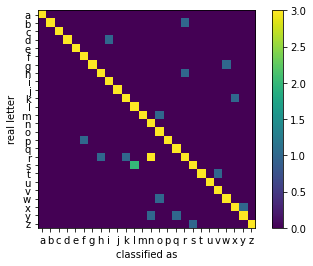

479


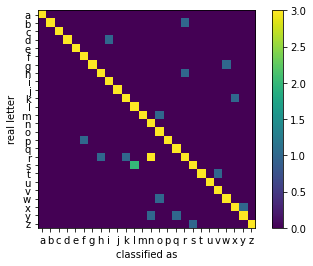

480


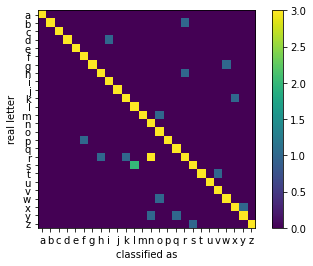

481


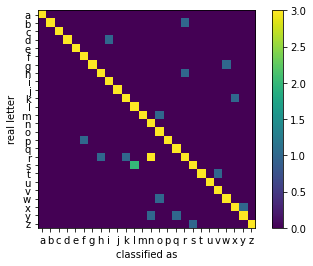

482


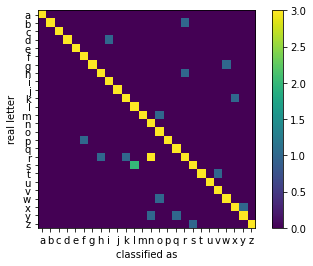

483


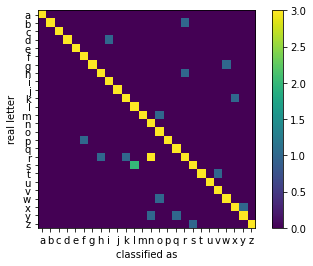

484


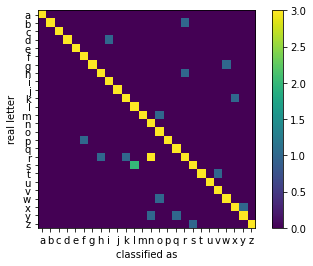

485


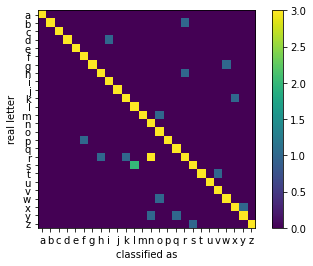

486


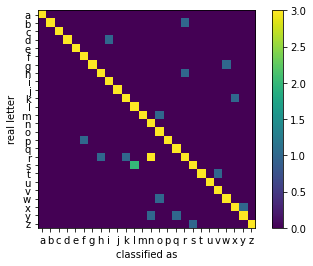

487


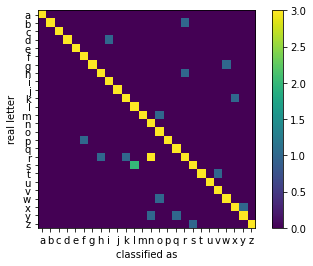

488


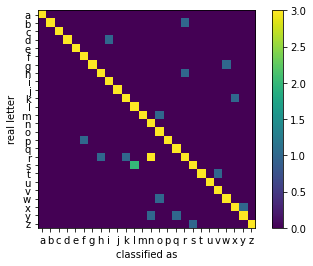

489


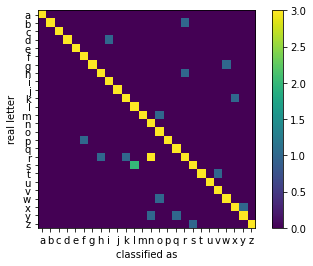

490


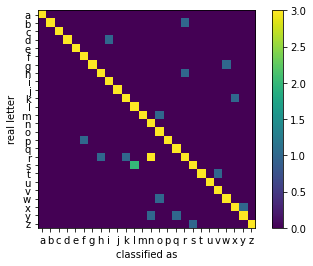

491


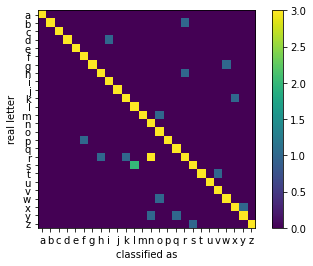

492


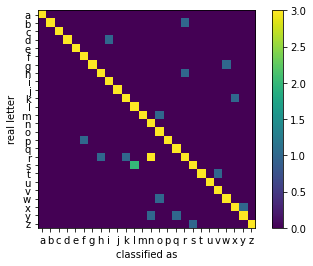

493


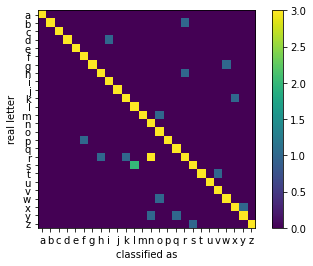

494


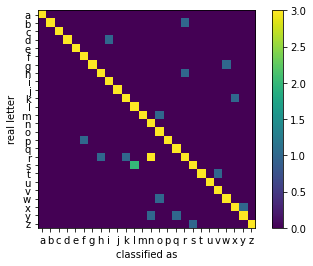

495


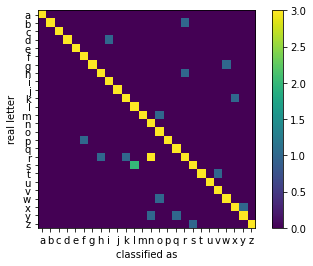

496


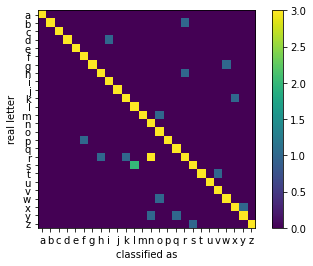

497


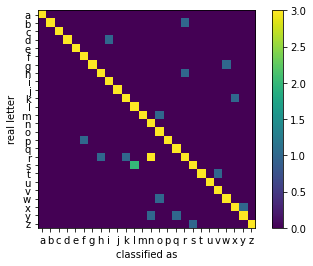

498


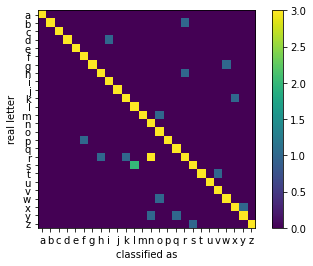

499


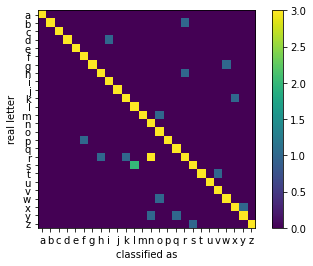

500


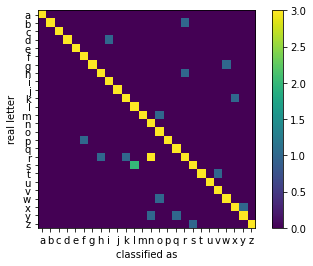

501


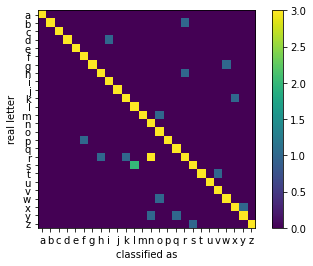

502


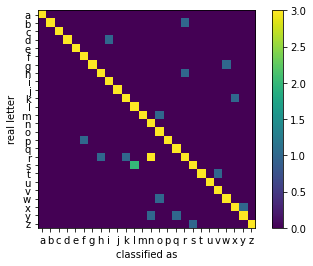

503


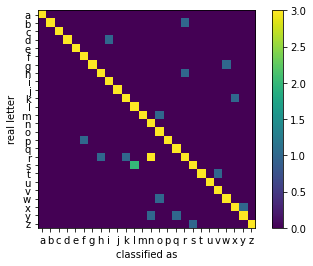

504


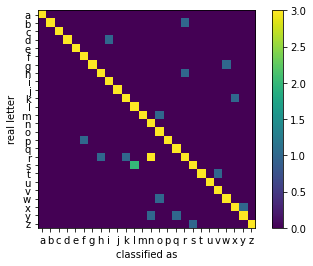

505


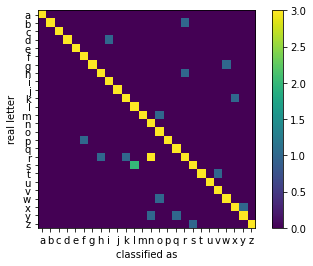

506


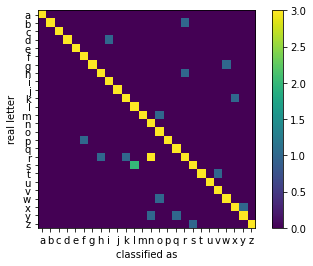

507


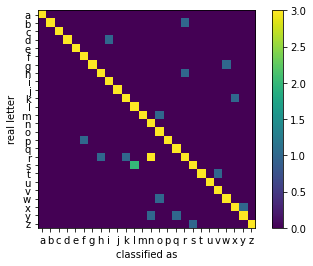

507


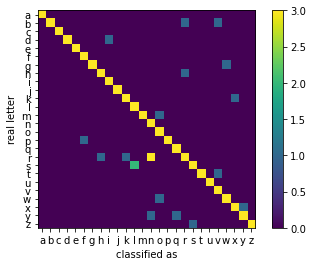

508


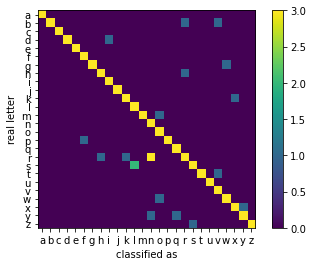

509


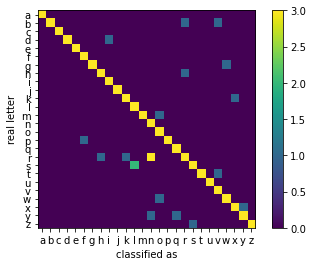

510


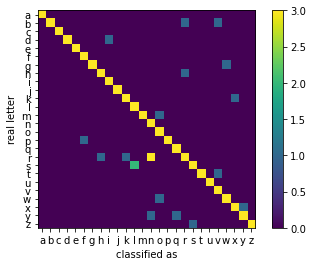

511


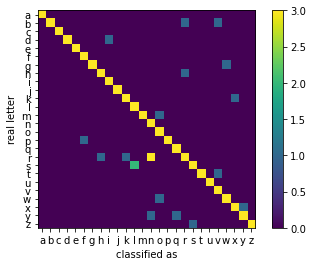

512


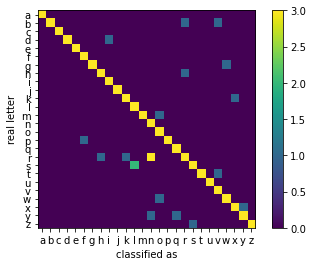

513


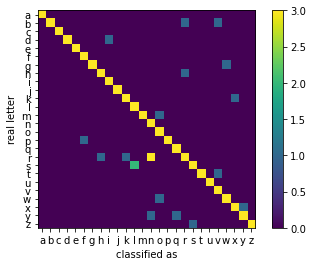

514


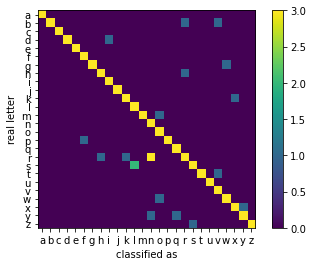

515


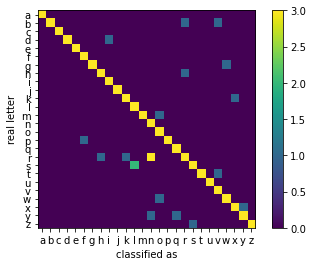

516


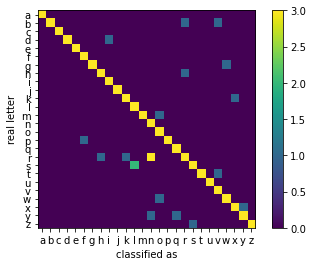

517


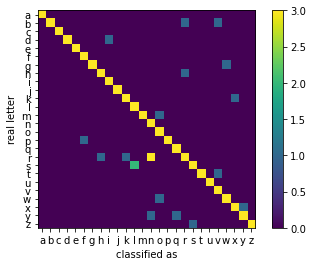

518


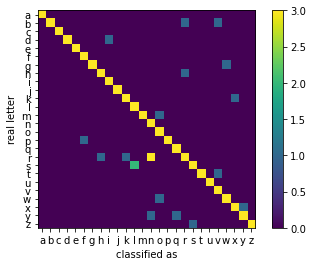

519


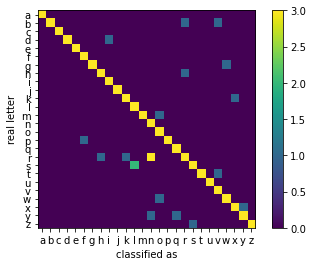

520


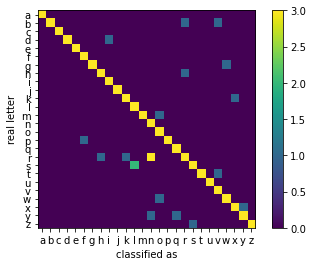

521


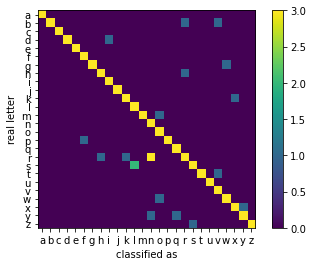

522


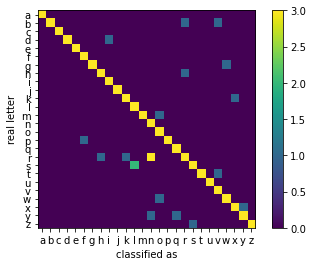

523


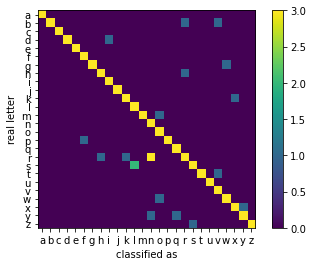

523


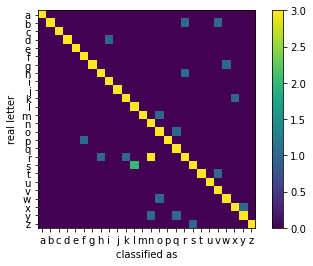

524


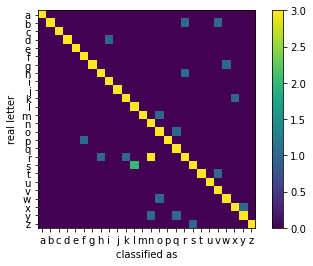

525


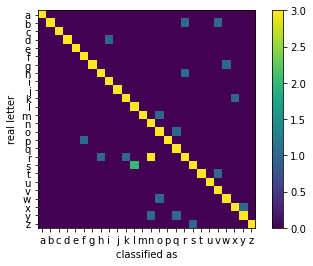

526


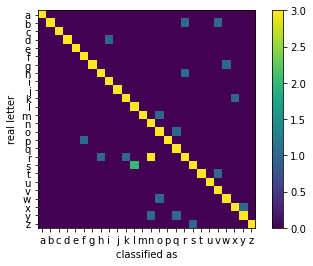

527


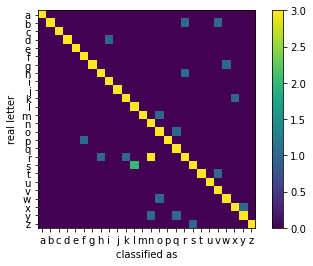

528


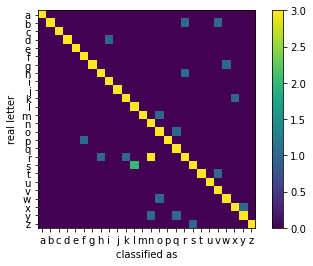

528


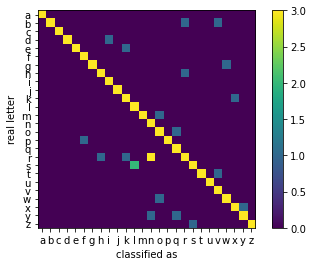

529


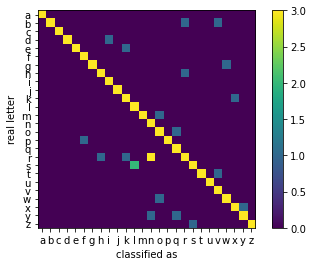

529


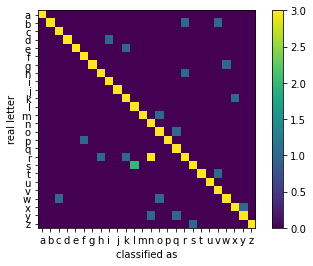

530


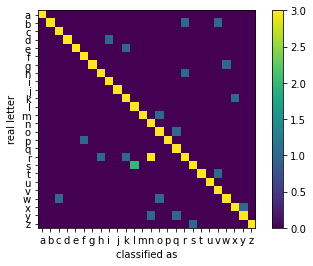

531


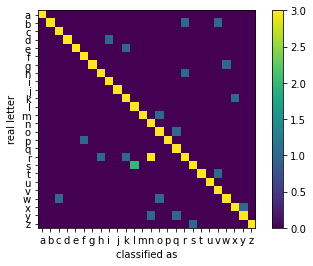

532


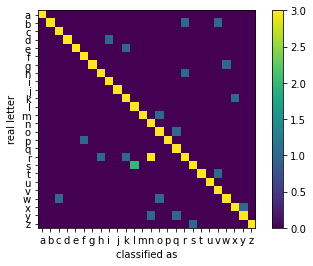

533


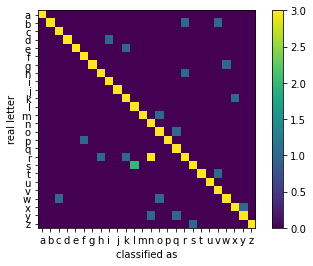

534


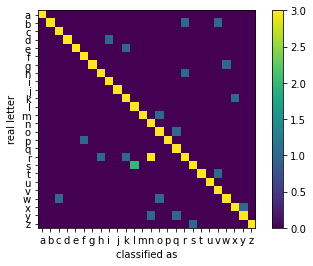

535


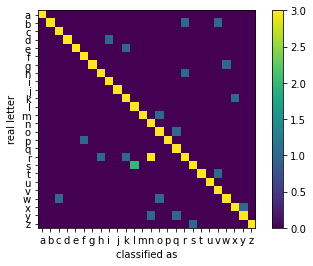

536


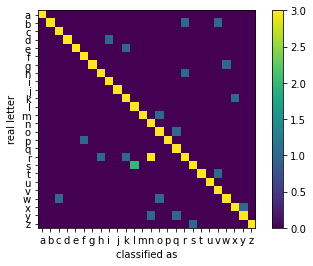

537


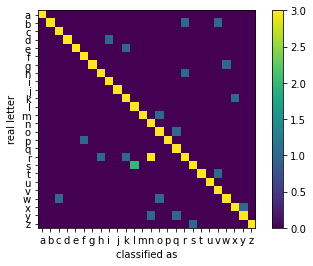

537


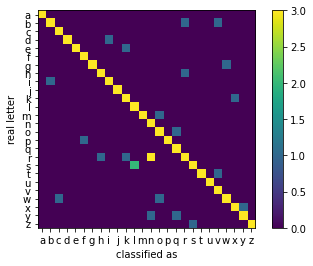

538


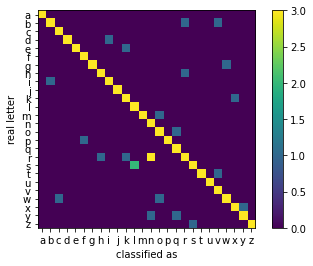

539


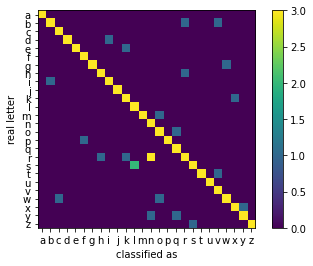

540


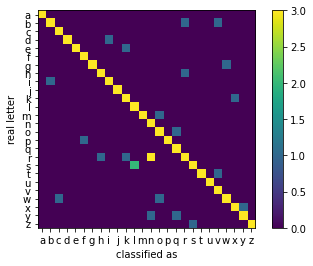

541


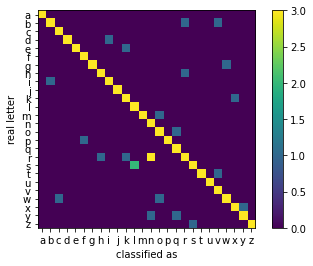

542


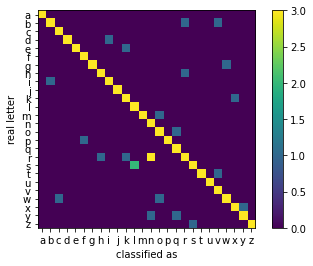

543


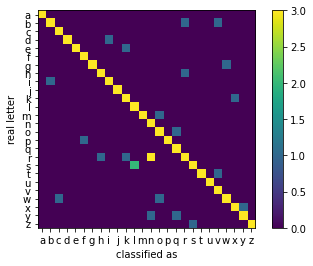

544


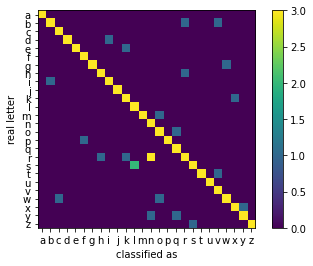

545


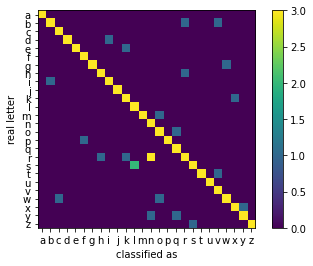

546


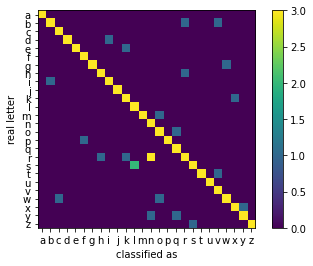

547


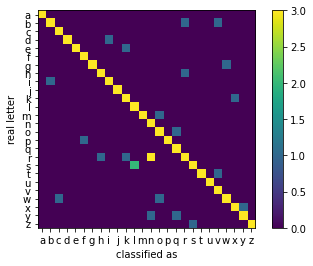

548


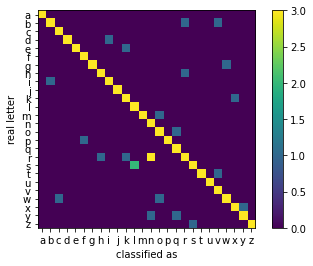

549


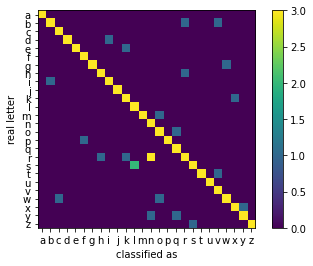

550


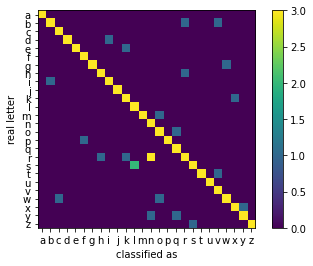

551


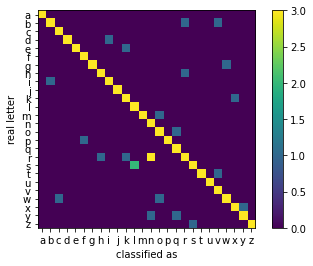

552


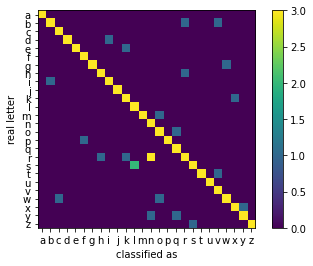

553


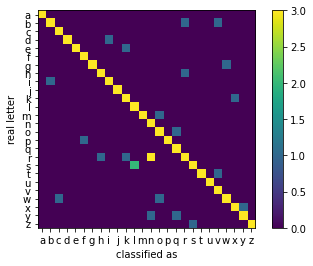

554


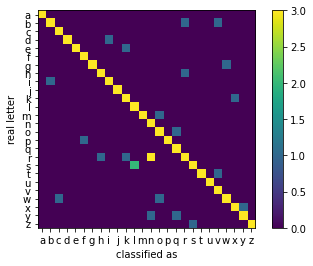

555


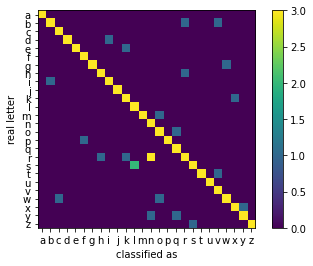

556


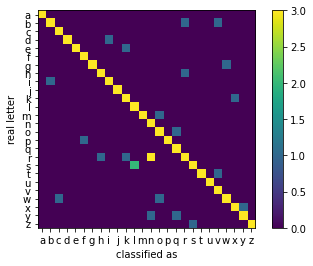

557


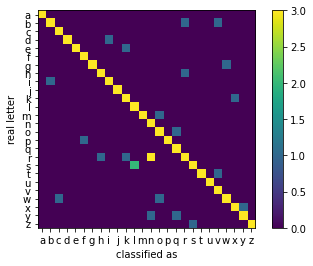

558


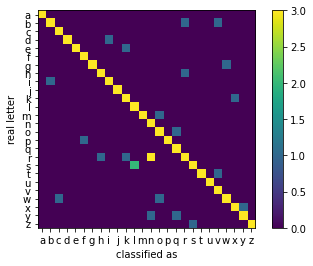

559


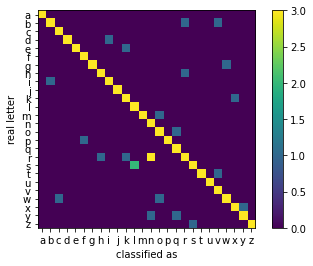

560


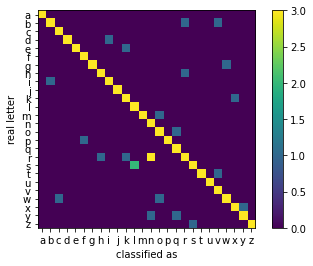

561


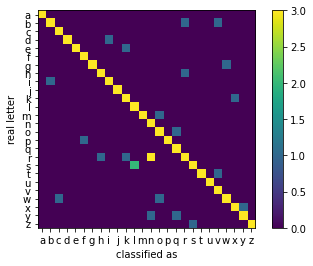

562


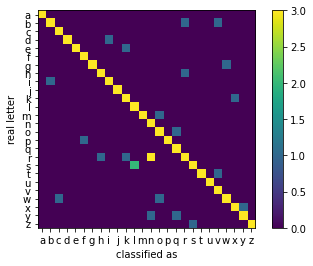

563


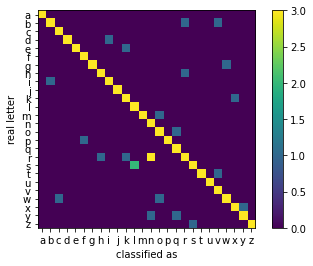

564


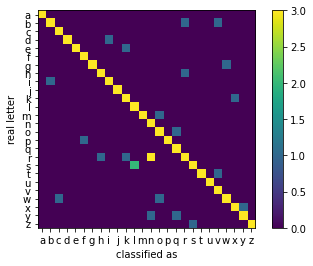

564


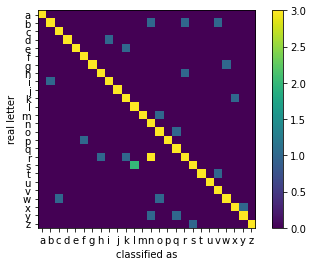

565


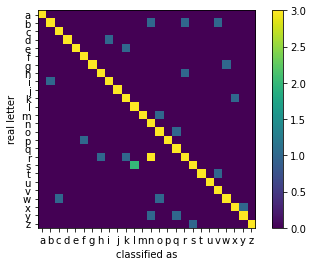

566


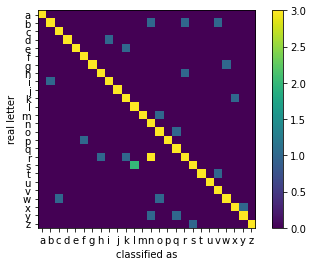

567


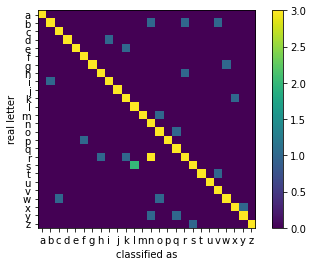

568


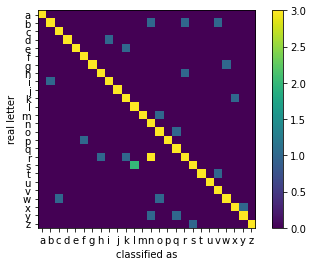

569


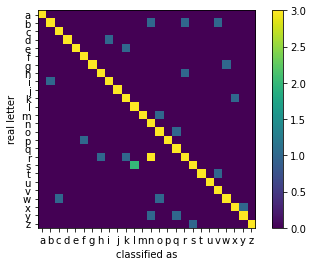

570


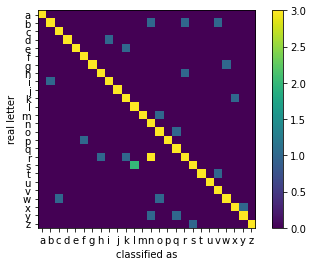

571


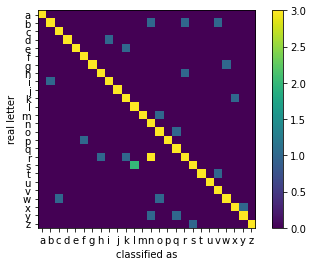

572


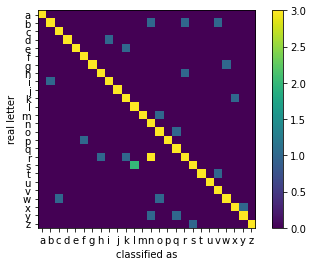

573


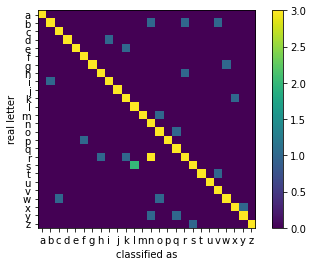

574


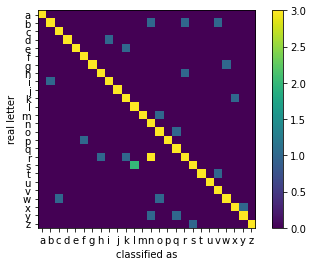

575


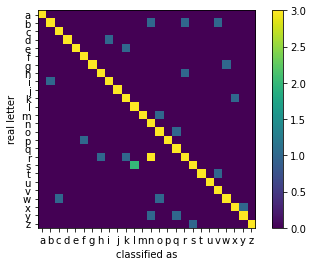

576


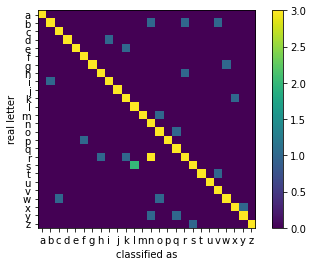

577


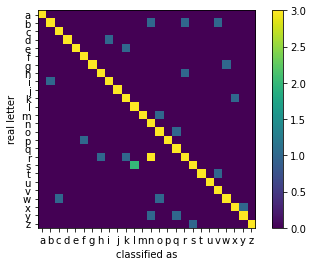

578


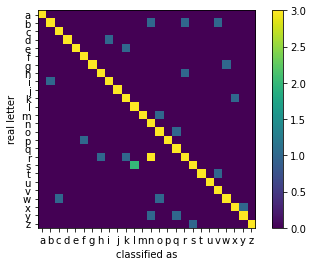

579


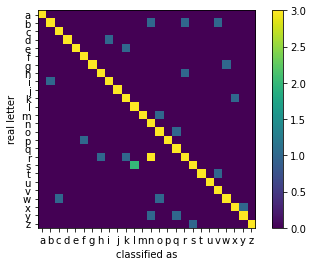

580


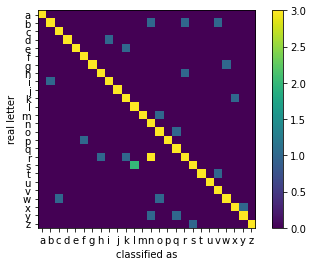

581


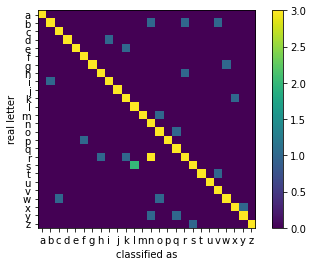

582


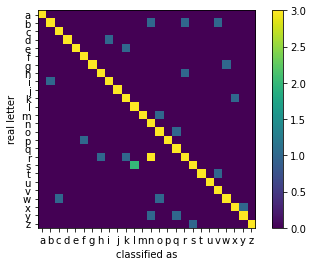

583


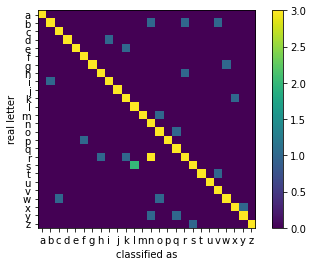

584


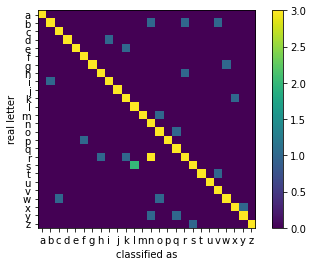

585


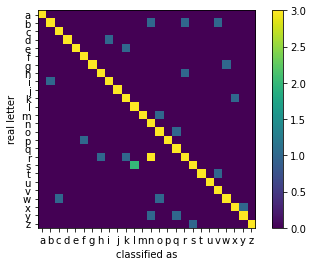

586


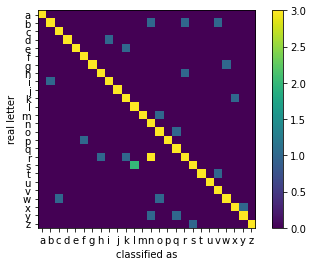

587


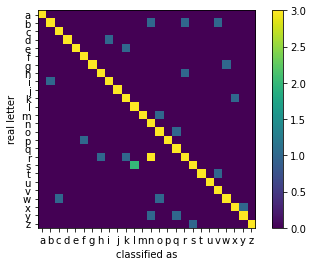

588


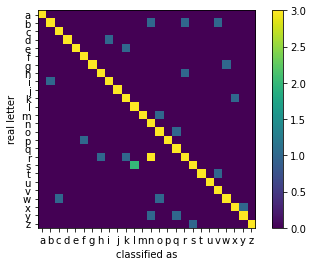

588


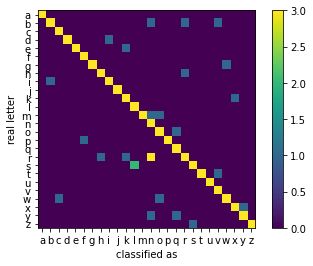

589


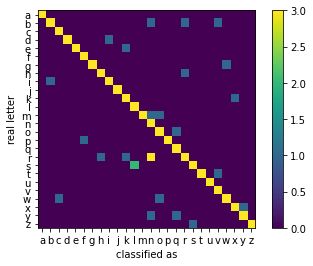

590


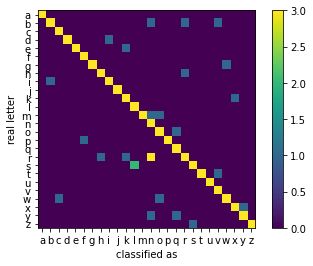

591


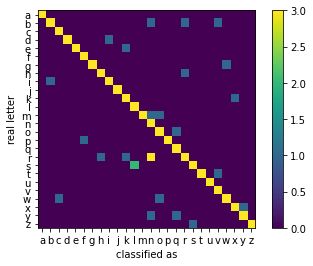

591


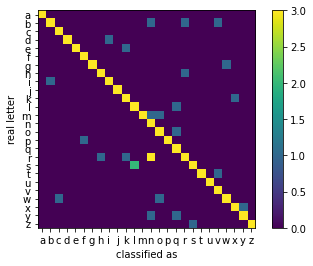

592


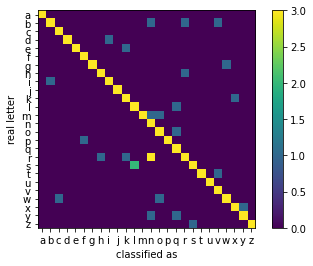

593


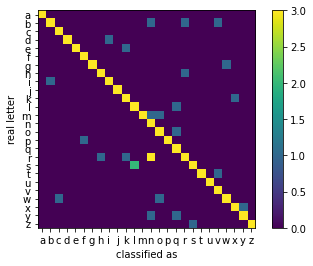

594


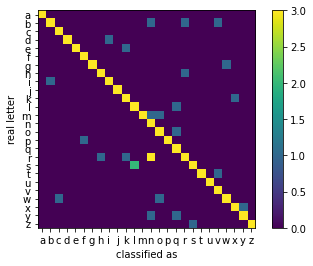

595


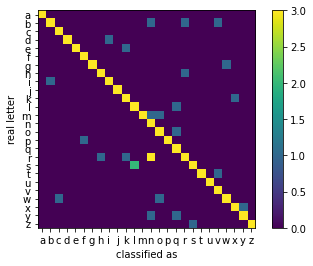

596


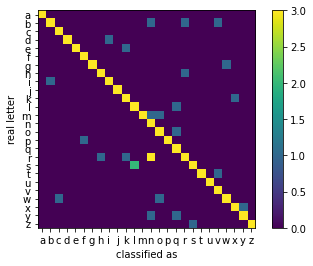

597


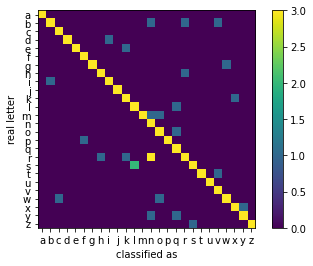

598


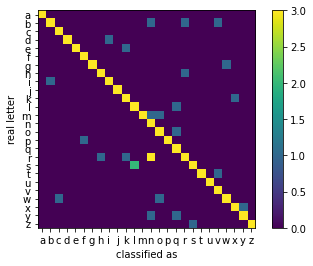

598


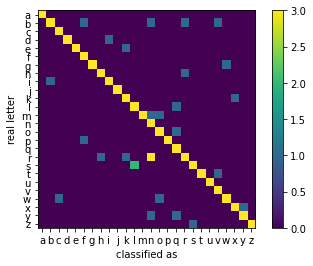

599


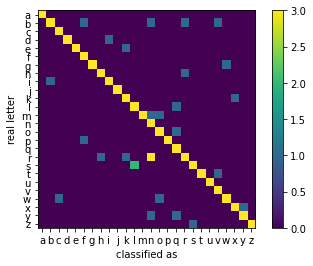

600


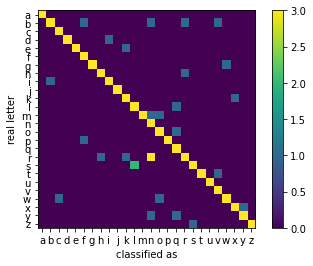

601


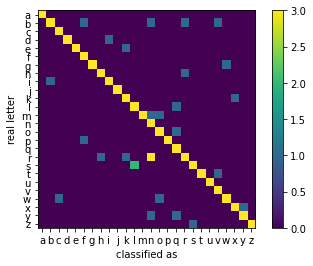

602


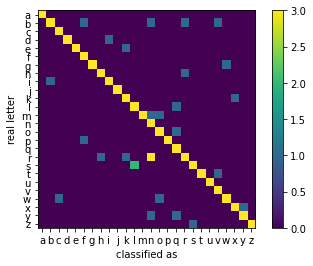

603


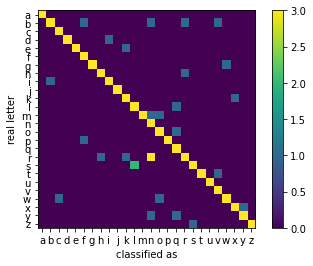

604


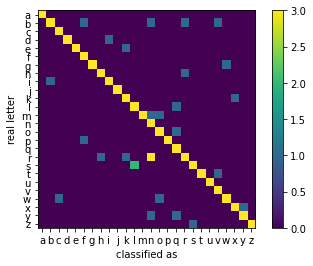

605


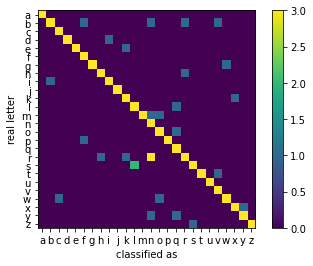

606


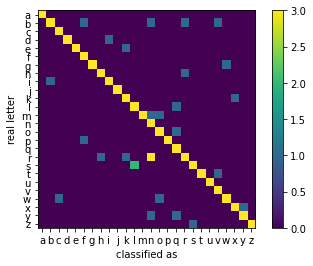

607


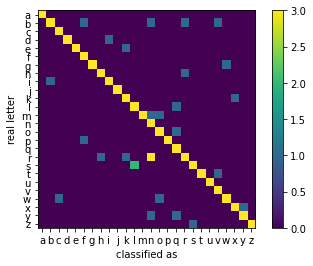

608


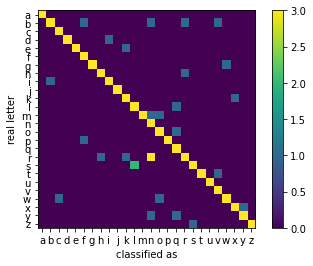

609


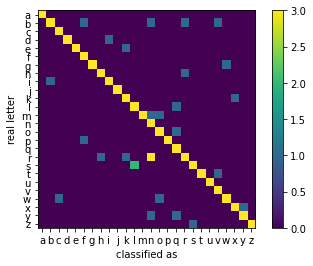

610


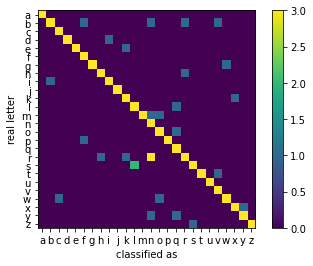

611


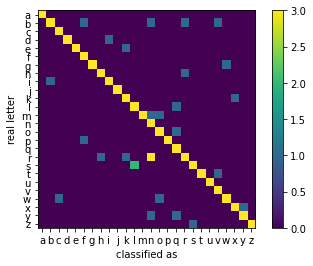

612


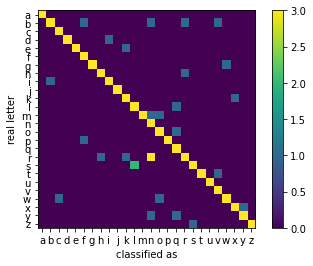

613


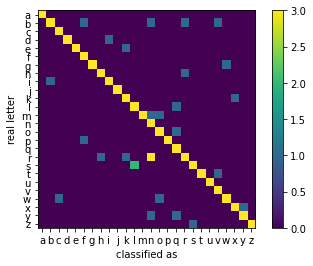

614


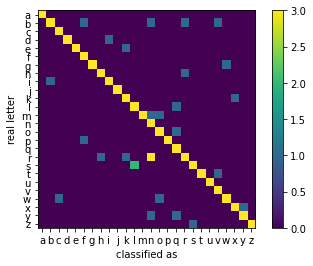

615


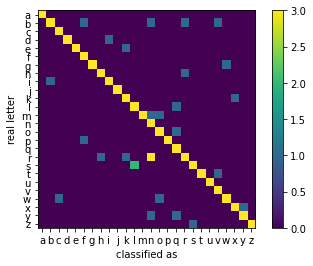

616


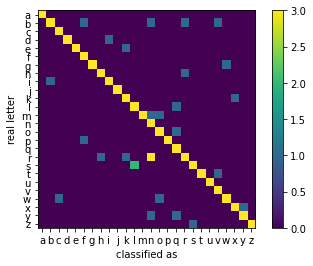

617


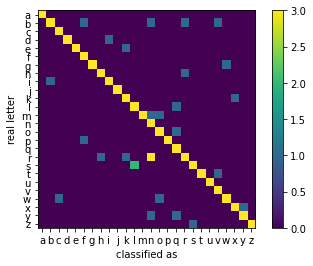

618


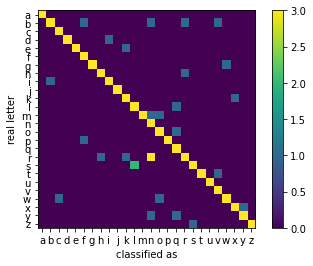

619


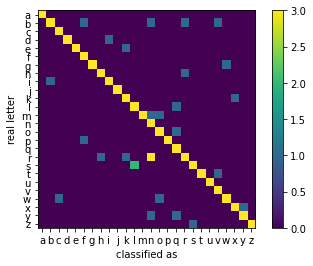

620


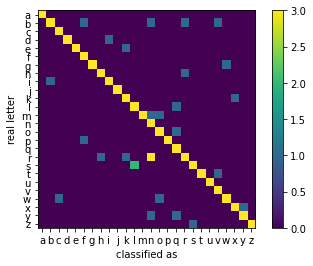

621


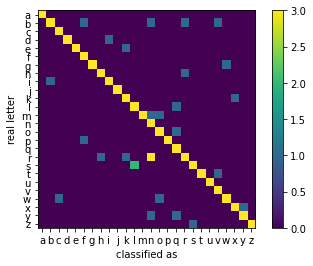

622


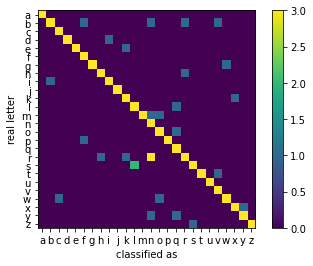

623


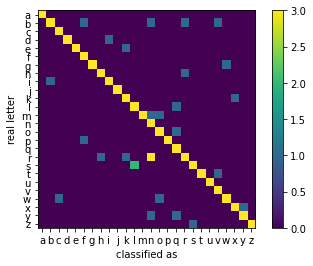

624


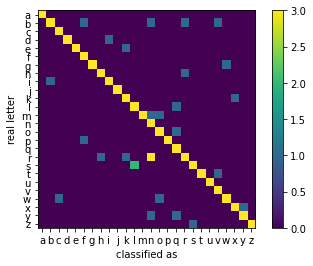

625


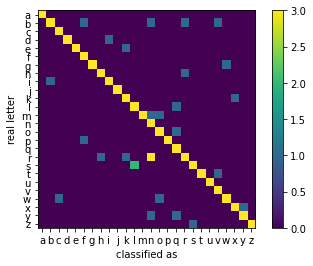

626


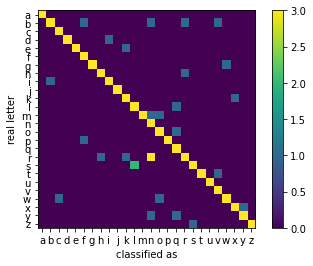

627


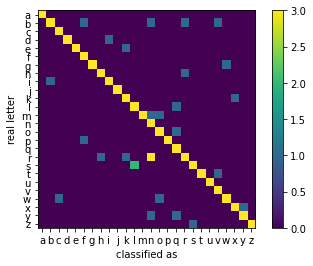

628


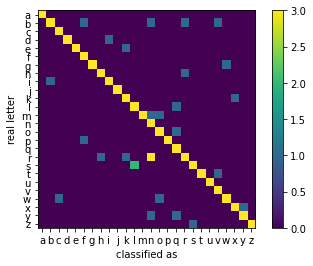

629


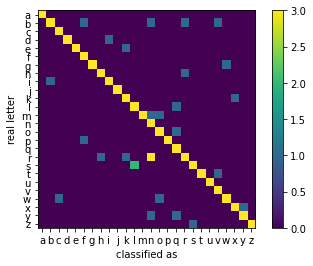

630


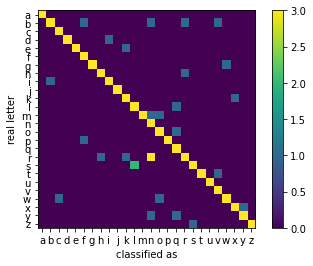

631


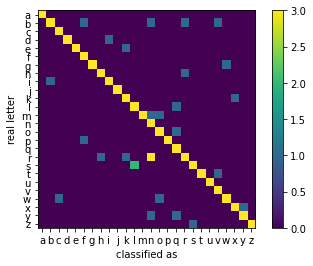

631


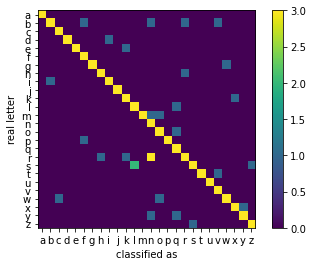

632


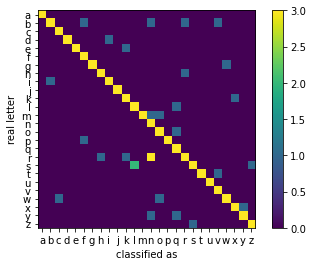

632


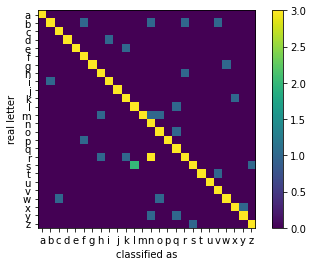

633


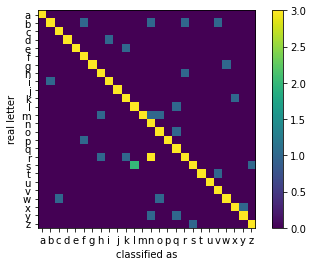

634


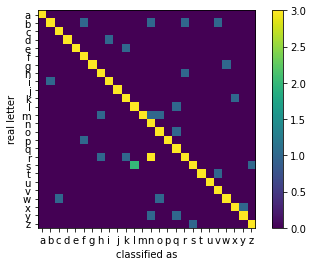

635


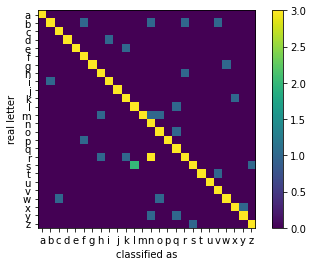

636


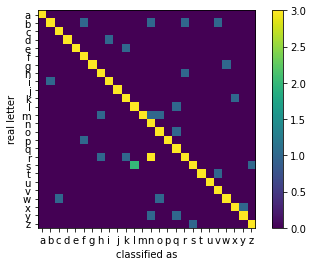

637


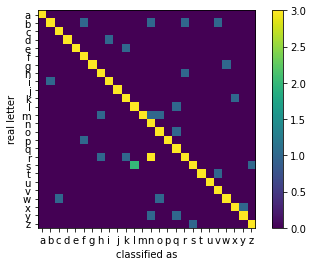

638


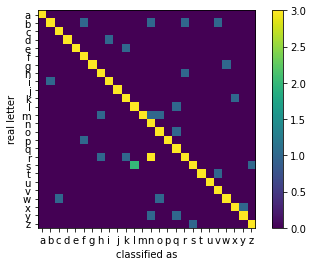

639


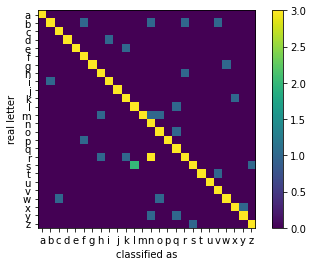

640


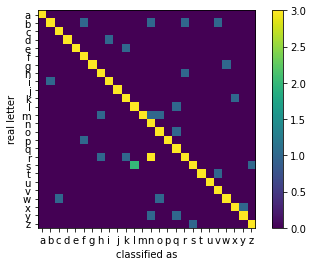

641


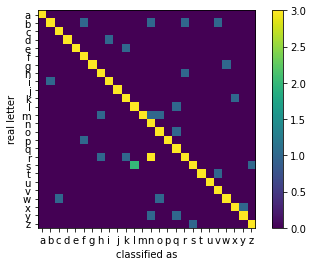

642


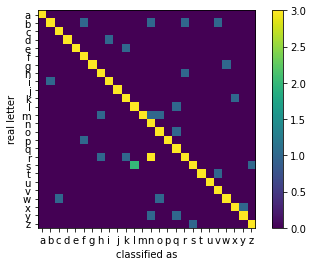

643


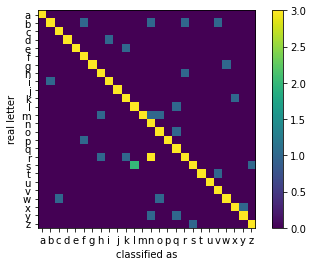

644


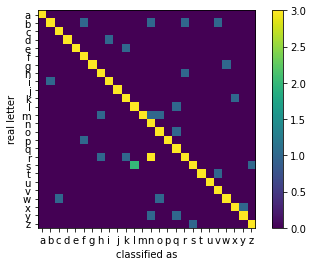

645


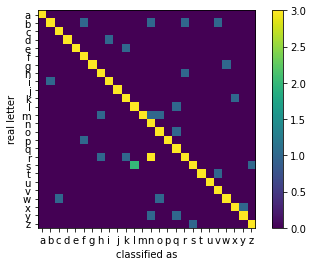

646


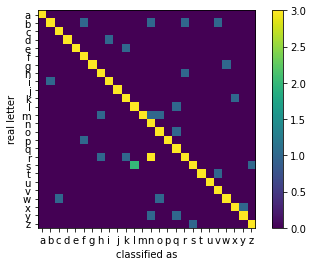

647


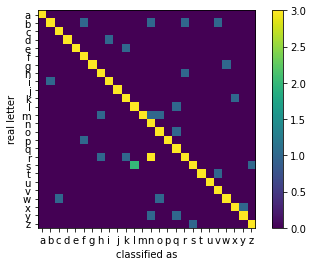

648


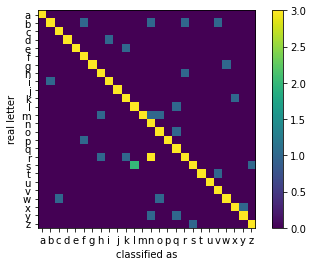

649


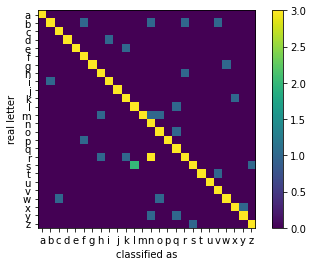

650


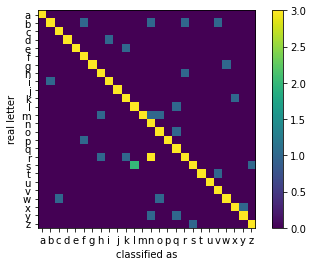

651


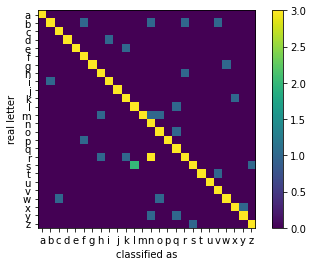

652


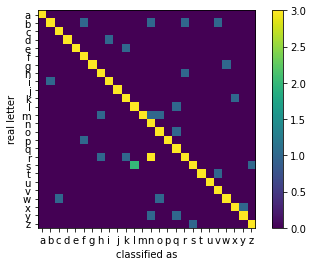

653


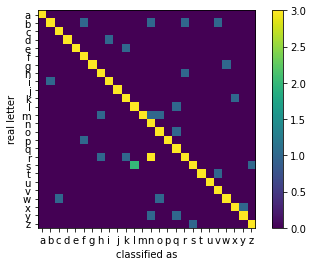

654


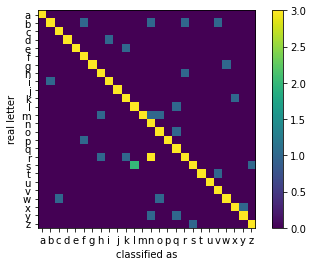

655


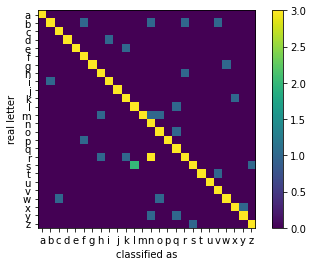

656


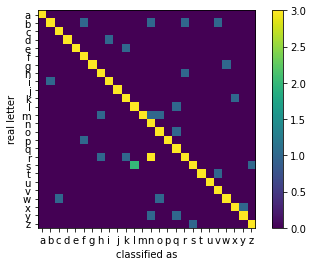

657


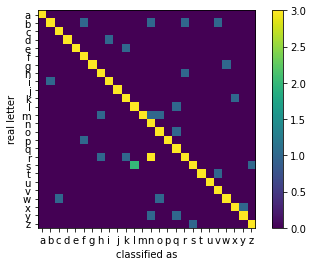

658


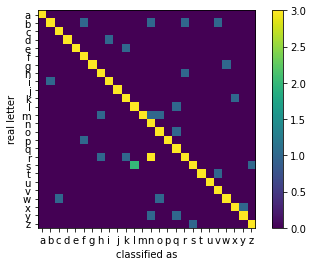

659


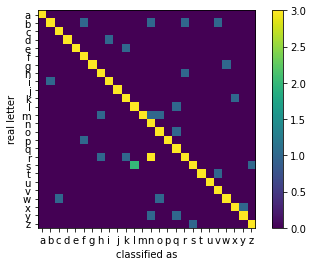

660


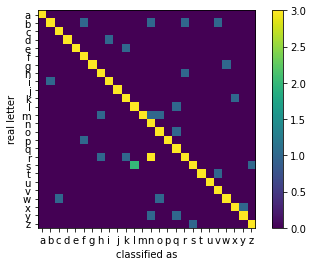

661


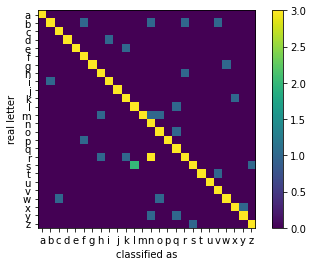

662


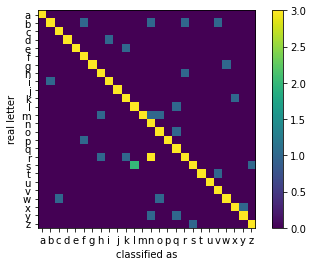

663


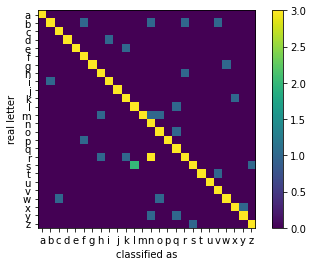

664


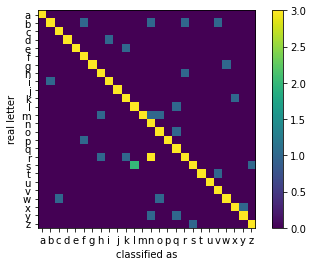

665


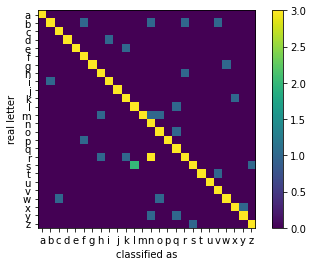

666


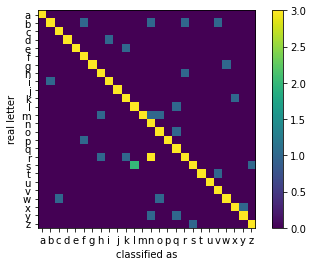

667


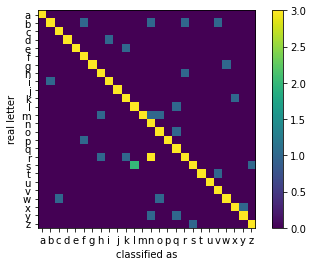

668


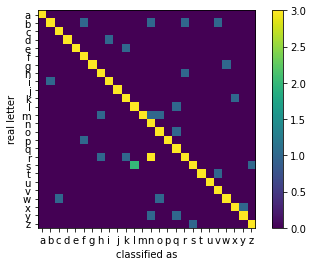

668


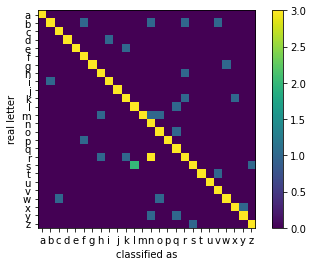

669


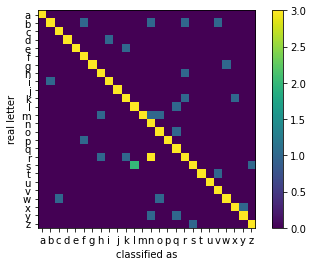

670


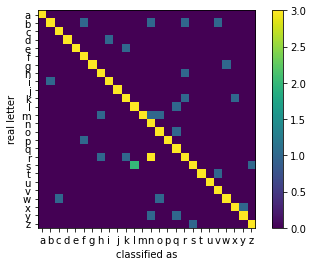

671


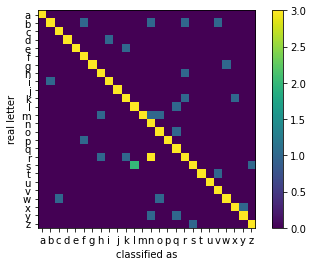

672


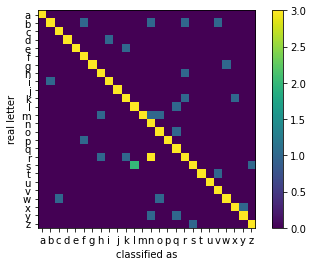

673


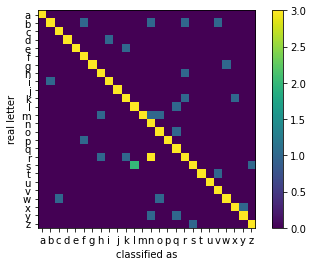

674


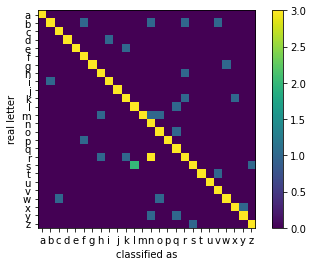

675


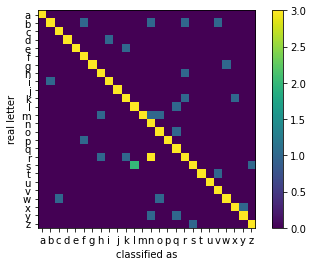

676


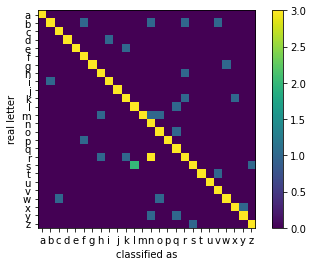

677


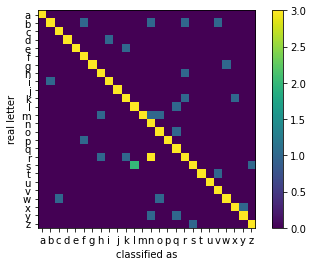

678


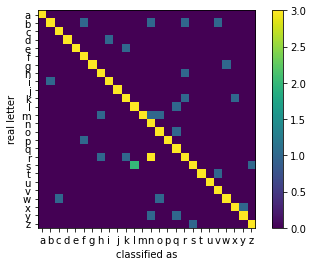

679


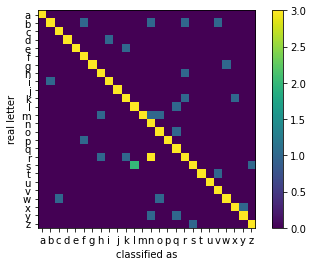

680


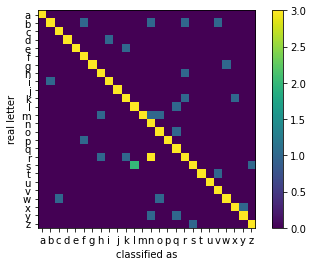

681


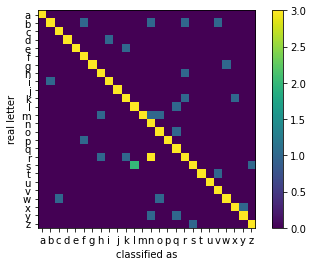

681


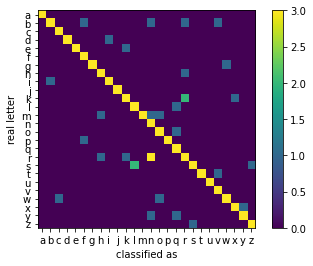

682


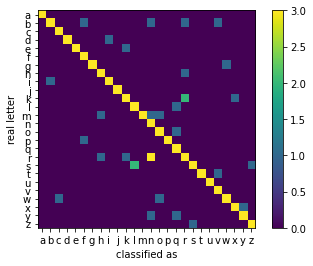

683


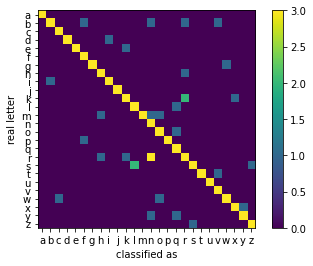

684


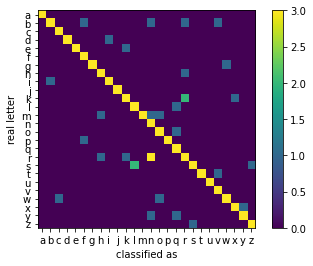

684


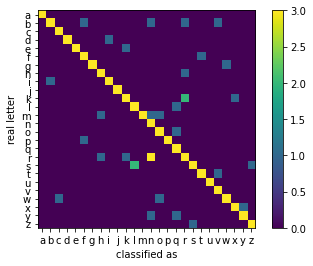

685


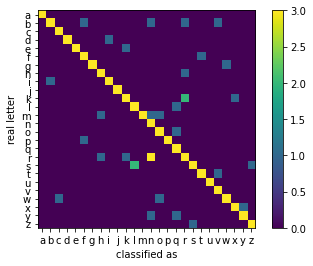

686


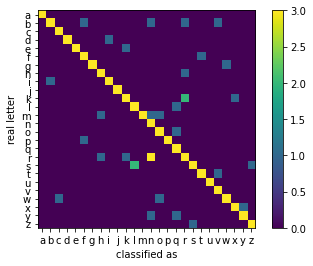

687


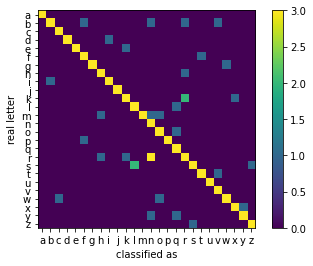

688


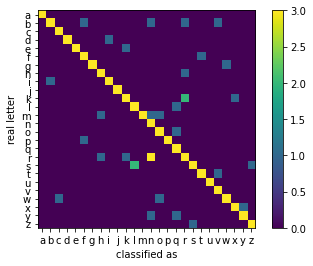

689


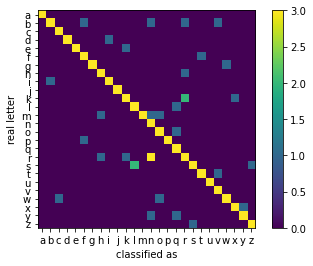

690


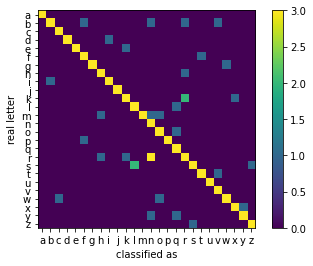

691


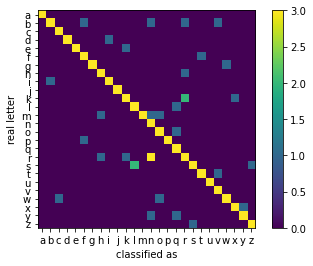

692


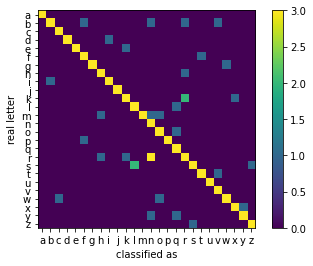

693


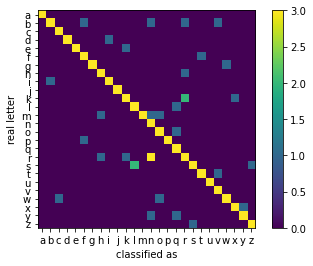

694


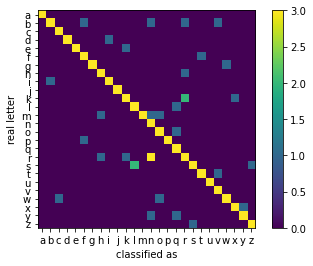

695


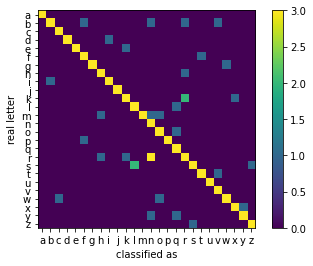

696


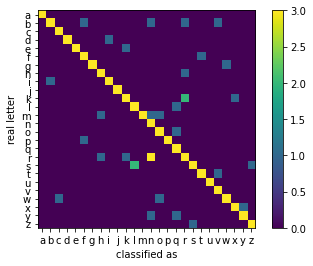

697


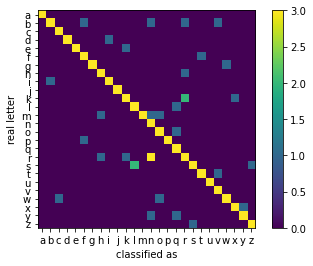

698


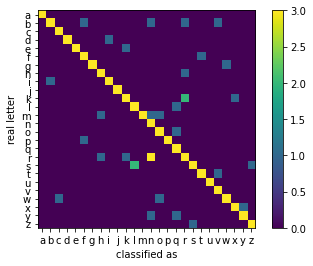

699


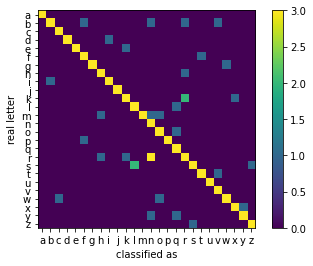

700


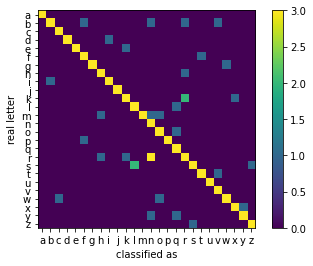

700


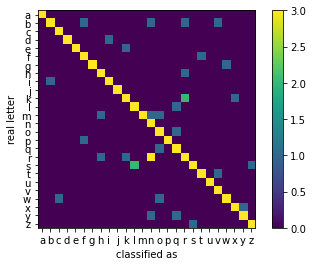

701


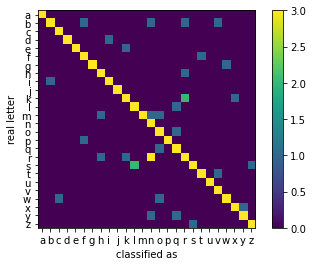

702


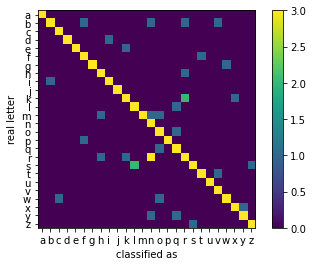

703


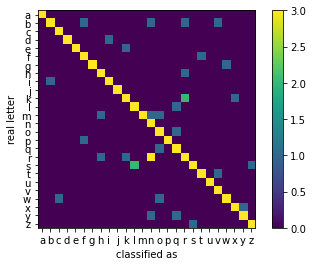

704


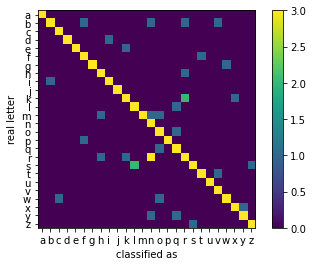

705


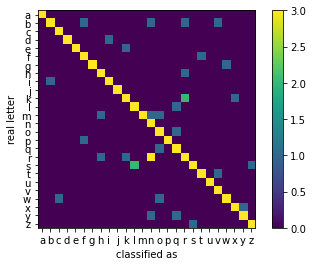

706


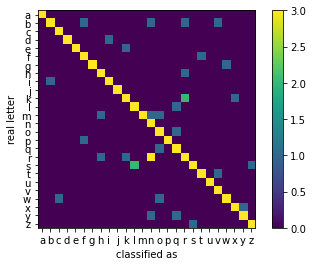

707


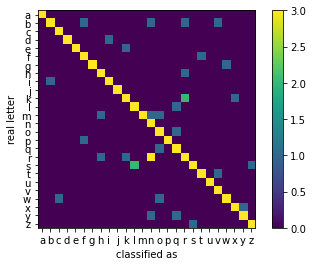

708


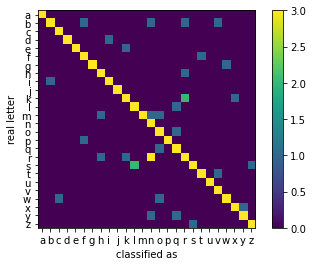

709


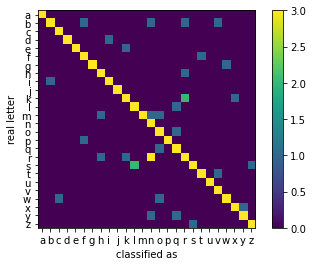

710


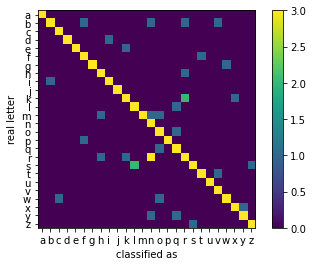

710


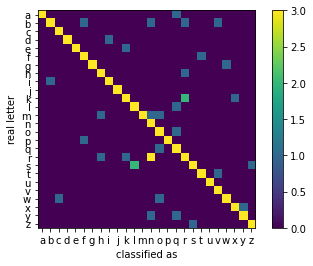

711


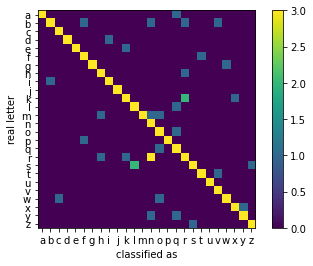

712


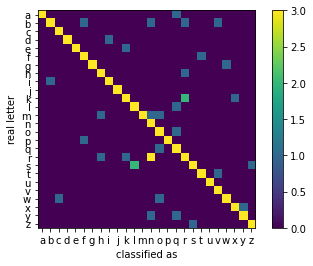

713


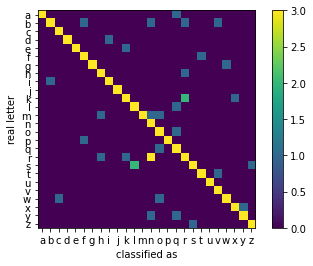

714


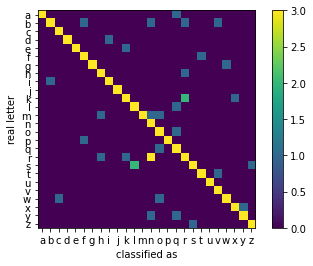

715


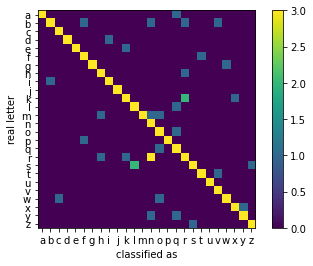

716


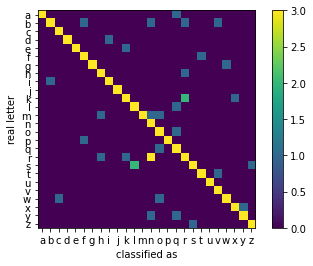

717


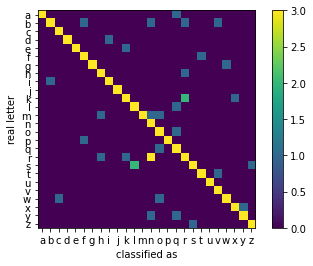

718


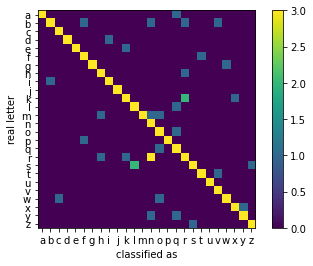

719


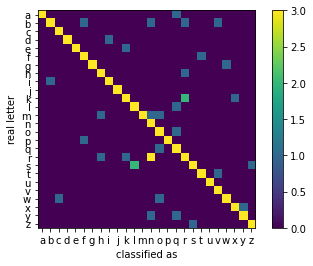

720


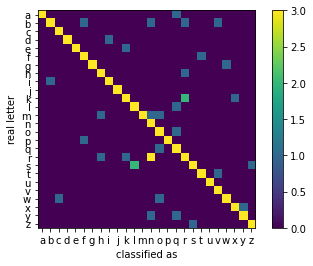

721


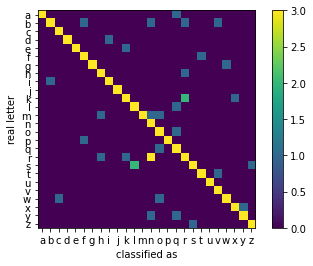

722


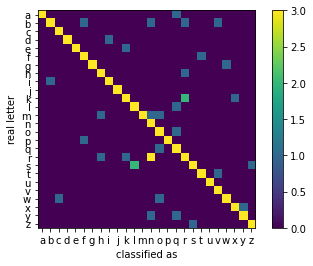

722


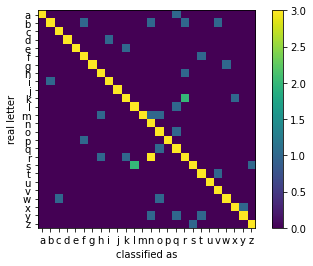

722


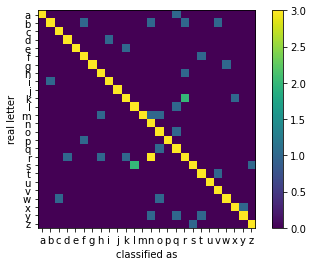

723


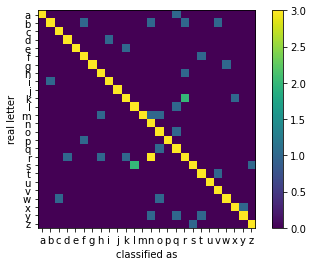

724


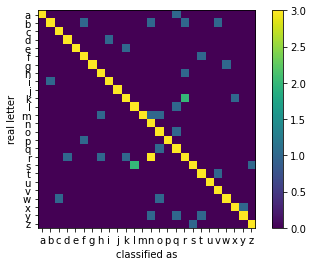

725


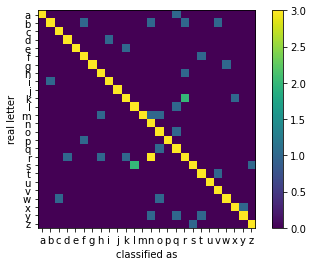

726


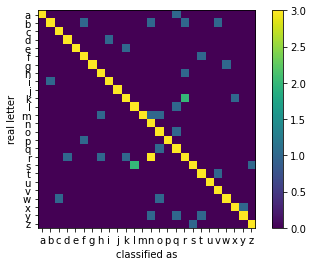

727


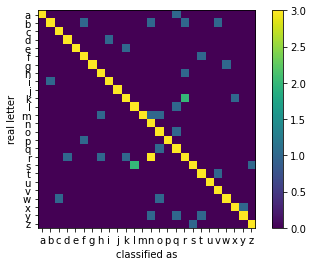

728


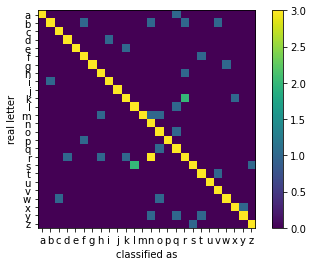

729


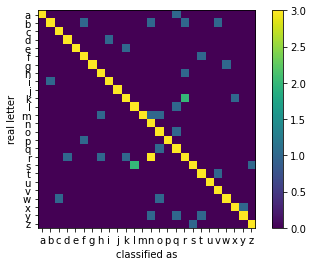

730


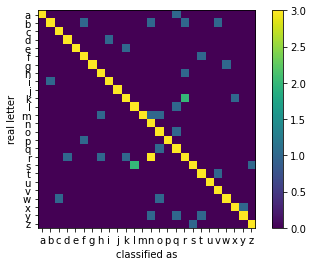

731


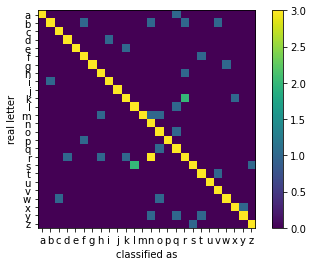

731


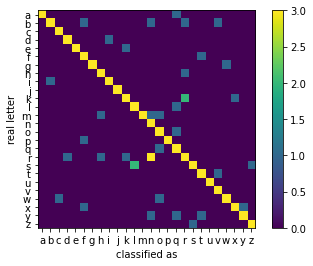

732


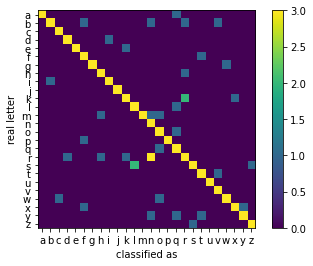

733


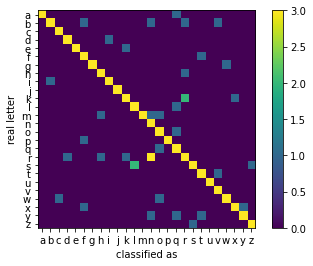

734


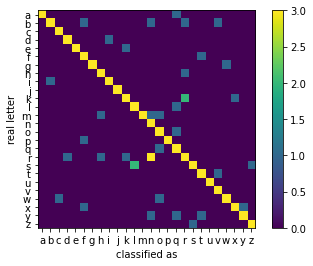

735


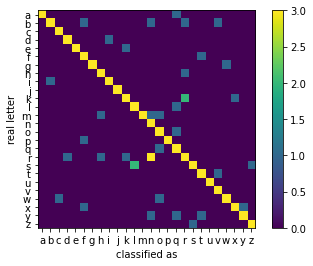

736


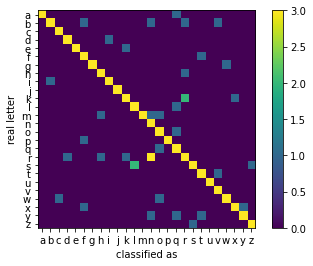

737


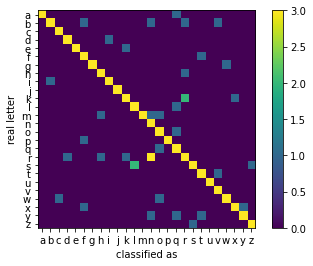

738


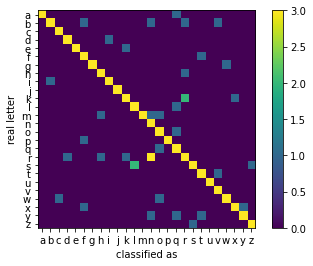

739


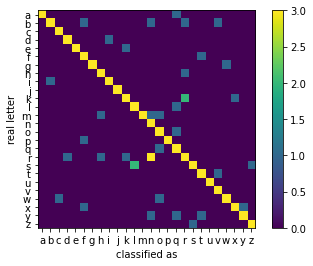

740


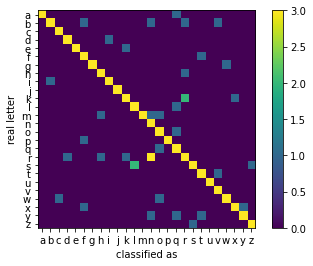

741


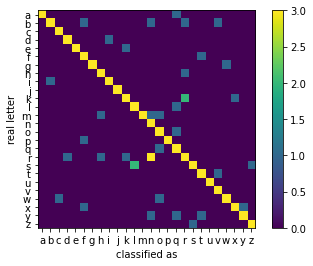

742


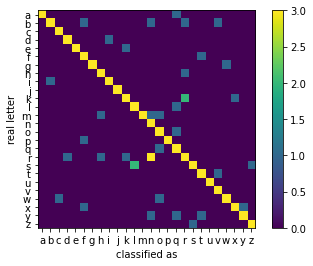

743


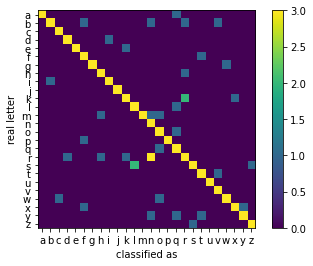

744


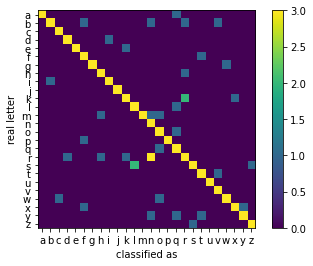

745


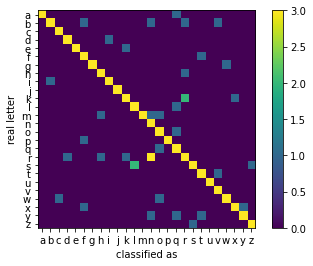

746


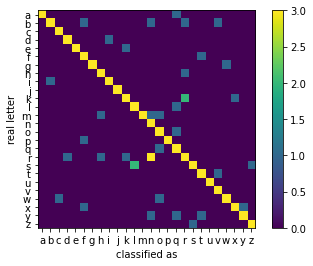

747


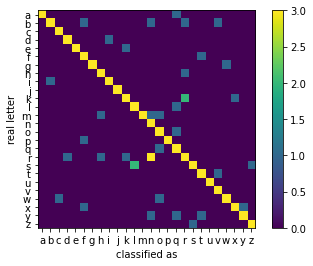

748


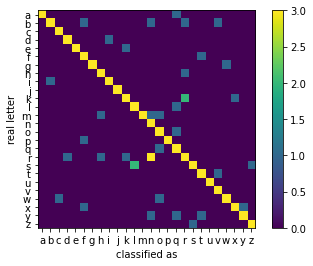

749


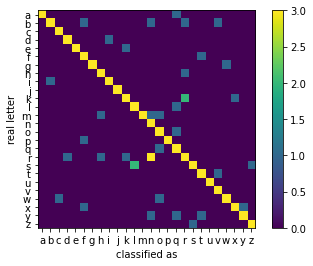

750


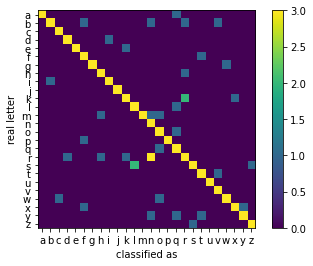

751


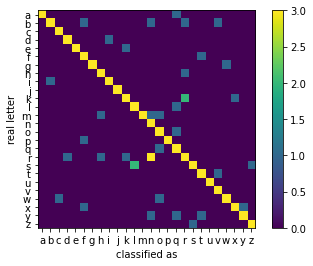

752


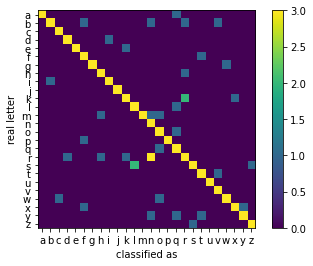

753


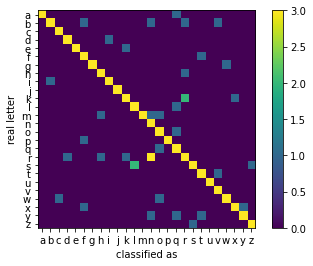

754


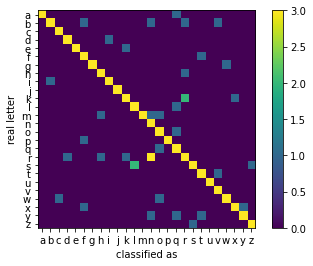

755


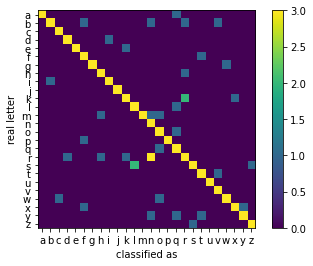

756


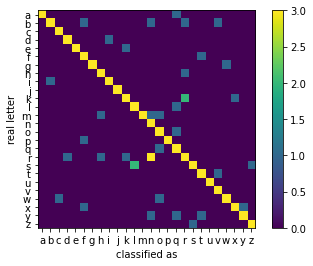

757


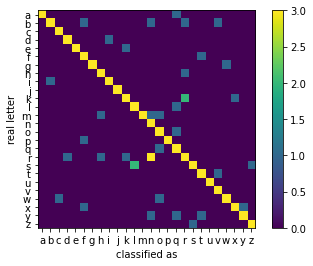

758


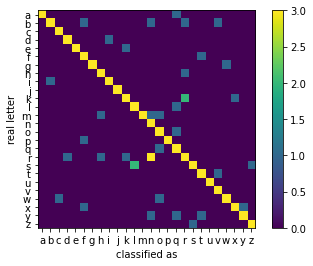

759


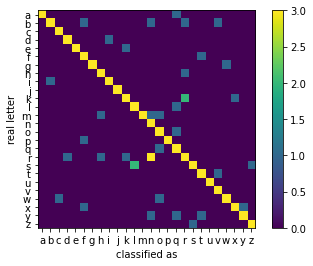

760


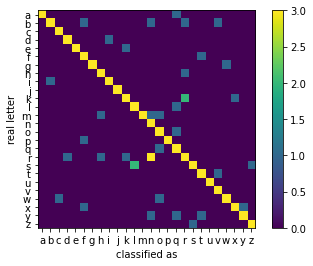

761


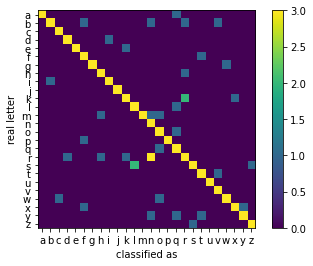

762


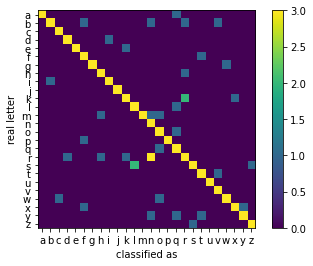

763


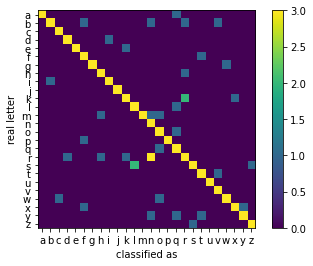

764


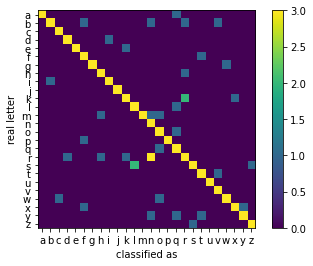

765


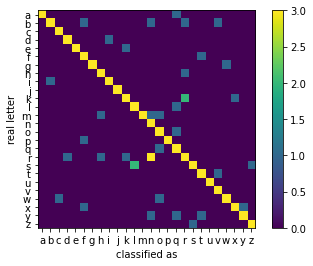

766


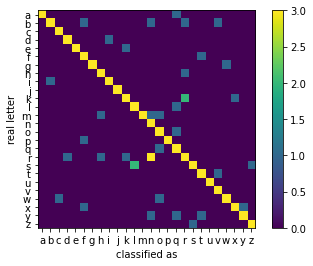

767


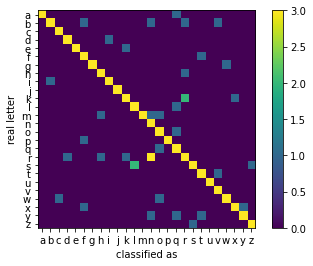

768


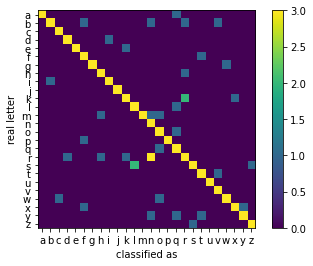

769


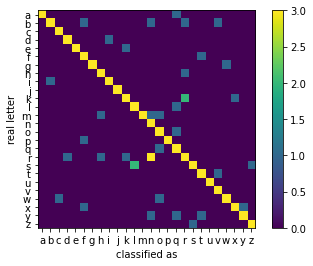

770


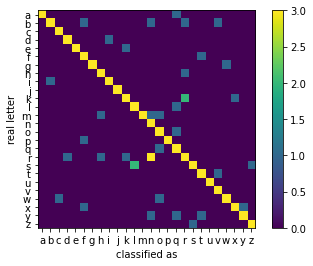

771


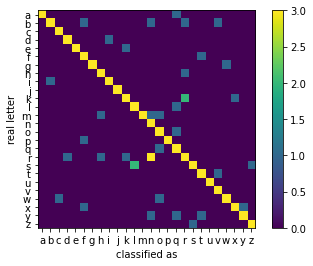

772


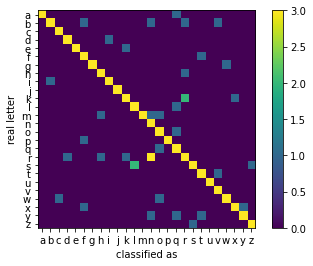

773


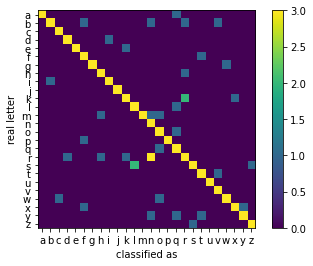

774


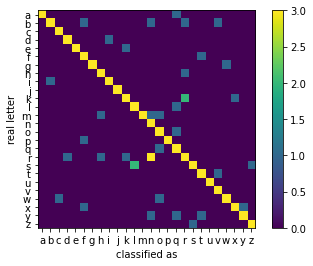

775


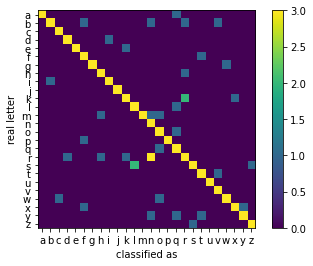

776


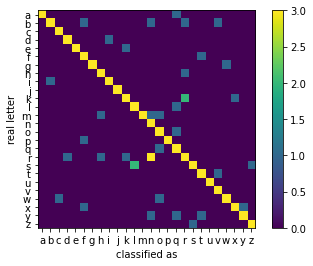

777


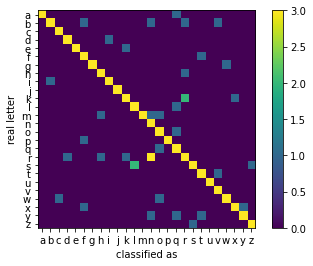

778


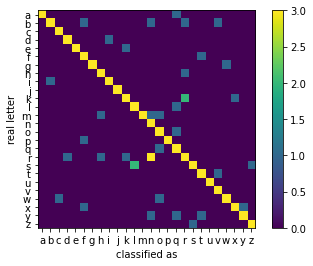

779


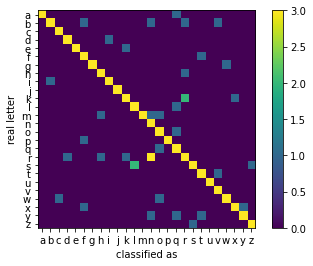

780


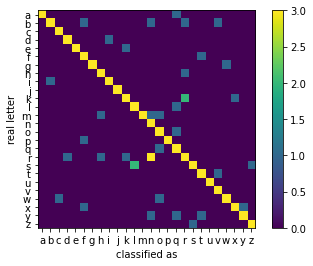

781


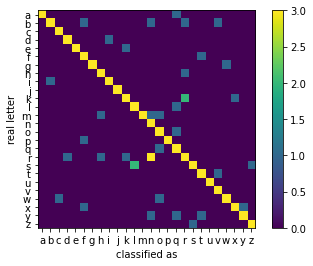

782


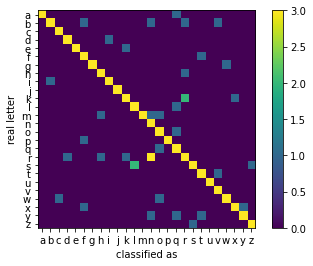

783


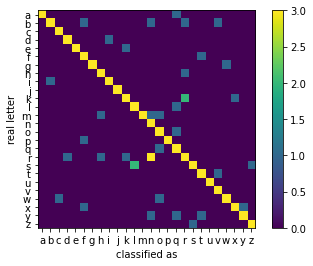

783


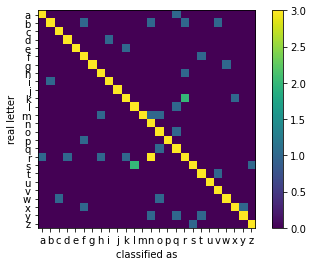

784


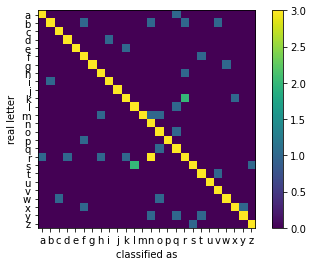

785


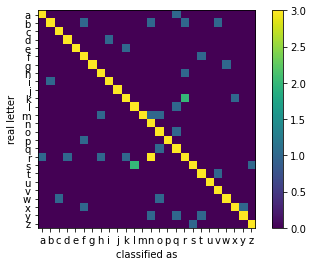

786


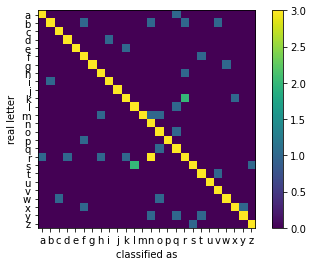

787


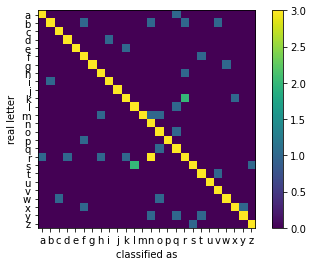

788


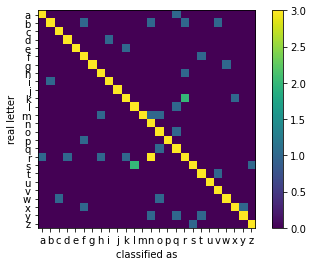

789


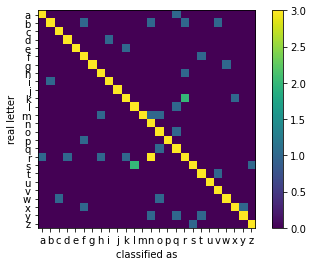

790


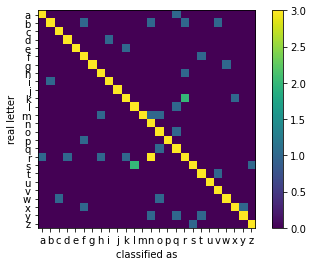

791


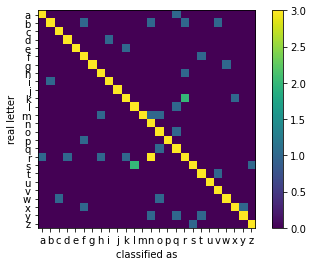

792


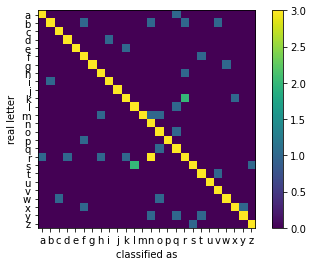

793


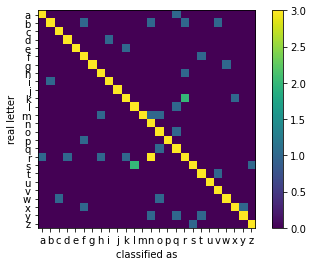

794


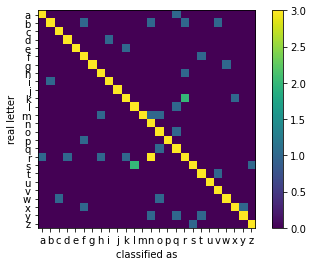

795


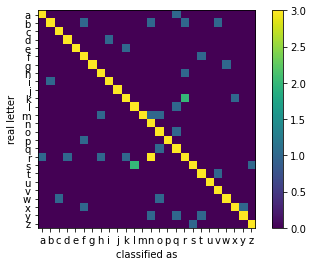

795


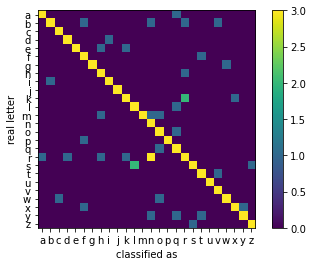

795


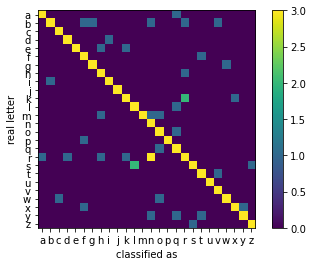

796


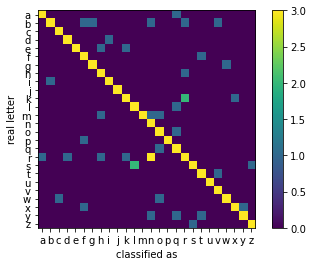

797


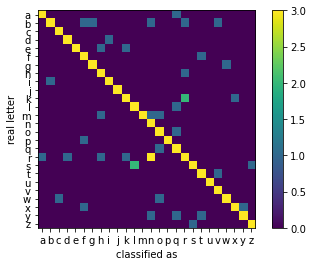

798


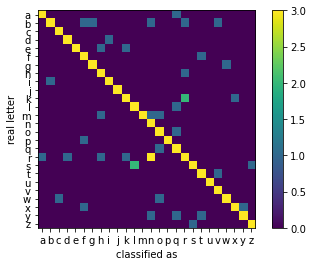

799


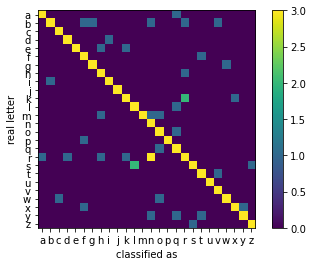

800


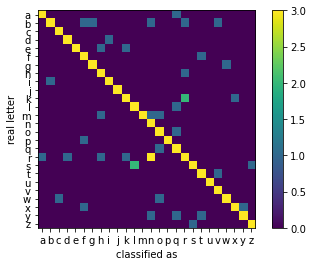

801


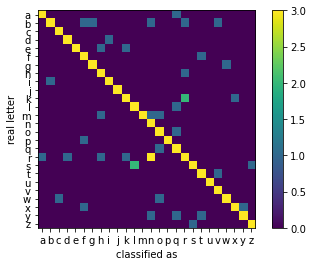

802


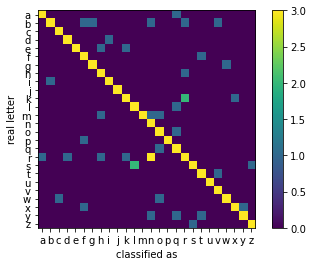

803


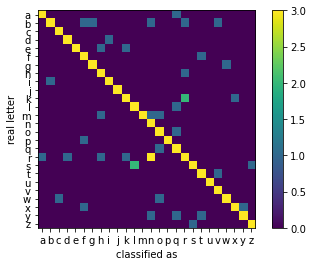

804


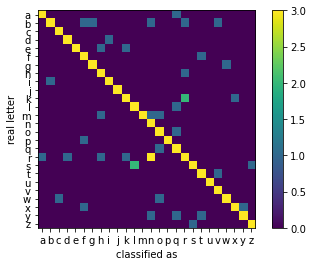

805


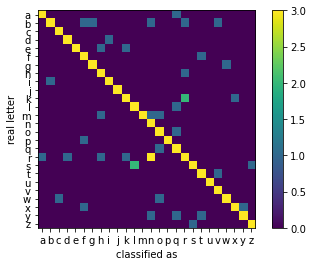

806


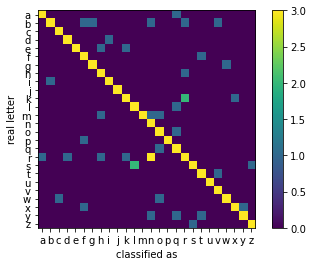

807


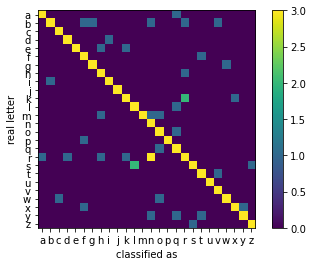

808


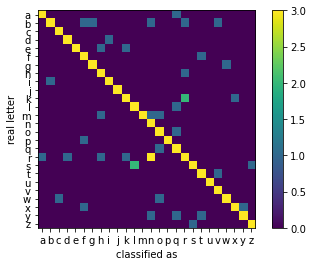

809


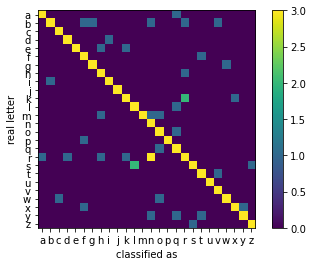

810


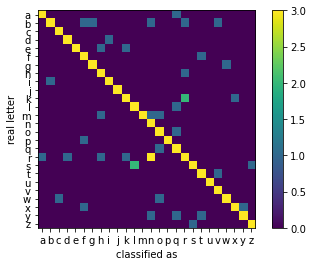

811


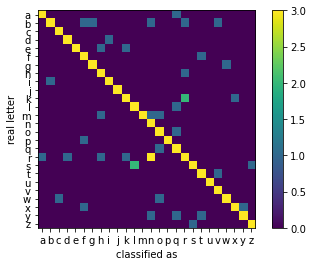

812


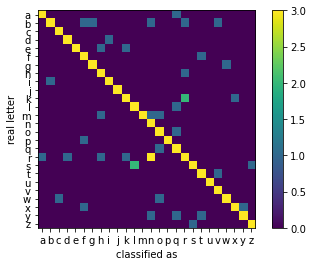

813


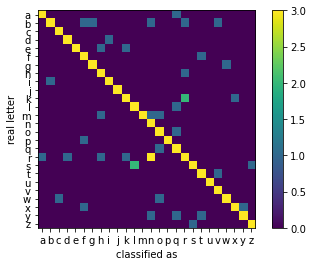

814


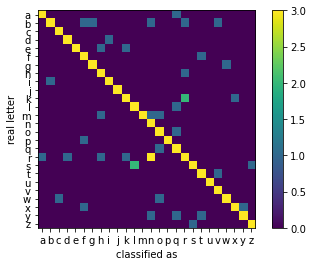

815


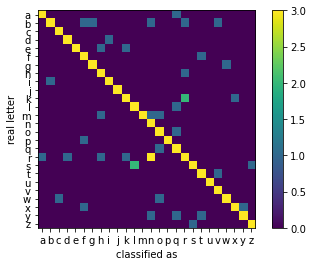

816


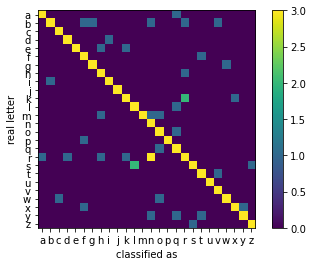

817


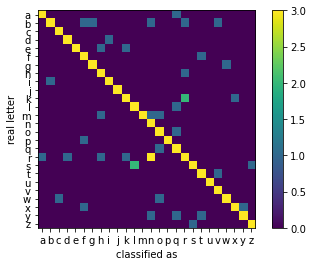

818


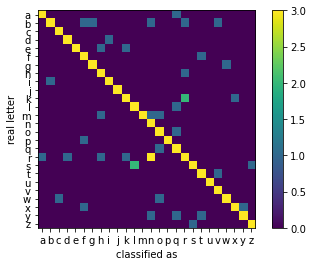

819


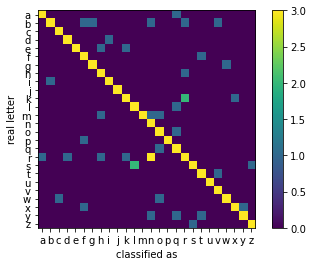

820


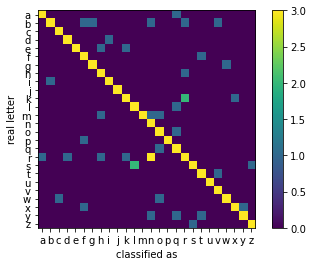

821


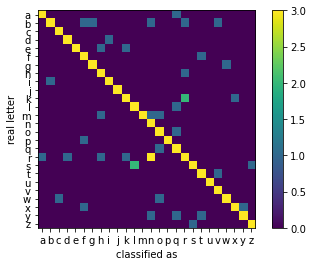

822


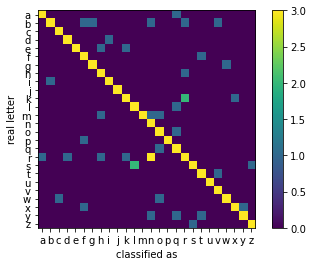

823


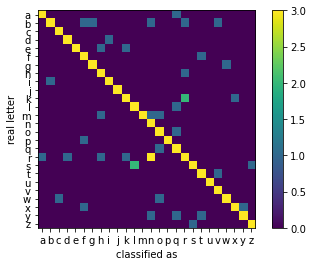

824


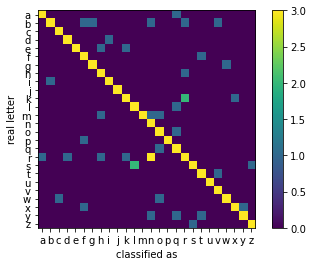

825


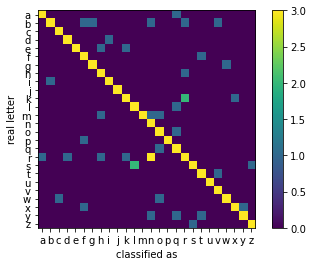

826


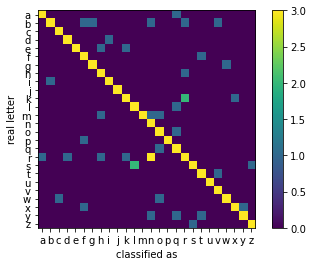

827


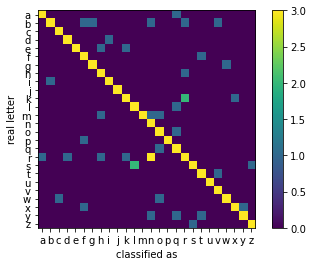

828


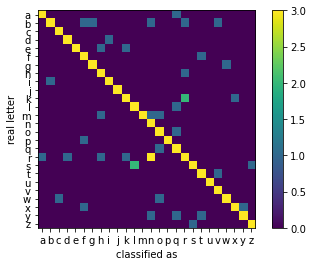

829


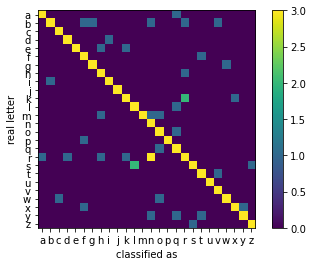

830


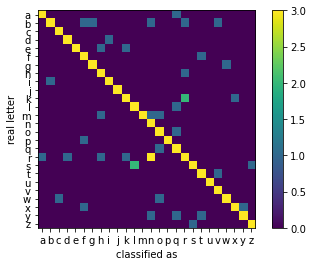

831


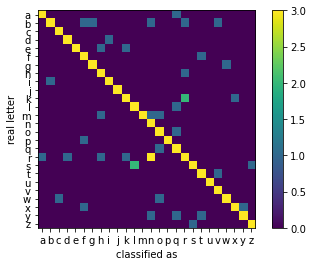

832


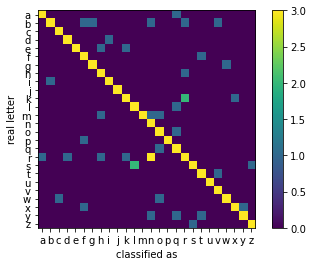

833


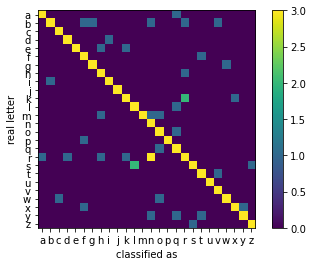

834


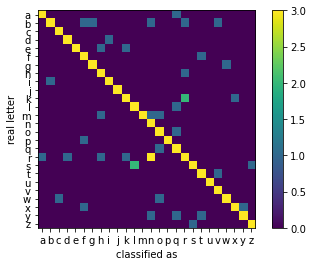

835


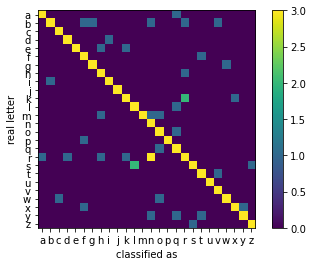

836


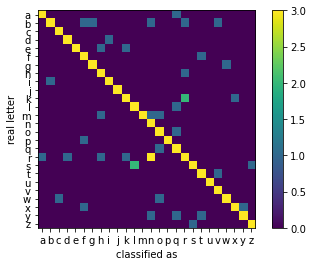

837


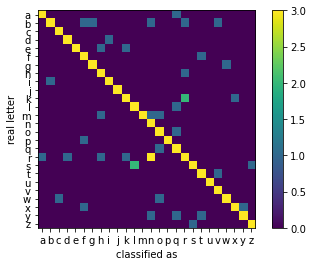

838


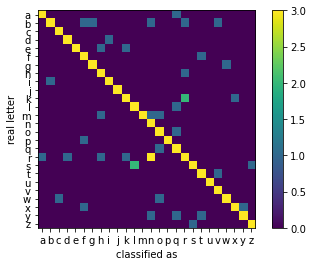

839


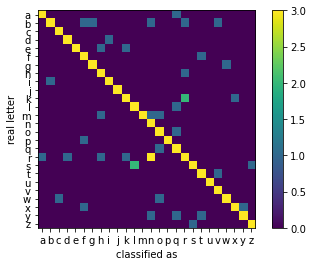

840


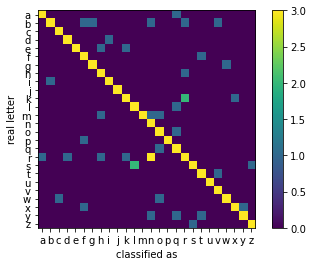

841


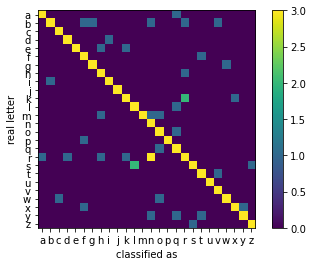

842


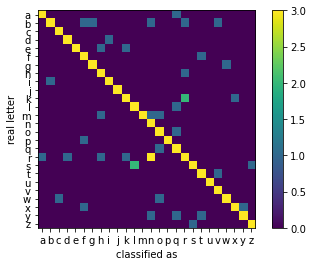

843


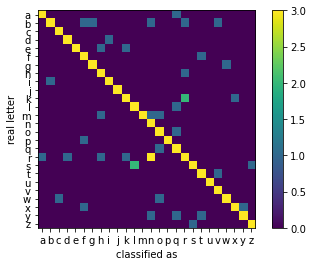

844


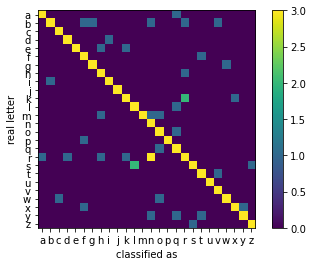

845


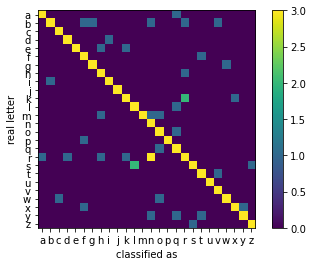

846


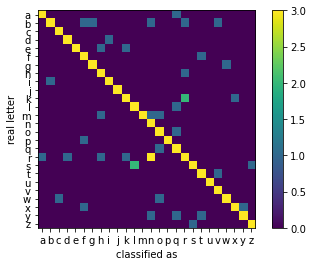

847


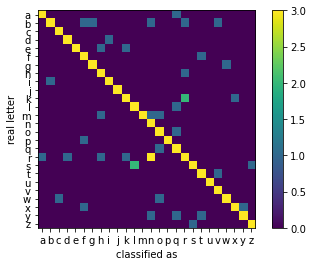

848


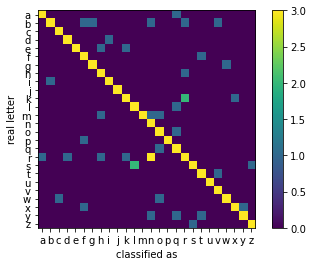

849


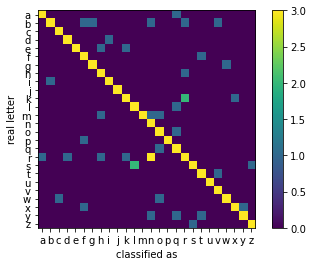

850


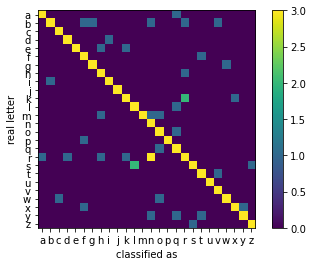

851


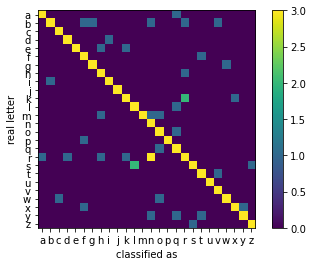

852


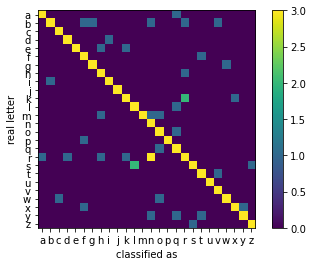

853


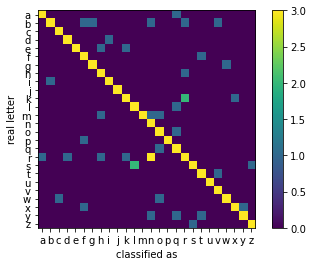

854


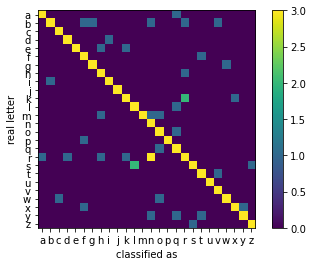

855


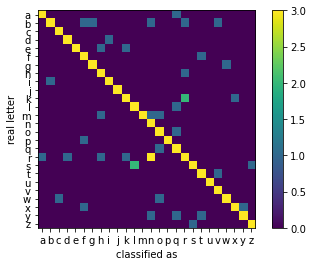

856


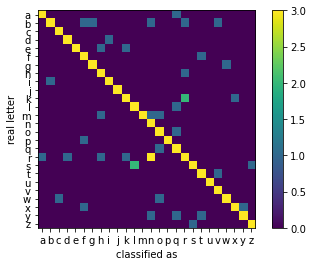

857


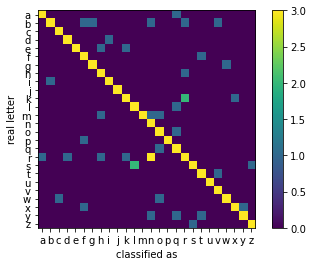

858


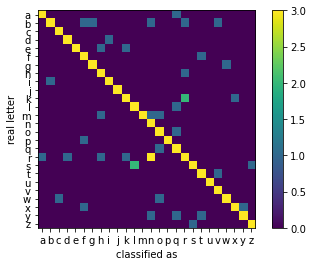

858


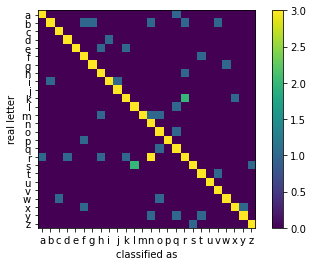

859


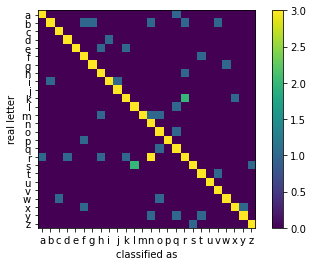

860


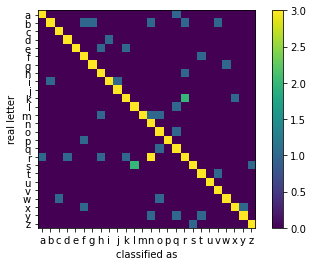

861


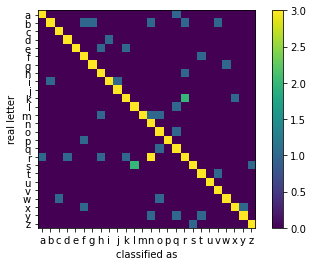

862


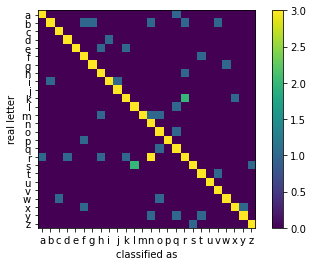

863


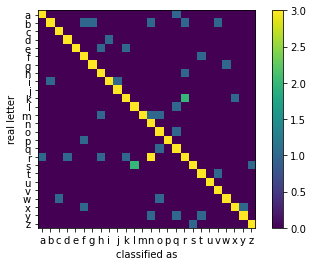

864


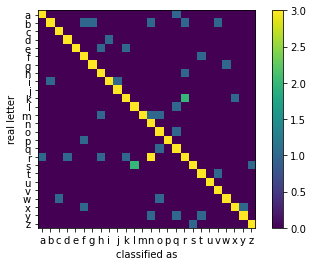

865


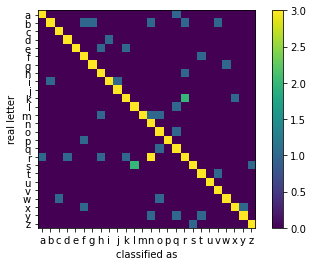

866


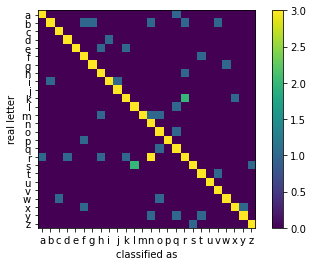

867


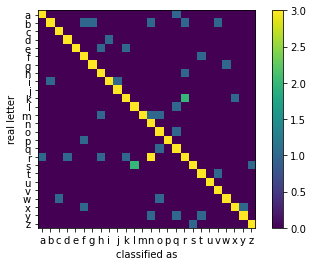

868


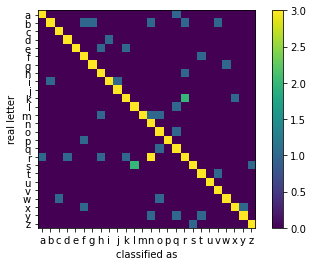

869


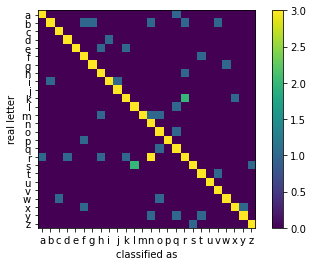

870


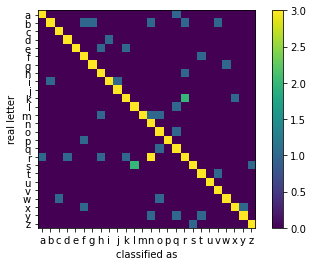

871


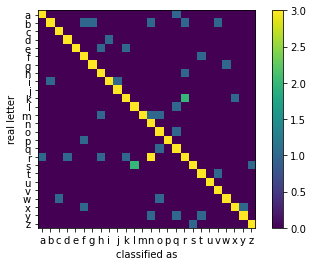

872


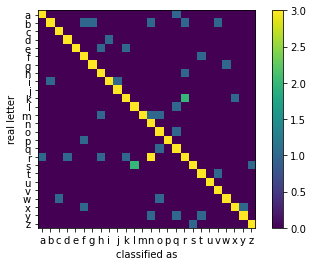

873


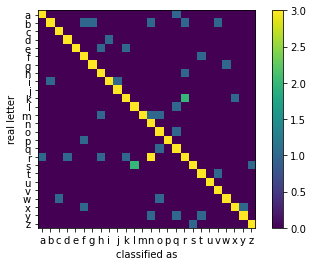

873


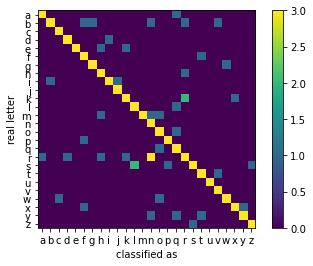

874


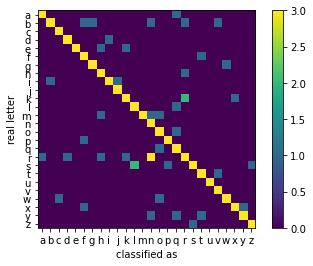

875


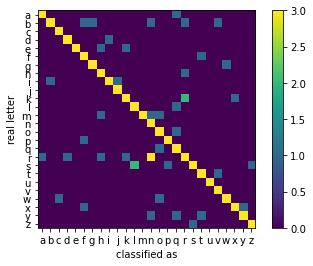

876


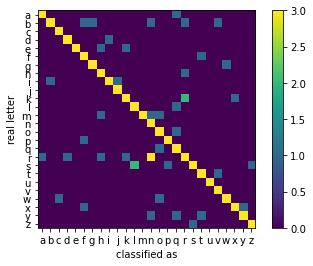

877


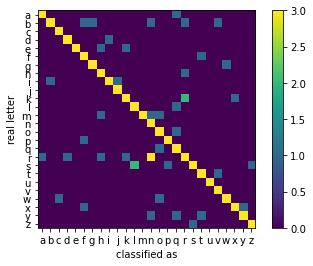

877


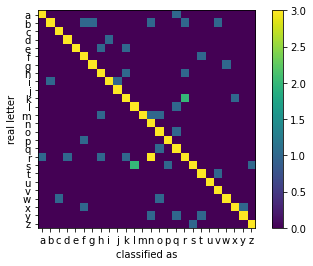

878


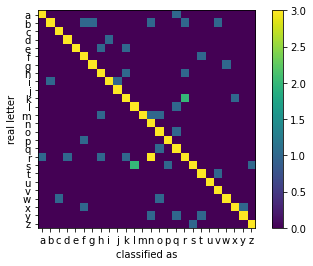

879


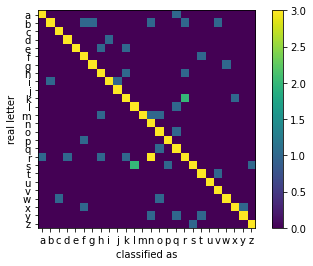

880


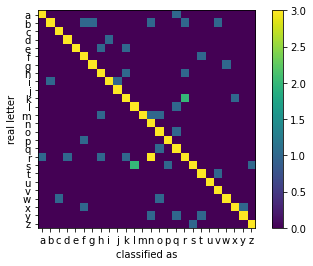

881


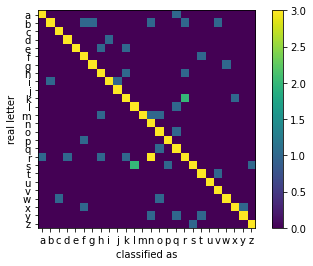

882


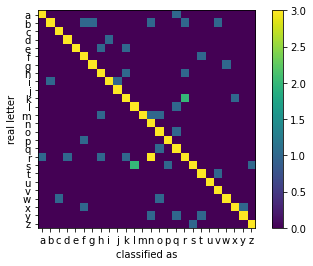

883


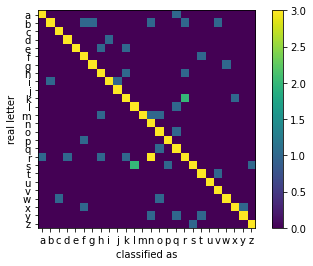

884


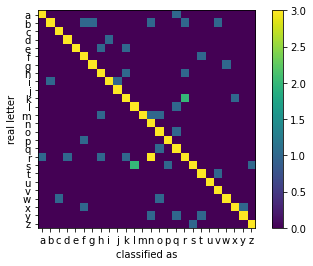

885


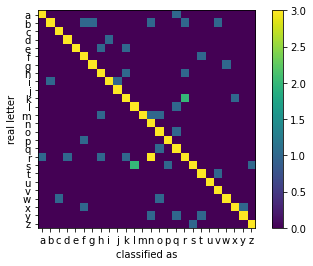

886


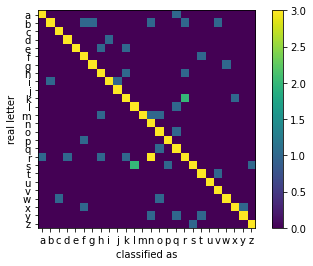

887


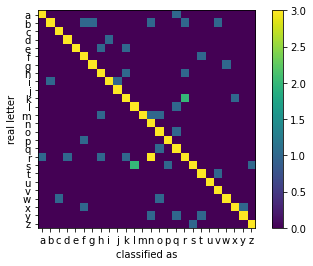

888


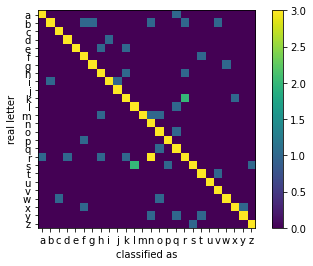

889


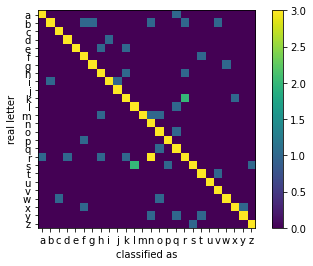

890


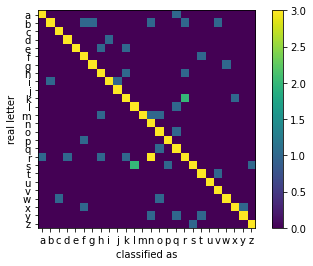

891


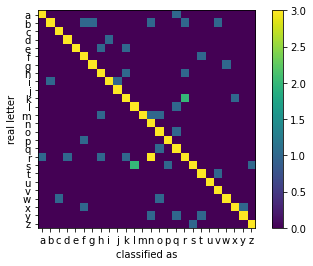

892


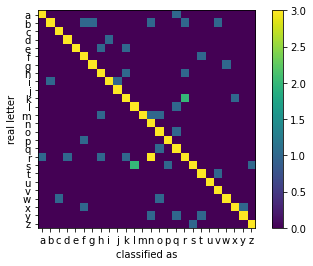

893


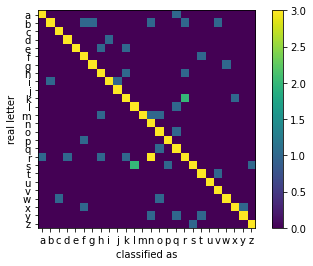

894


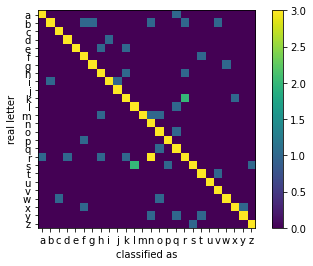

894


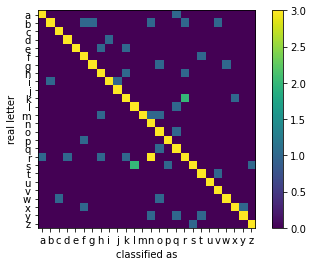

895


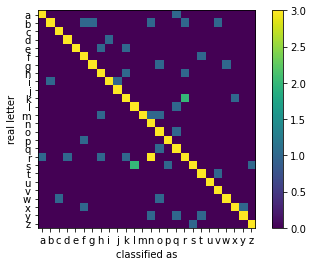

896


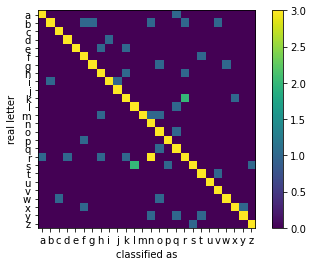

897


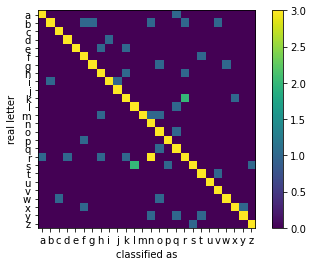

898


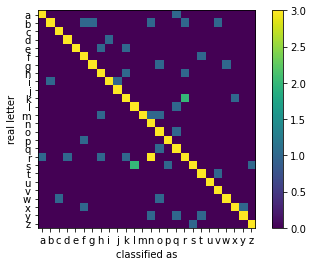

899


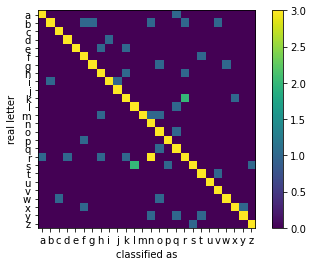

900


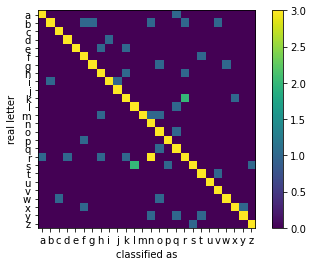

901


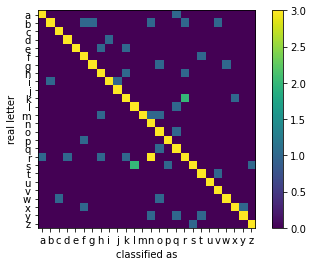

902


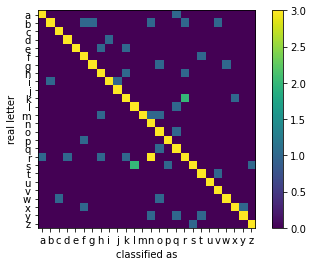

903


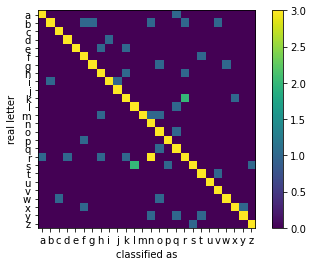

904


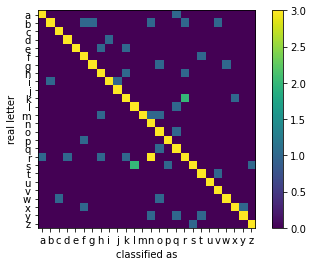

905


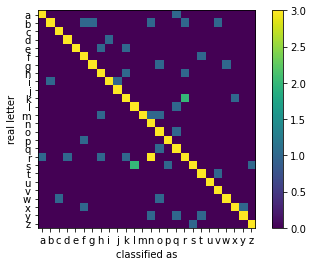

906


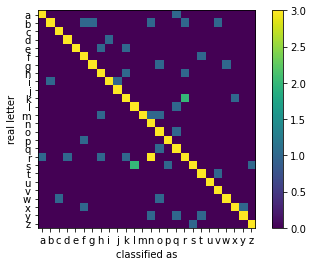

907


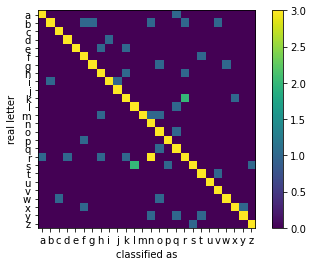

908


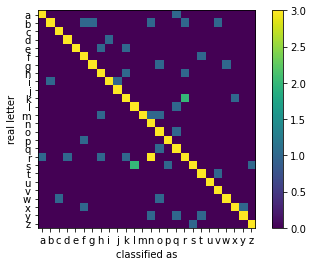

909


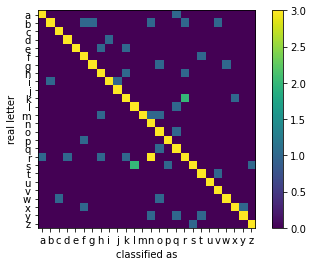

909


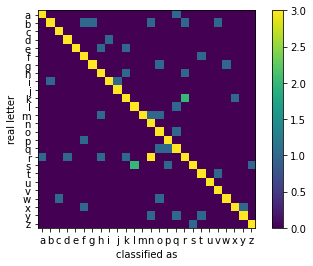

910


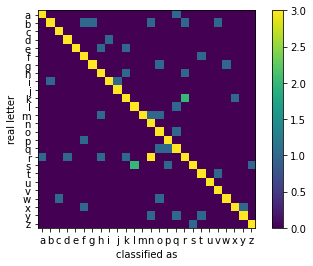

911


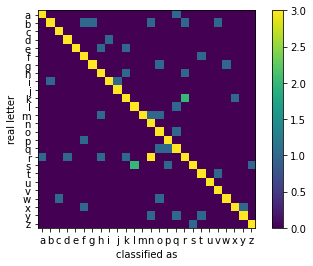

912


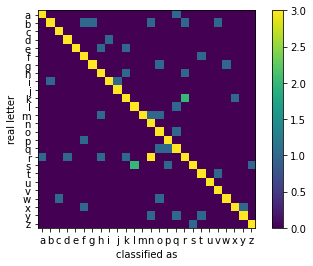

913


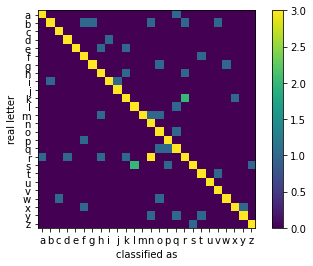

914


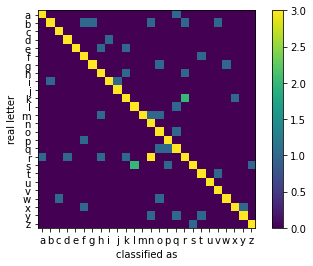

914


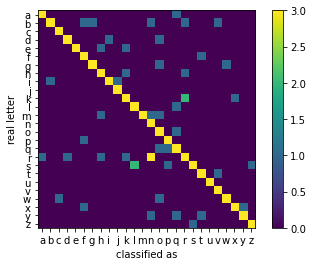

915


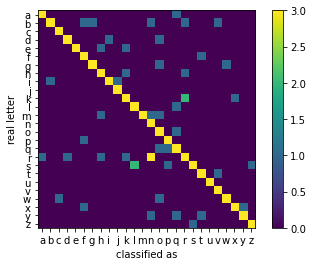

916


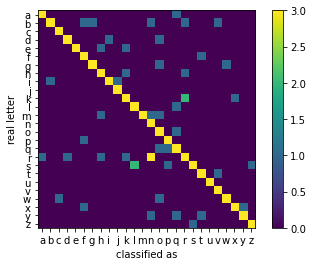

917


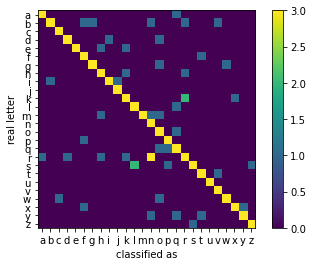

918


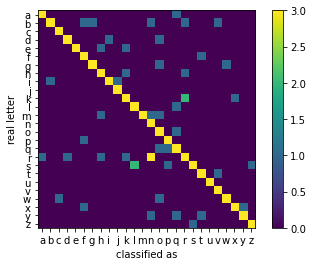

919


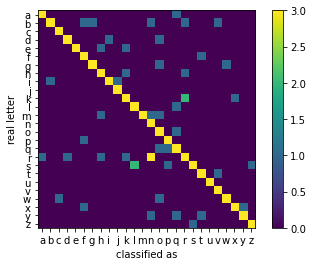

920


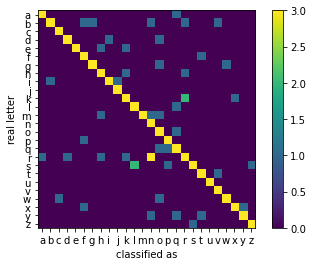

921


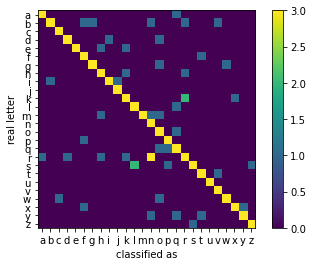

922


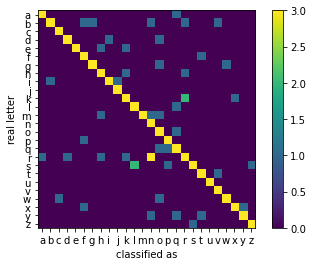

923


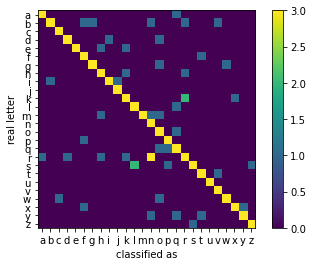

924


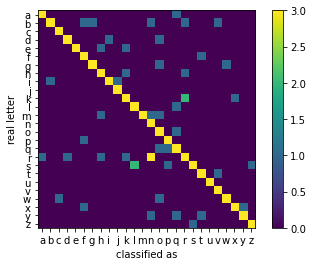

925


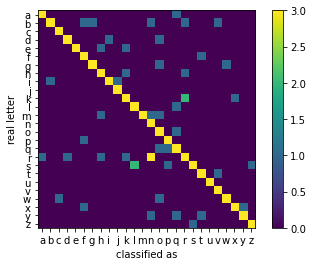

926


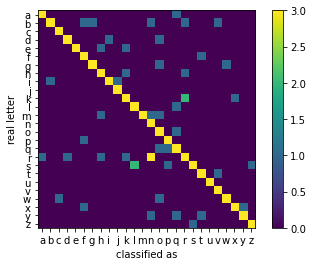

926


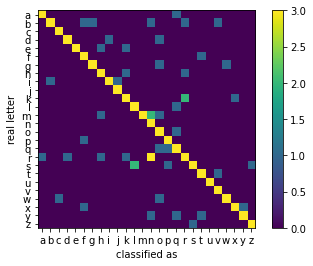

927


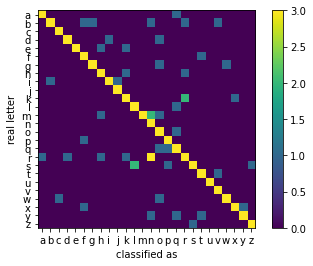

928


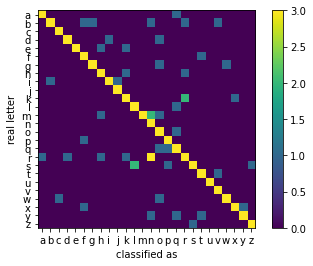

929


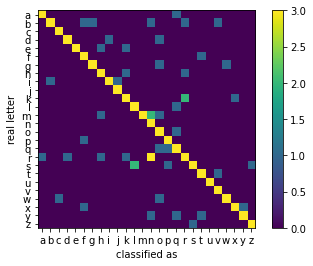

930


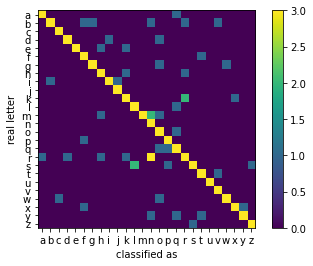

931


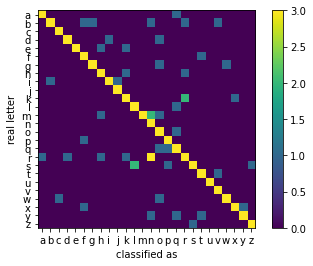

932


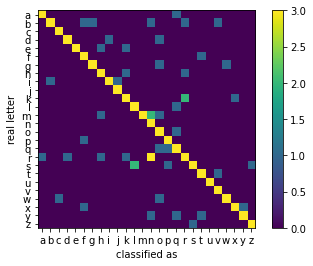

933


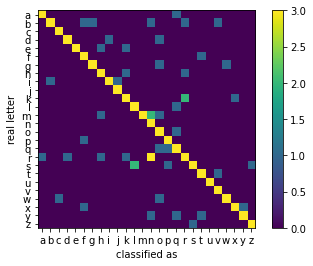

934


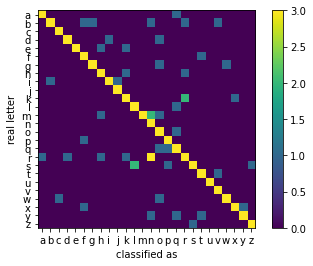

935


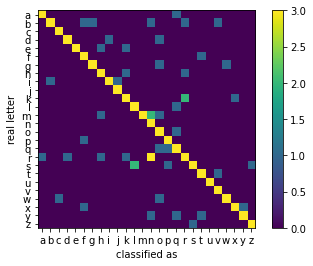

936


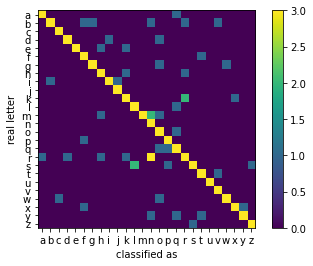

937


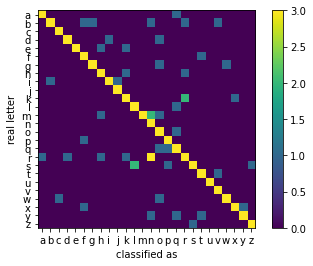

938


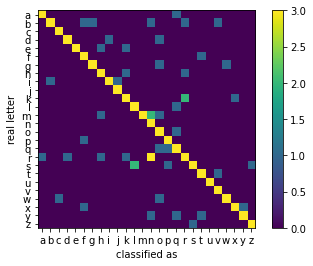

939


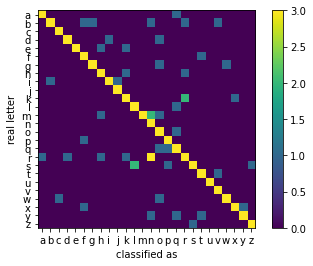

940


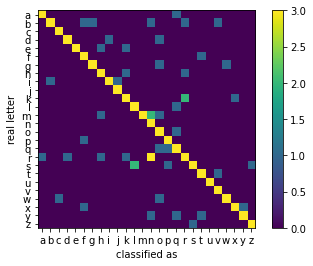

940


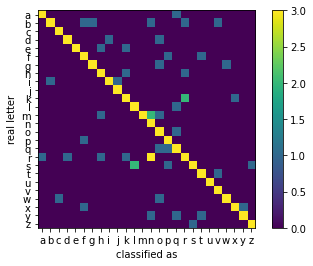

941


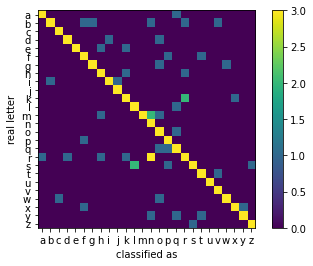

942


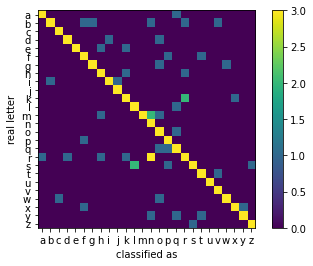

943


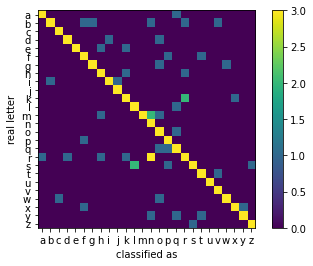

944


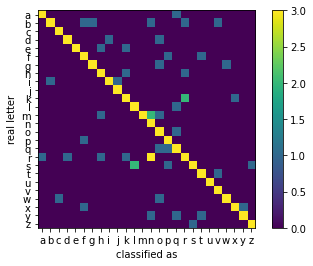

945


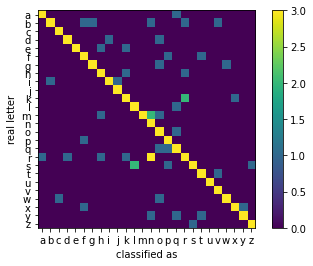

946


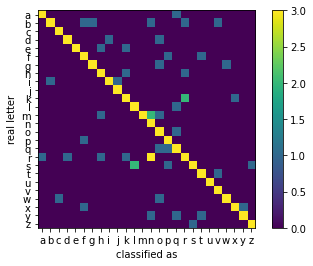

947


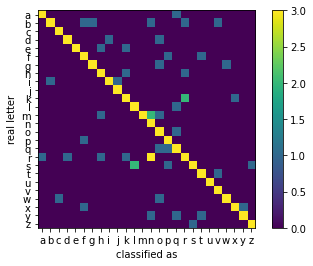

948


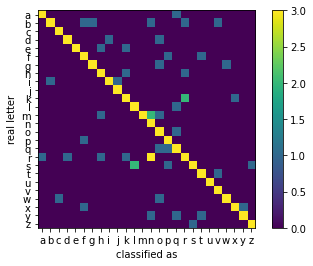

949


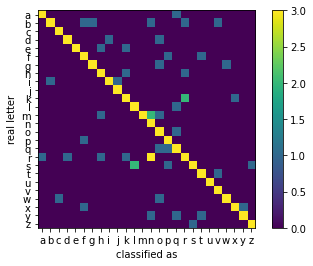

950


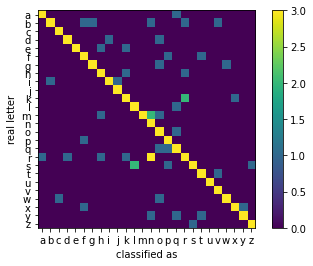

0.95 which is equal to Accuracy given by the model.evaluate


In [40]:
Itry=Ntraining
counter= 0

#Give names to the different types 1, type 2 ... type 9
class_names = ['A', 'B', 'C', 'D', 'E', 'D', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'V', 'W', 'X', 'Y', 'Z']
 
model = models.load_model('letter_classifier41.model')

CM = np.zeros((26, 26))
#Try the NN for the testing values
for i in range(20000-Ntraining):
    prediction= model.predict(df.drop(columns='class').iloc[[Itry+i]])
    index=np.argmax(prediction)
    
    if (index==int(df['class'].iloc[[Itry+i]])):
        counter=counter + 1
    print(counter)
    
    CM[index][int(df['class'].iloc[[Itry+i]])]= CM[index][int(df['class'].iloc[[Itry+i]])]+1
    plt.xticks([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25], ["a","b","c","d","e","f","g","h","i","j","k","l","m"
,"n","o","p","q","r","s","t","u","v","w","x","y","z"])
    plt.yticks([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25], ["a","b","c","d","e","f","g","h","i","j","k","l","m"
,"n","o","p","q","r","s","t","u","v","w","x","y","z"])
    plt.xlabel('classified as')
    plt.ylabel('real letter')
    plt.imshow(CM)
    plt.clim(0, 3)
    plt.colorbar()
    plt.show()

#Get the accuracy over the testing sample
print(counter/1000, 'which is equal to Accuracy given by the model.evaluate')

#  THINGS THAT WENT WRONG!

 # IMPORT DATASET 1

In [ ]:
data = arff.loadarff('letter-recognition.arff')
df = pd.DataFrame(data[0])

Ntraining=15000 #Total is 20k

training_images_df=df.drop(columns='class')[:Ntraining]
testing_images_df=df.drop(columns='class')[Ntraining:]

training_labels_df=df['class'][:Ntraining]
testing_labels_df=df['class'][Ntraining:]

training_images_df=training_images_df.to_numpy()
training_labels_df=training_labels_df.to_numpy(dtype='str')
testing_images_df=testing_images_df.to_numpy()
testing_labels_df=testing_labels_df.to_numpy(dtype='str')

print(testing_images_df)

#training_images=[]
training_labels=[]
#testing_images=[]
testing_labels=[]

for i in range(len(training_labels_df)):
    #training_images.append(training_images_df[i])
    training_labels.append(training_labels_df[i])
for i in range(len(testing_labels_df)):
    #testing_images.append(testing_images_df[i])
    testing_labels.append(testing_labels_df[i])
    
for i in range (len(training_labels)):
    training_labels[i]=ord(training_labels[i])
    
for i in range (len(testing_labels)):
    testing_labels[i]=ord(testing_labels[i])

training_lables=np.array(training_labels)
testing_labels=np.array(testing_labels)

training_labels=np.reshape((2,2))se(training_labels)
testing_labels=np.transpose(testing_labels)


print(testing_labels)

In [59]:
#Create the NN (Convolutionals between MaxPoolings, Flatten, Dense layer and then get probabilities)
model=models.Sequential()
model.add(layers.Dense(16,activation='relu',input_shape = (16,)))
model.add(layers.Dense(100,activation= 'relu'))
model.add(layers.Dense(100,activation= 'relu'))
model.add(layers.Dense(8, activation='relu'))
model.add(layers.Dense(100,activation= 'relu'))
#Flatten the input for the result
model.add(layers.Flatten())
#Now a dense layer
model.add(layers.Dense(32, activation='relu'))
#Finally let's get probabilities
model.add(layers.Dense(26,activation='softmax'))

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

#We say how many times the NN will see the training data (the generations I supose)
model.fit(training_images, training_labels, epochs=100, validation_data=(testing_images, testing_labels))

loss, accuracy = model.evaluate(testing_images, testing_labels)
print(f"Loss: {loss}")
print(f"Accuracy: {accuracy}")

model.save('letter_classifier.model')

Epoch 1/100
469/469 [==============================] - 1s 1ms/step - loss: 2.1253 - accuracy: 0.3409 - val_loss: 1.5900 - val_accuracy: 0.4906
Epoch 2/100
469/469 [==============================] - 0s 980us/step - loss: 1.3890 - accuracy: 0.5600 - val_loss: 1.2874 - val_accuracy: 0.5806
Epoch 3/100
469/469 [==============================] - 0s 966us/step - loss: 1.1574 - accuracy: 0.6285 - val_loss: 1.1317 - val_accuracy: 0.6170
Epoch 4/100
469/469 [==============================] - 1s 1ms/step - loss: 1.0207 - accuracy: 0.6715 - val_loss: 1.0280 - val_accuracy: 0.6766
Epoch 5/100
469/469 [==============================] - 1s 1ms/step - loss: 0.8932 - accuracy: 0.7165 - val_loss: 0.9191 - val_accuracy: 0.7186
Epoch 6/100
469/469 [==============================] - 0s 923us/step - loss: 0.8236 - accuracy: 0.7410 - val_loss: 0.8541 - val_accuracy: 0.7356
Epoch 7/100
469/469 [==============================] - 0s 1ms/step - loss: 0.7513 - accuracy: 0.7625 - val_loss: 0.8065 - val_accuracy: 

In [63]:
#Create the NN  (Dense layer and then get probabilities)
model=models.Sequential()
model.add(layers.Dense(16,activation='relu',input_shape = (16,)))
model.add(layers.Dense(100,activation= 'relu'))
model.add(layers.Dense(32,activation= 'relu'))
model.add(layers.Dense(8, activation='relu'))
model.add(layers.Dense(32,activation= 'relu'))
model.add(layers.Dense(8,activation= 'relu'))
model.add(layers.Dense(32, activation='relu'))
#Finally let's get probabilities
model.add(layers.Dense(26,activation='softmax'))

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

#We say how many times the NN will see the training data (the generations I supose)
model.fit(training_images, training_labels, epochs=200, validation_data=(testing_images, testing_labels))

loss, accuracy = model.evaluate(testing_images, testing_labels)
print(f"Loss: {loss}")
print(f"Accuracy: {accuracy}")

model.save('letter_classifier2.model')

Epoch 1/200
469/469 [==============================] - 1s 3ms/step - loss: 2.6404 - accuracy: 0.1891 - val_loss: 2.1006 - val_accuracy: 0.3238
Epoch 2/200
469/469 [==============================] - 1s 2ms/step - loss: 1.8122 - accuracy: 0.4240 - val_loss: 1.6201 - val_accuracy: 0.5108
Epoch 3/200
469/469 [==============================] - 1s 2ms/step - loss: 1.5172 - accuracy: 0.5351 - val_loss: 1.4467 - val_accuracy: 0.5576
Epoch 4/200
469/469 [==============================] - 1s 2ms/step - loss: 1.3568 - accuracy: 0.5797 - val_loss: 1.3576 - val_accuracy: 0.5712
Epoch 5/200
469/469 [==============================] - 1s 2ms/step - loss: 1.2554 - accuracy: 0.6053 - val_loss: 1.2490 - val_accuracy: 0.5990
Epoch 6/200
469/469 [==============================] - 1s 2ms/step - loss: 1.1762 - accuracy: 0.6212 - val_loss: 1.2551 - val_accuracy: 0.6018
Epoch 7/200
469/469 [==============================] - 1s 2ms/step - loss: 1.1271 - accuracy: 0.6408 - val_loss: 1.1415 - val_accuracy: 0.6362

Epoch 58/200
469/469 [==============================] - 1s 2ms/step - loss: 0.3632 - accuracy: 0.8817 - val_loss: 0.4690 - val_accuracy: 0.8616
Epoch 59/200
469/469 [==============================] - 1s 2ms/step - loss: 0.3524 - accuracy: 0.8863 - val_loss: 0.4599 - val_accuracy: 0.8632
Epoch 60/200
469/469 [==============================] - 1s 2ms/step - loss: 0.3645 - accuracy: 0.8819 - val_loss: 0.4473 - val_accuracy: 0.8628
Epoch 61/200
469/469 [==============================] - 1s 2ms/step - loss: 0.3507 - accuracy: 0.8861 - val_loss: 0.4240 - val_accuracy: 0.8714
Epoch 62/200
469/469 [==============================] - 1s 2ms/step - loss: 0.3468 - accuracy: 0.8885 - val_loss: 0.4388 - val_accuracy: 0.8632
Epoch 63/200
469/469 [==============================] - 1s 2ms/step - loss: 0.3452 - accuracy: 0.8853 - val_loss: 0.4359 - val_accuracy: 0.8674
Epoch 64/200
469/469 [==============================] - 1s 2ms/step - loss: 0.3455 - accuracy: 0.8880 - val_loss: 0.4243 - val_accuracy:

Epoch 115/200
469/469 [==============================] - 1s 2ms/step - loss: 0.2271 - accuracy: 0.9253 - val_loss: 0.4097 - val_accuracy: 0.8824
Epoch 116/200
469/469 [==============================] - 1s 2ms/step - loss: 0.2265 - accuracy: 0.9239 - val_loss: 0.3981 - val_accuracy: 0.8930
Epoch 117/200
469/469 [==============================] - 1s 2ms/step - loss: 0.2245 - accuracy: 0.9241 - val_loss: 0.3985 - val_accuracy: 0.8850
Epoch 118/200
469/469 [==============================] - 1s 2ms/step - loss: 0.2352 - accuracy: 0.9208 - val_loss: 0.4463 - val_accuracy: 0.8822
Epoch 119/200
469/469 [==============================] - 1s 2ms/step - loss: 0.2220 - accuracy: 0.9267 - val_loss: 0.4623 - val_accuracy: 0.8776
Epoch 120/200
469/469 [==============================] - 1s 2ms/step - loss: 0.2226 - accuracy: 0.9286 - val_loss: 0.3814 - val_accuracy: 0.8942
Epoch 121/200
469/469 [==============================] - 1s 2ms/step - loss: 0.2244 - accuracy: 0.9266 - val_loss: 0.3618 - val_ac